In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.cbook as cbook

In [2]:
tmpDf = pd.read_csv('../RawData/'+'[new] yancheng_train_20171226_2.csv')

c:\ricy\python\lib\site-packages\IPython\core\interactiveshell.py:2698: DtypeWarning: Columns (20,22) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [3]:
df = tmpDf[['sale_date', 'class_id', 'price', 'sale_quantity']]

In [4]:
# df.sort_values(by=['sale_date', 'class_id', 'sale_quantity'])

In [5]:
# df.sort_values(by=['class_id', 'sale_date', 'sale_quantity'])

In [6]:
resultDf = df.groupby(['class_id', 'sale_date']).sum()

In [7]:
# -*- coding:utf-8 -*-
from statsmodels.tsa.stattools import adfuller
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# 移动平均图
def draw_trend(timeSeries, size):
    f = plt.figure(facecolor='white')
    # 对size个数据进行移动平均
    rol_mean = timeSeries.rolling(window=size).mean()
    # 对size个数据进行加权移动平均
    rol_weighted_mean = pd.ewma(timeSeries, span=size)

    timeSeries.plot(color='blue', label='Original')
    rolmean.plot(color='red', label='Rolling Mean')
    rol_weighted_mean.plot(color='black', label='Weighted Rolling Mean')
    plt.legend(loc='best')
    plt.title('Rolling Mean')
    plt.show()

def draw_ts(timeSeries):
    f = plt.figure(facecolor='white')
    timeSeries.plot(color='blue')
    plt.show()

'''
　　Unit Root Test
   The null hypothesis of the Augmented Dickey-Fuller is that there is a unit
   root, with the alternative that there is no unit root. That is to say the
   bigger the p-value the more reason we assert that there is a unit root
'''
def testStationarity(ts):
    dftest = adfuller(ts)
    # 对上述函数求得的值进行语义描述
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    return dfoutput

# 自相关和偏相关图，默认阶数为31阶
def draw_acf_pacf(ts, lags=31):
    f = plt.figure(facecolor='white')
    ax1 = f.add_subplot(211)
    plot_acf(ts, lags=31, ax=ax1)
    ax2 = f.add_subplot(212)
    plot_pacf(ts, lags=31, ax=ax2)
    plt.show()

c:\ricy\python\lib\site-packages\statsmodels\compat\pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools


851857


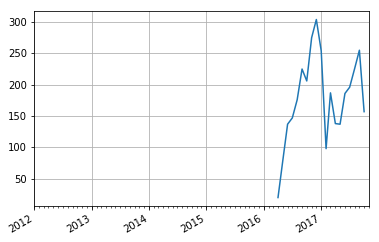

614059


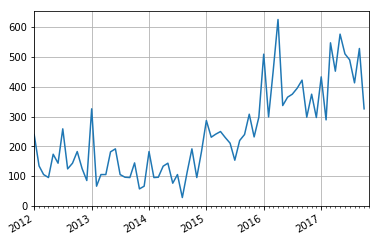

750340


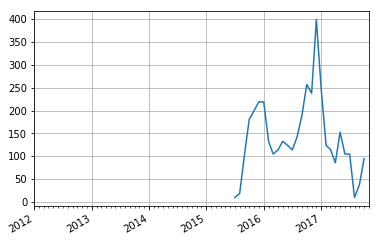

963845


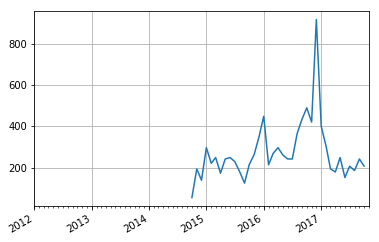

651782


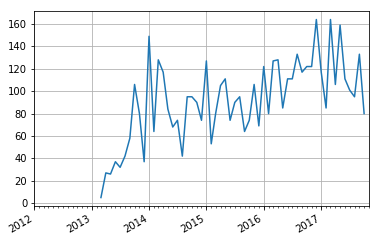

379265


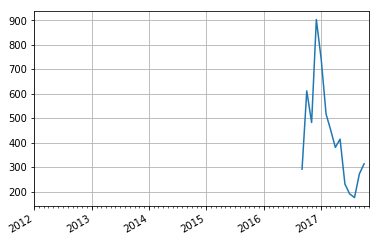

417803


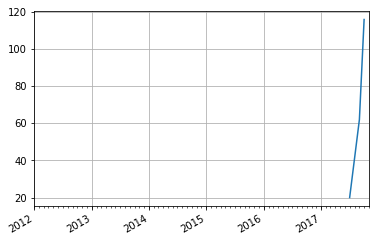

291086


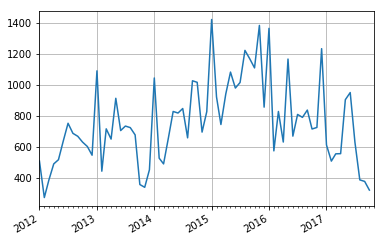

621073


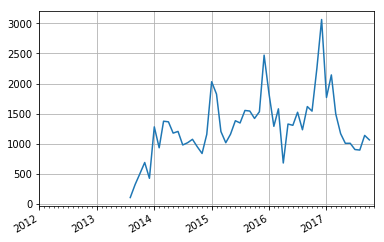

249875


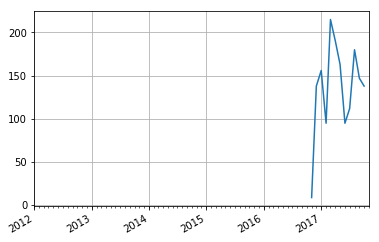

354068


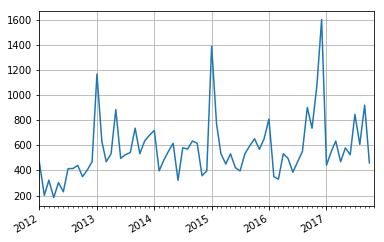

743957


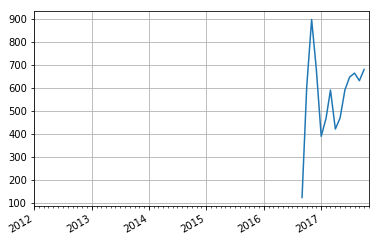

209945


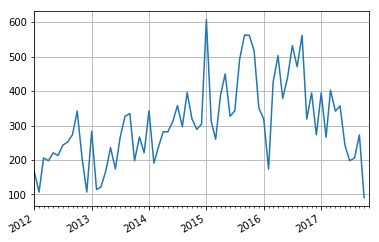

580634


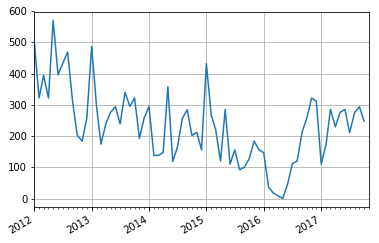

198427


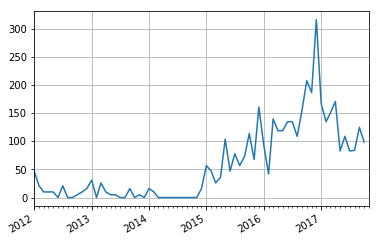

559132


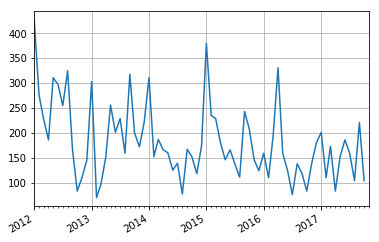

248352


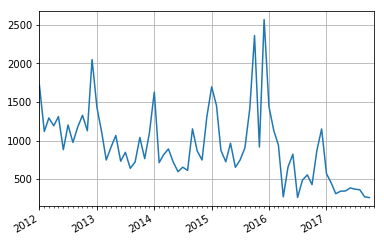

250658


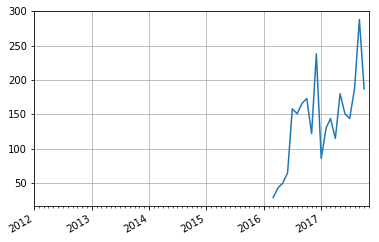

842246


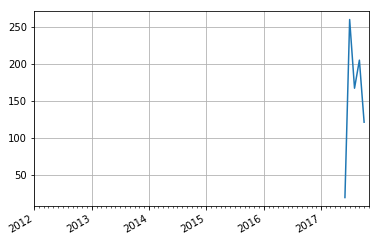

290854


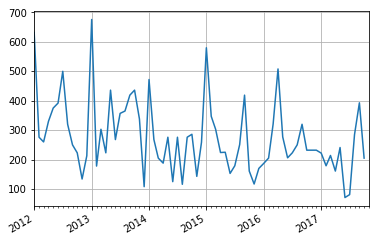

308913


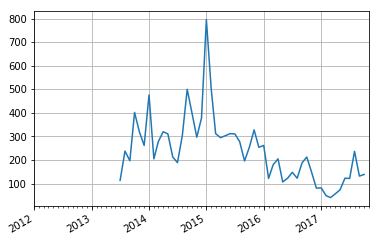

540712


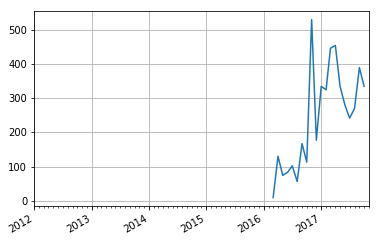

576298


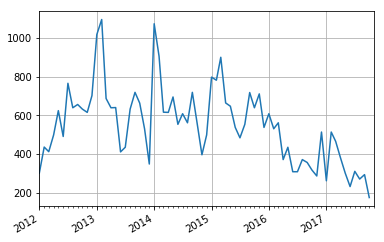

973106


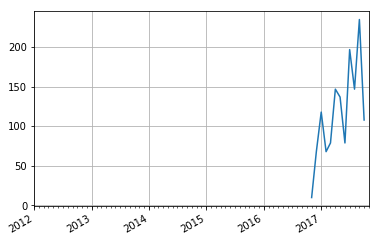

350259


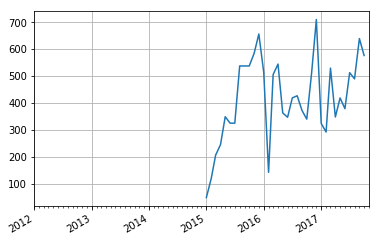

736094


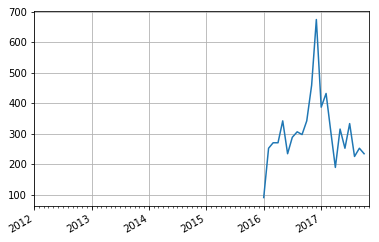

654134


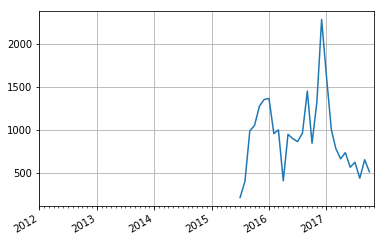

560265


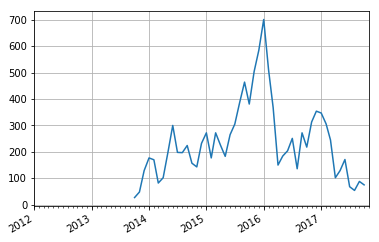

978089


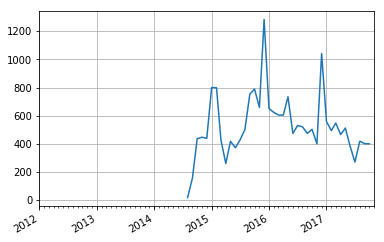

219195


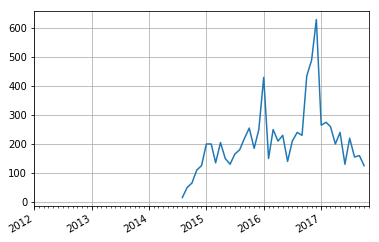

501564


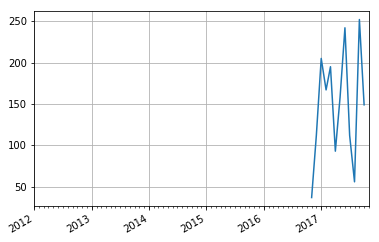

741152


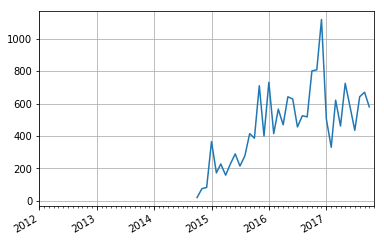

526401


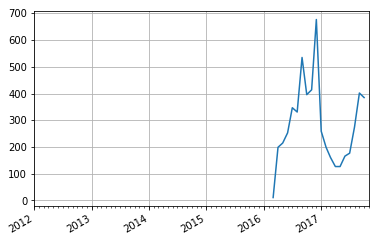

569154


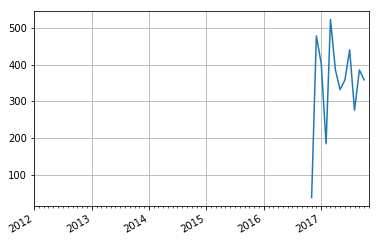

603972


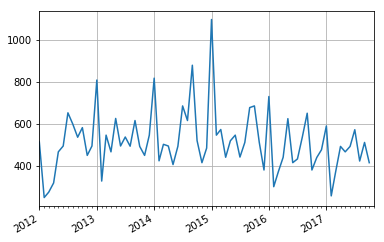

437063


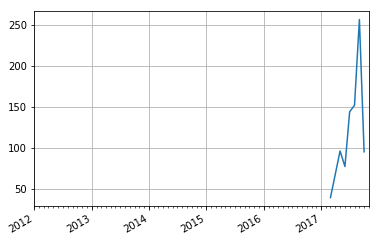

628041


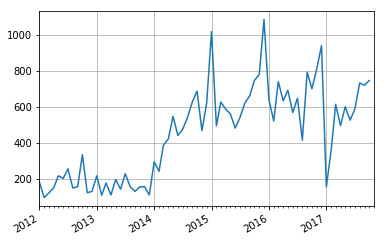

304458


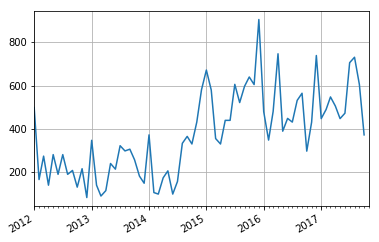

496459


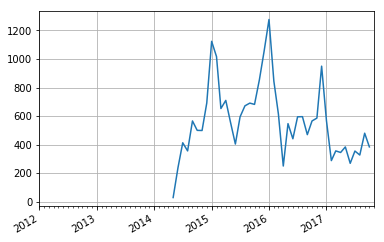

948936


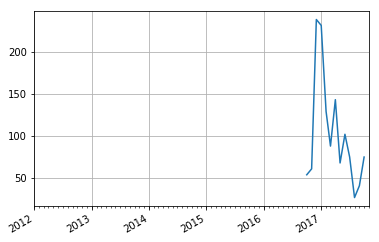

890189


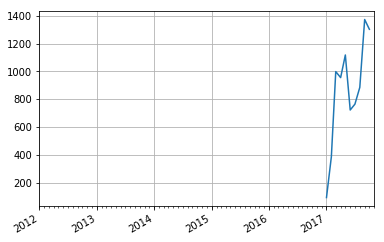

412240


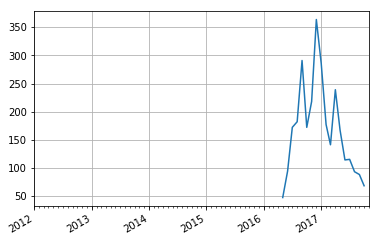

961362


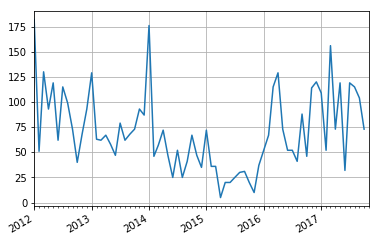

103507


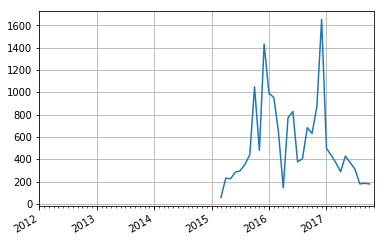

732758


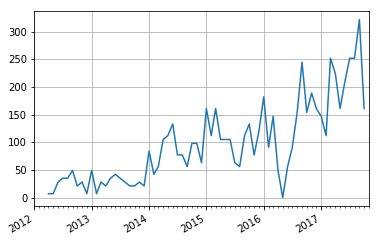

905061


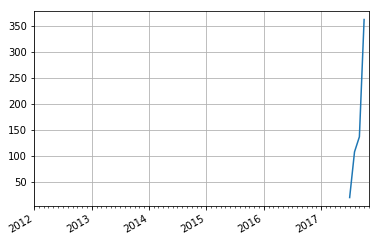

175962


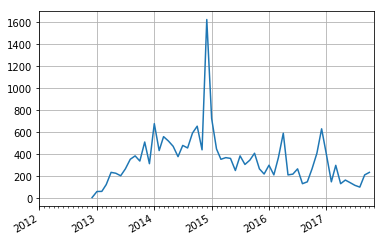

760412


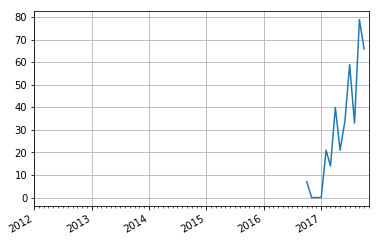

437598


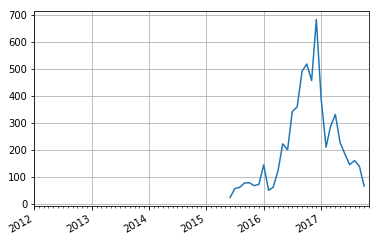

349023


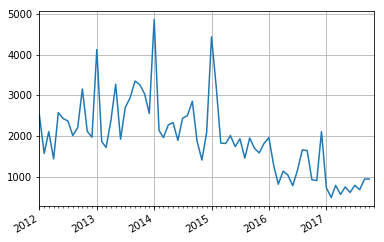

178529


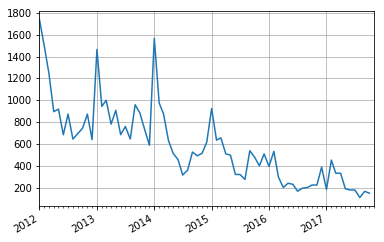

270690


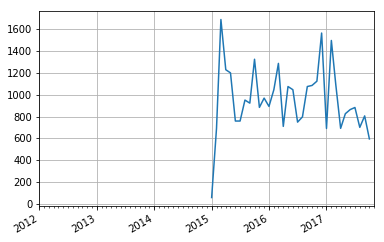

221795


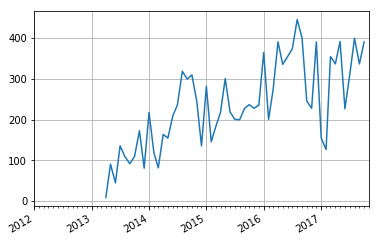

683364


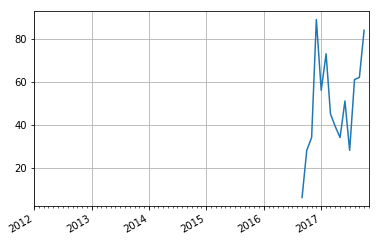

510309


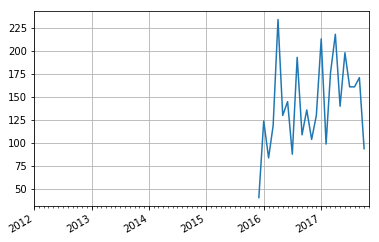

810398


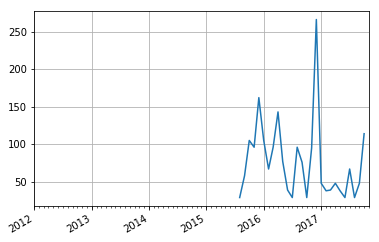

725137


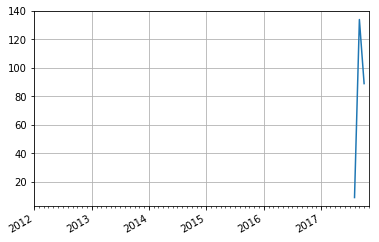

789290


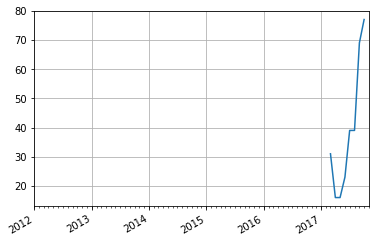

245609


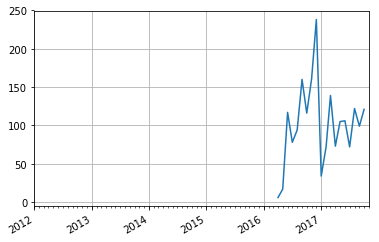

289386


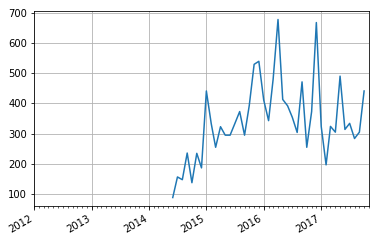

714860


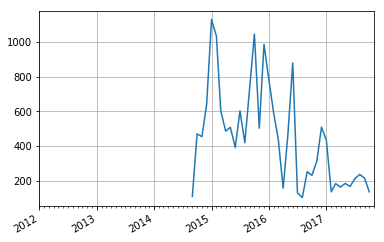

861459


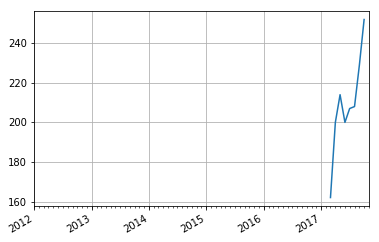

819061


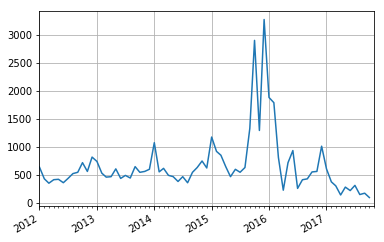

580470


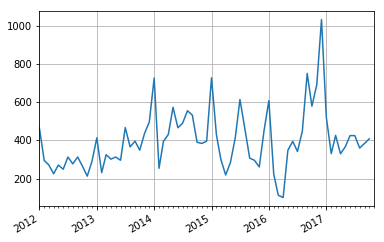

735971


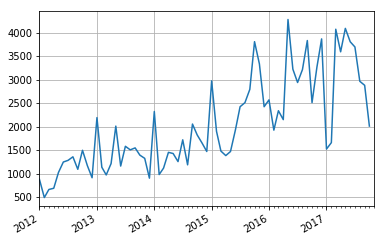

453752


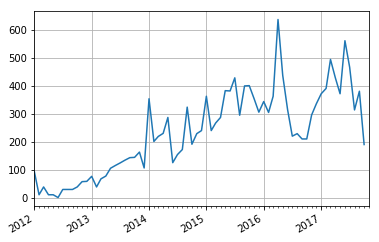

854548


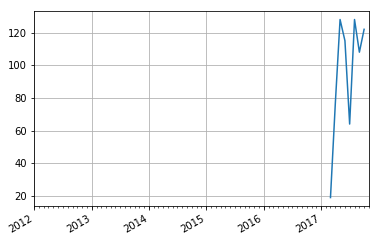

356986


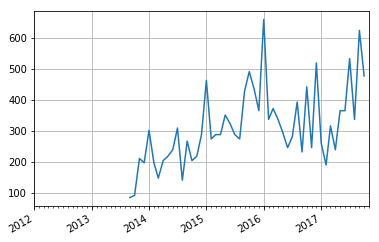

289403


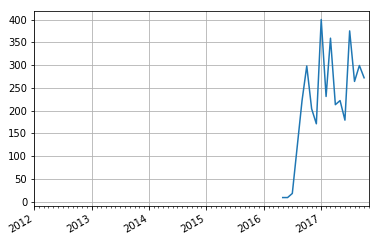

653436


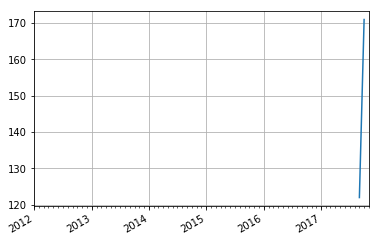

815230


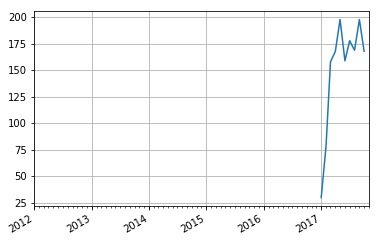

376193


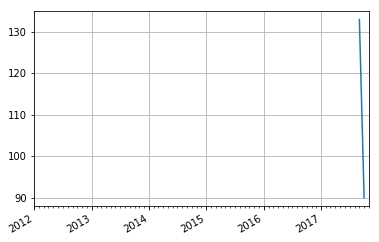

923841


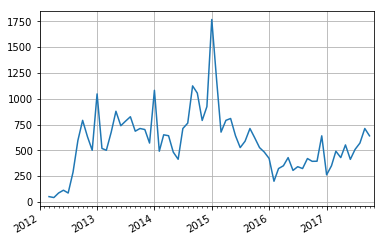

527809


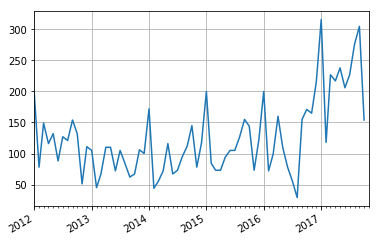

436105


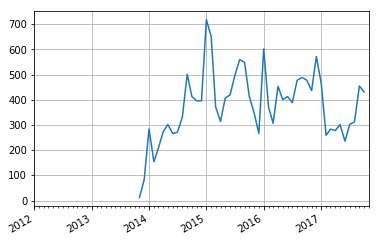

186250


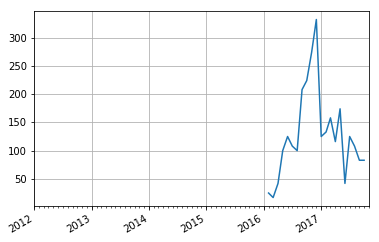

516750


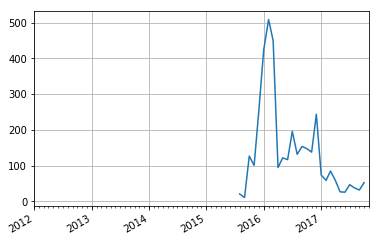

854079


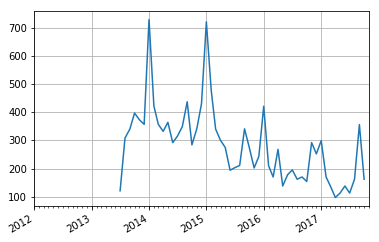

392593


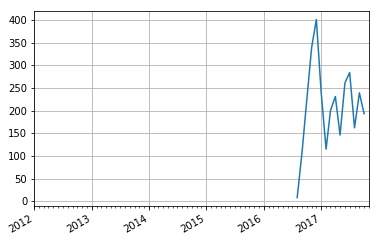

194450


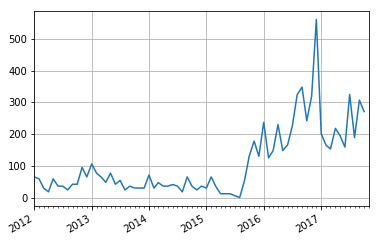

321683


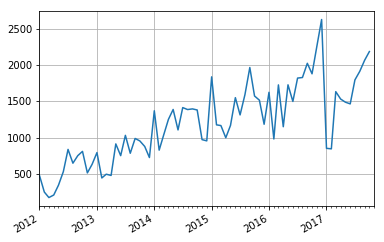

905745


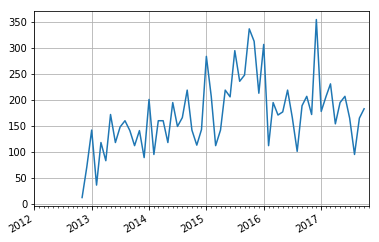

527765


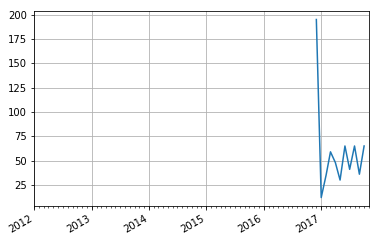

492952


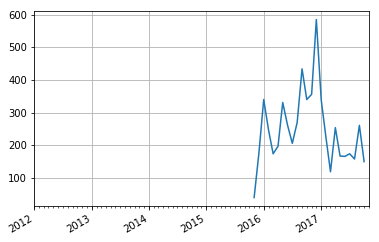

194201


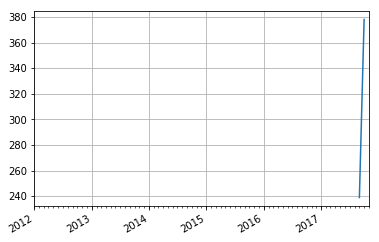

682651


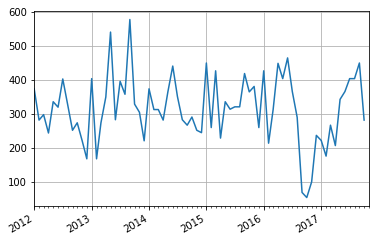

384924


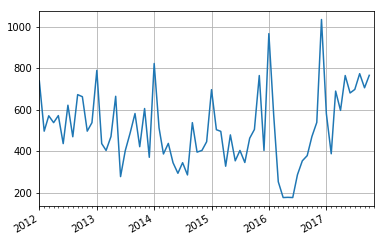

481950


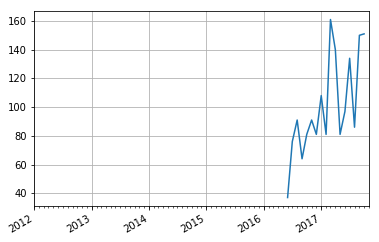

472603


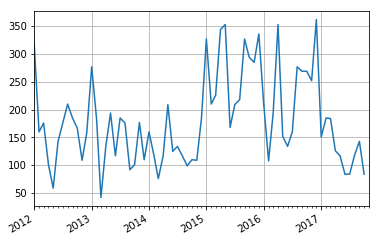

687270


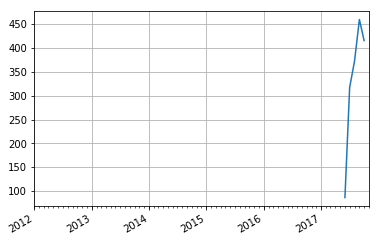

597927


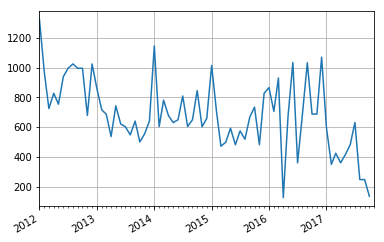

378536


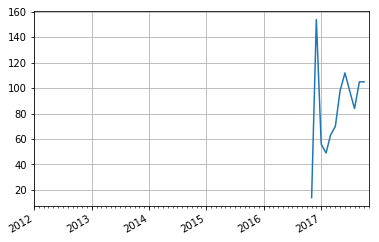

401052


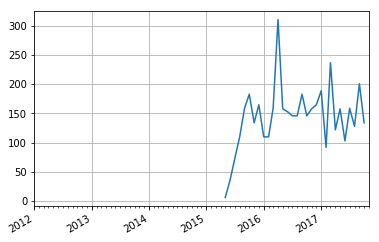

961962


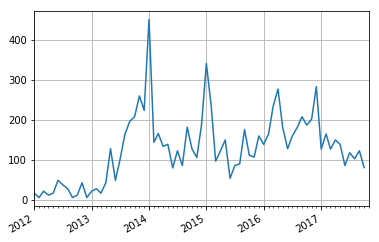

612523


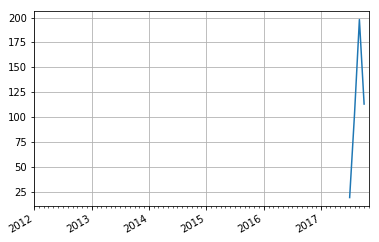

914348


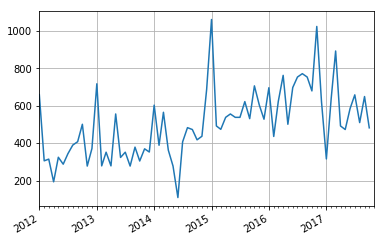

206765


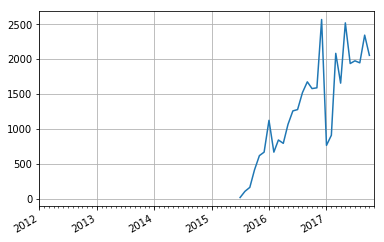

591790


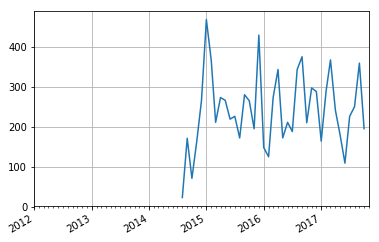

786351


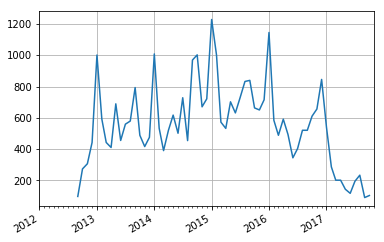

619401


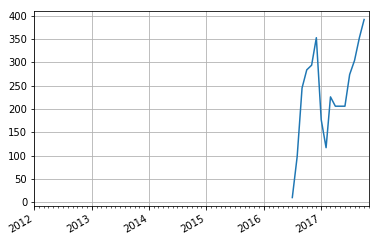

302513


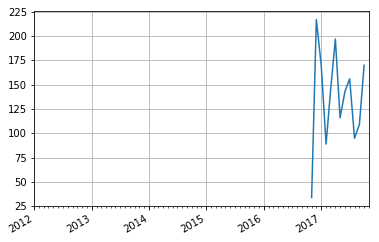

713651


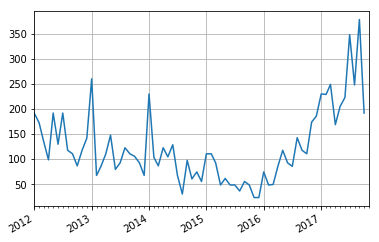

587678


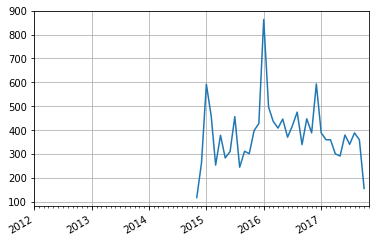

745137


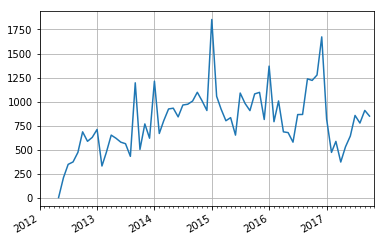

291514


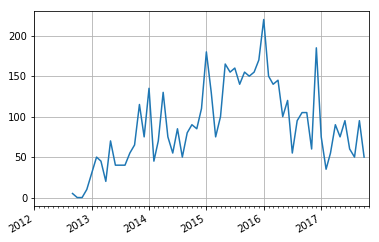

693436


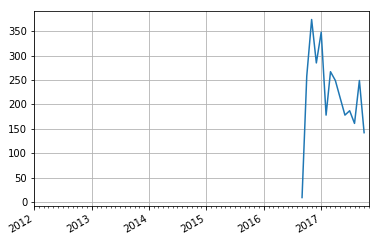

872180


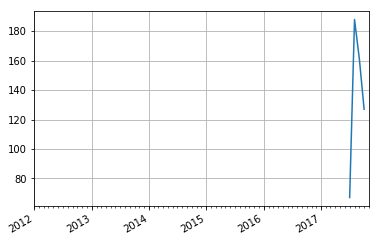

281792


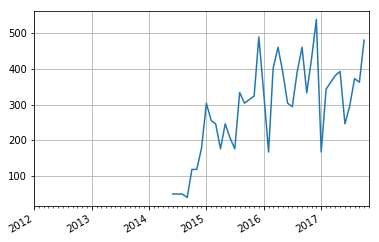

482497


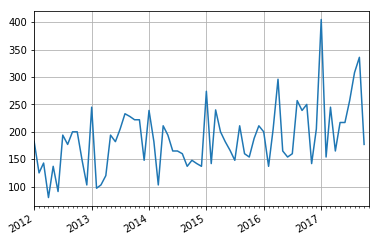

360648


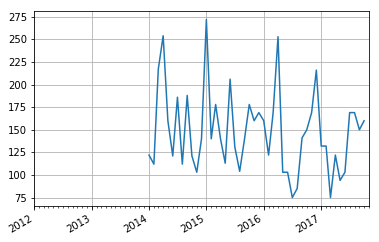

169673


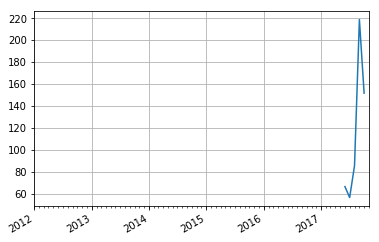

340175


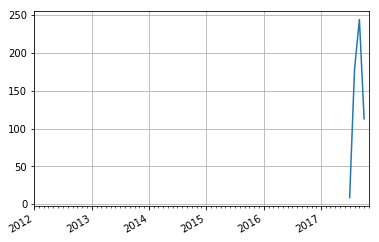

950264


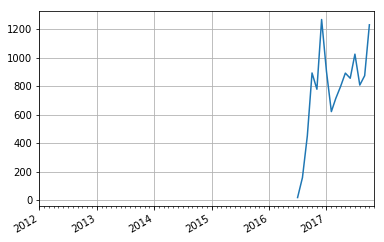

359378


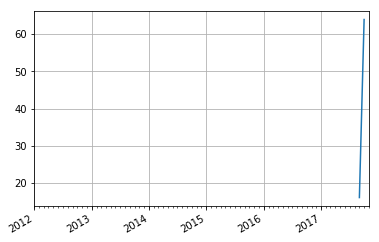

136916


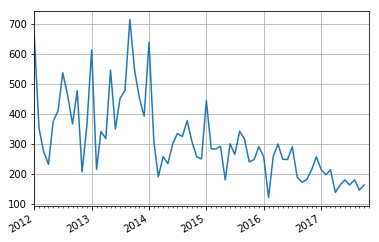

281301


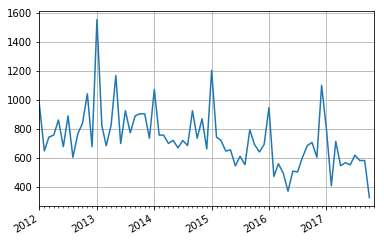

425432


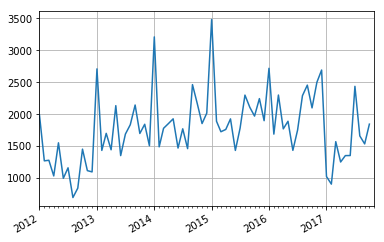

871642


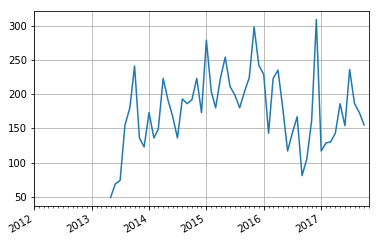

125403


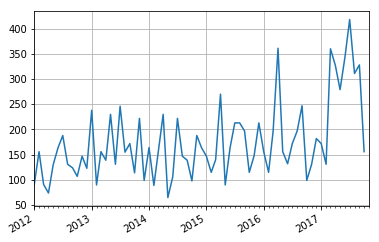

924154


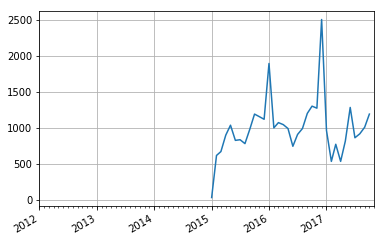

692703


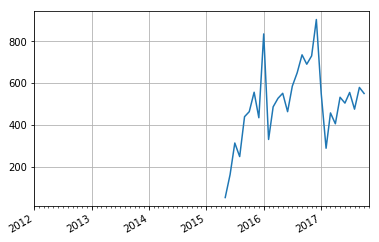

739296


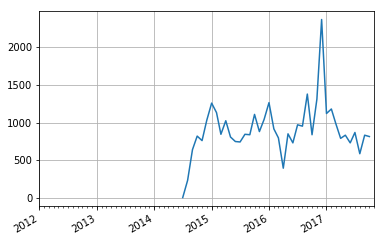

348641


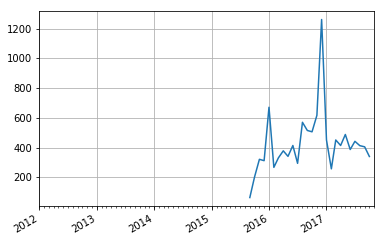

395234


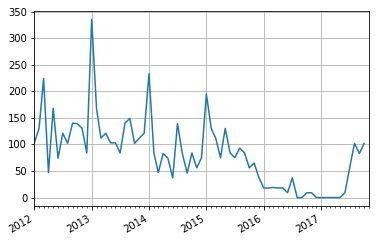

714152


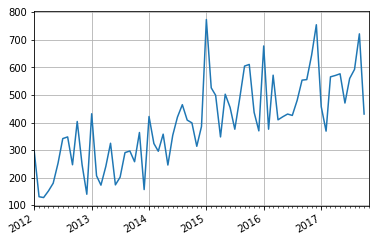

379876


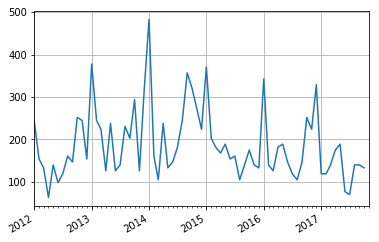

714150


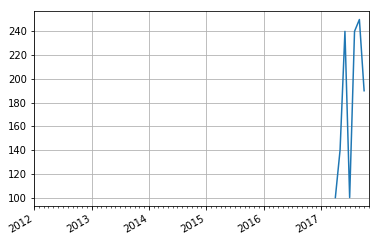

883691


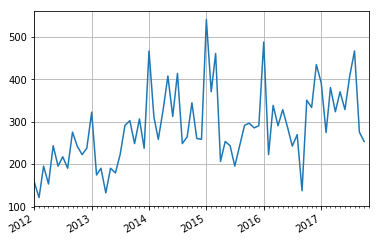

124140


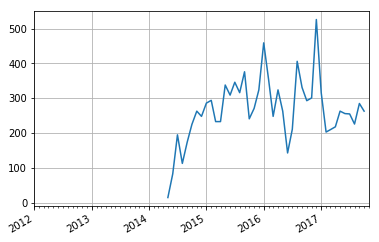

416749


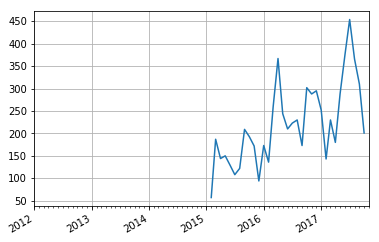

468392


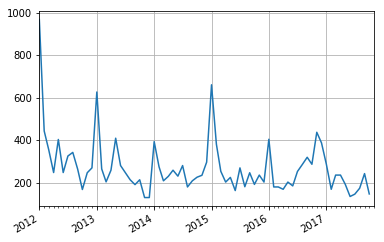

953842


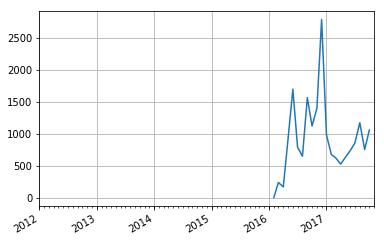

651347


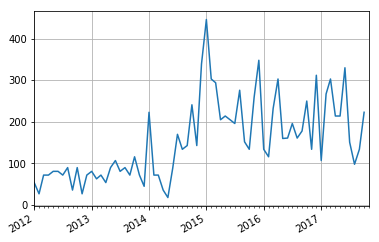

378356


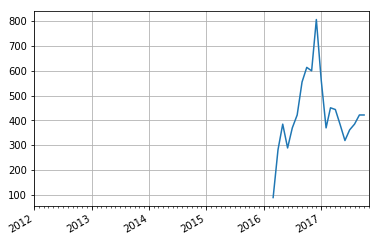

475895


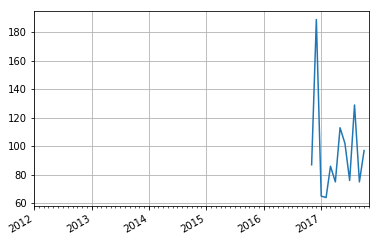

347384


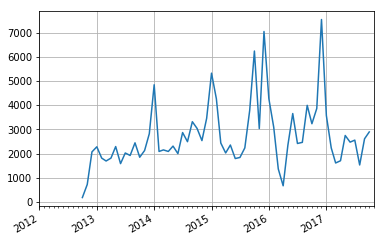

671482


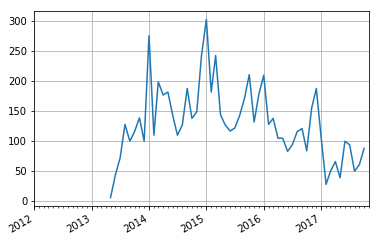

265980


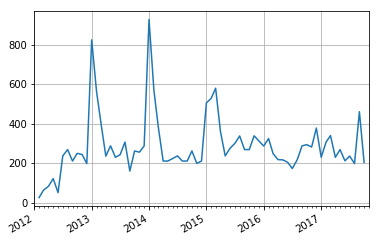

649213


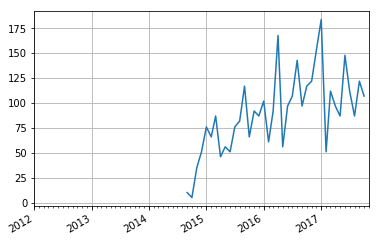

409854


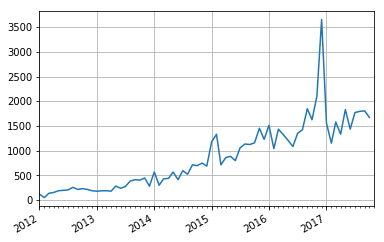

In [8]:
years = mdates.YearLocator()   # every year
months = mdates.MonthLocator()  # every month
yearsFmt = mdates.DateFormatter('%Y')

result = {}
for index, tmp in resultDf.iterrows():
    if index[0] in result:
        result[index[0]].append([index[1], tmp['sale_quantity']])
    else:
        result[index[0]] = [[index[1], tmp['sale_quantity']]]

for key, array in result.items():
    timeList = []
    for value in array:
        timeList.append(value[0])
    for index1 in range(2012, 2018):
        monthEnd = 13
        if index1 == 2017:
            monthEnd = 11
        for index2 in range(1, monthEnd):
            checkedTime = 0
            if index2 < 10:
                checkedTime = int(str(index1) + '0' + str(index2))
            else:
                checkedTime = int(str(index1) + str(index2))
            if checkedTime not in timeList and checkedTime > array[0][0]:
                array.append([checkedTime, 0])
                
def getKey(item):
    return item[0]

for key, value in result.items():
    xArray = []
    yArray = []
    value = sorted(value, key = getKey)
    print(key)
    for array in value:
        dateStr = str(array[0])
        date = pd.datetime(int(dateStr[0:4]), int(dateStr[4:6]), 1)
        sale_quantity = array[1]
        xArray.append(date)
        yArray.append(sale_quantity)
    fig, ax = plt.subplots()
    ax.plot(np.array(xArray), np.array(yArray))
    # format the ticks
    ax.xaxis.set_major_locator(years)
    ax.xaxis.set_major_formatter(yearsFmt)
    ax.xaxis.set_minor_locator(months)

    datemin = pd.datetime(2012, 1, 1)
    datemax = pd.datetime(2017, 11, 1)
    ax.set_xlim(datemin, datemax)

    ax.format_xdata = mdates.DateFormatter('%Y-%m')
#     ax.format_ydata = price
    ax.grid(True)

    # rotates and right aligns the x labels, and moves the bottom of the
    # axes up to make room for them
    fig.autofmt_xdate()

    plt.show()

In [9]:
testDf = pd.read_csv('../RawData/'+'yancheng_testA_20171225.csv')
for i in testDf['class_id'].unique():
    if i not in result:
        print('not in result: ', i)

In [10]:
sorted_result = sorted(result.items(), key=lambda x:x[1][1])

In [11]:

_tmp = [(value[0], len(value[1]))for value in sorted_result]
l = list(zip(*_tmp))
pd.DataFrame(data={'classid': l[0], 'trainlen': l[1]}).to_csv('trainlen.csv', index=False)

In [12]:
__df = pd.DataFrame(data=[[value[0], len(value[1])]for value in sorted_result])

In [45]:
import warnings; warnings.simplefilter('ignore')
from statsmodels.tsa.arima_model import ARMA
import sys
from statsmodels.tsa.stattools import adfuller
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from datetime import datetime

# 移动平均图
def draw_trend(timeSeries, size):
    f = plt.figure(facecolor='white')
    # 对size个数据进行移动平均
    rol_mean = timeSeries.rolling(window=size).mean()
    # 对size个数据进行加权移动平均
    rol_weighted_mean = pd.ewma(timeSeries, span=size)

    timeSeries.plot(color='blue', label='Original')
    rolmean.plot(color='red', label='Rolling Mean')
    rol_weighted_mean.plot(color='black', label='Weighted Rolling Mean')
    plt.legend(loc='best')
    plt.title('Rolling Mean')
    plt.show()

def draw_ts(timeSeries):
    f = plt.figure(facecolor='white')
    timeSeries.plot(color='blue')
    plt.show()

'''
　　Unit Root Test
   The null hypothesis of the Augmented Dickey-Fuller is that there is a unit
   root, with the alternative that there is no unit root. That is to say the
   bigger the p-value the more reason we assert that there is a unit root
'''
def testStationarity(ts):
    dftest = adfuller(ts)
    # 对上述函数求得的值进行语义描述
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    return dfoutput

# 自相关和偏相关图，默认阶数为31阶
def draw_acf_pacf(ts, lags=31):
    f = plt.figure(facecolor='white')
    ax1 = f.add_subplot(211)
    plot_acf(ts, lags=lags, ax=ax1)
    ax2 = f.add_subplot(212)
    plot_pacf(ts, lags=lags, ax=ax2)
    plt.show()
    
def strToDate(dateNum):
    dateStr = str(dateNum)
    return pd.datetime(int(dateStr[0:4]), int(dateStr[4:6]), 1)
def proper_model(data_ts, maxLag):
    init_bic = 100000
    init_p = 0
    init_q = 0
    init_properModel = None
    for p in np.arange(maxLag):
        for q in np.arange(maxLag):
            model = ARMA(data_ts, order=(p, q))
            try:
                results_ARMA = model.fit(disp=-1, method='css')
            except:
                continue
            bic = results_ARMA.bic
            if bic < init_bic:
                init_p = p
                init_q = q
                init_properModel = results_ARMA
                init_bic = bic
    return init_bic, init_p, init_q, init_properModel

CLASS:  961962


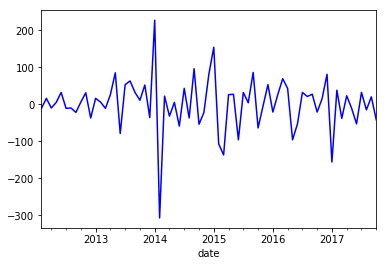

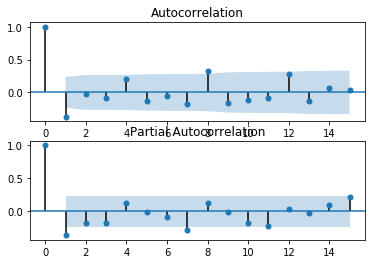

Test Statistic                -1.197590e+01
p-value                        3.802642e-22
#Lags Used                     0.000000e+00
Number of Observations Used    6.800000e+01
Critical Value (5%)           -2.905087e+00
Critical Value (1%)           -3.530399e+00
Critical Value (10%)          -2.590001e+00
dtype: float64
bic:674.782185194527 and p:14 q:0


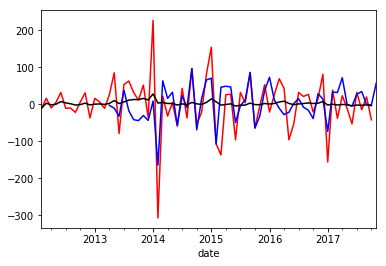

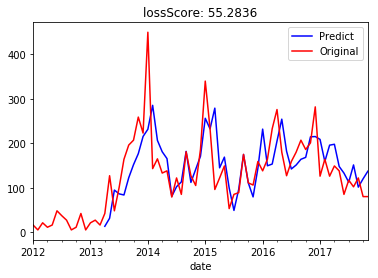

CLASS:  453752


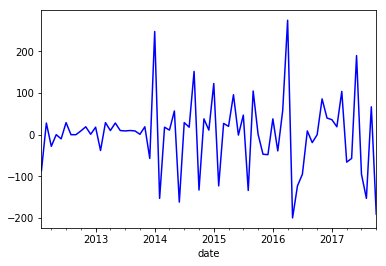

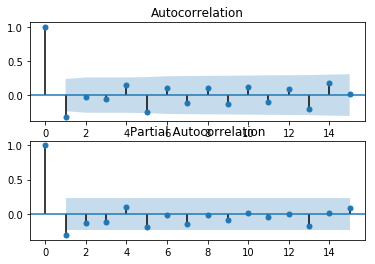

Test Statistic                -1.121555e+01
p-value                        2.073998e-20
#Lags Used                     0.000000e+00
Number of Observations Used    6.800000e+01
Critical Value (5%)           -2.905087e+00
Critical Value (1%)           -3.530399e+00
Critical Value (10%)          -2.590001e+00
dtype: float64
bic:703.4056840887387 and p:14 q:0


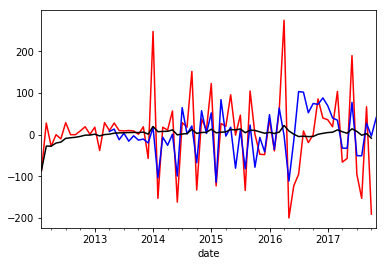

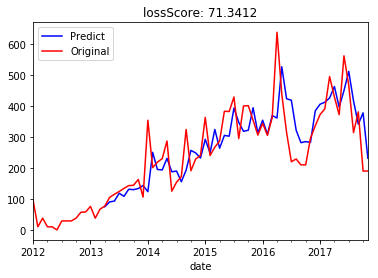

CLASS:  198427


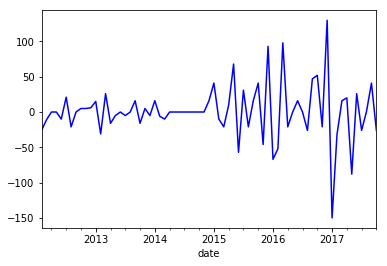

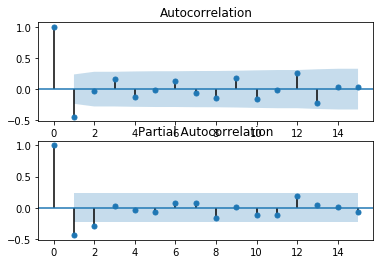

Test Statistic                -9.233243e+00
p-value                        1.656519e-15
#Lags Used                     1.000000e+00
Number of Observations Used    6.700000e+01
Critical Value (5%)           -2.905755e+00
Critical Value (1%)           -3.531955e+00
Critical Value (10%)          -2.590357e+00
dtype: float64
bic:603.0932256272738 and p:14 q:0


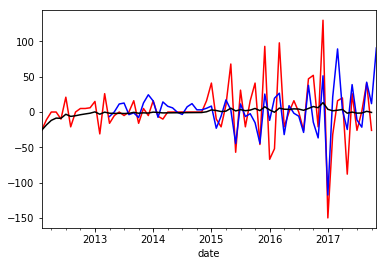

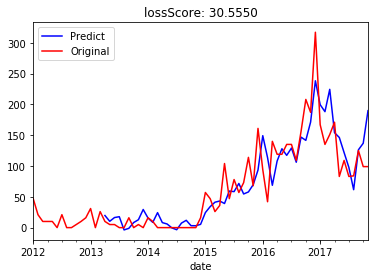

CLASS:  651347


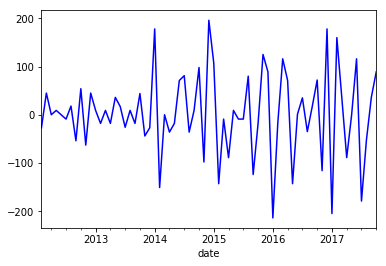

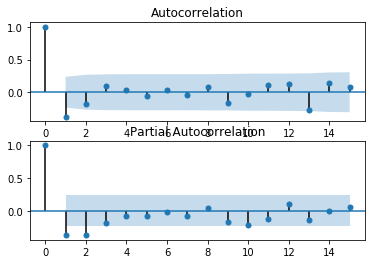

Test Statistic                -7.428691e+00
p-value                        6.446118e-11
#Lags Used                     2.000000e+00
Number of Observations Used    6.600000e+01
Critical Value (5%)           -2.906444e+00
Critical Value (1%)           -3.533560e+00
Critical Value (10%)          -2.590724e+00
dtype: float64
bic:689.0097286353263 and p:14 q:2


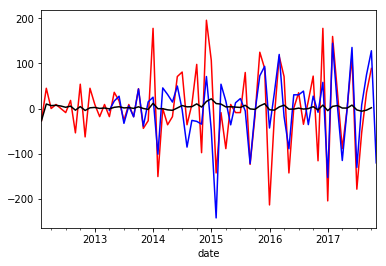

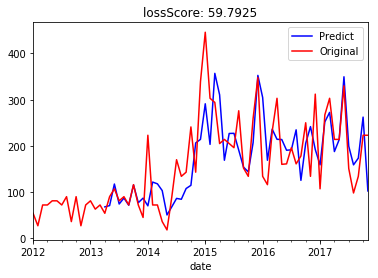

CLASS:  961362


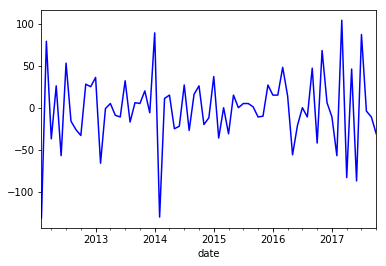

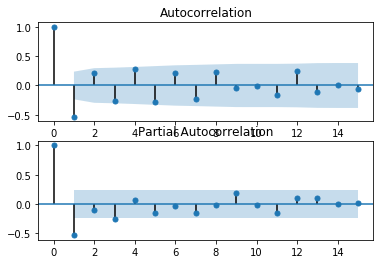

Test Statistic                 -4.788925
p-value                         0.000057
#Lags Used                      6.000000
Number of Observations Used    62.000000
Critical Value (5%)            -2.909427
Critical Value (1%)            -3.540523
Critical Value (10%)           -2.592314
dtype: float64
bic:587.4160110311107 and p:14 q:2


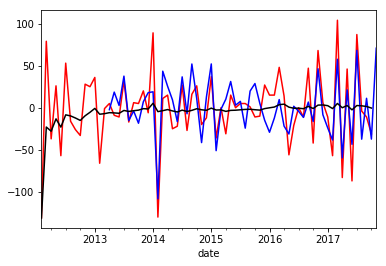

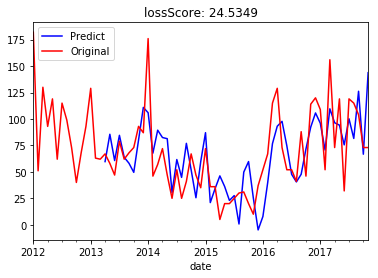

CLASS:  409854


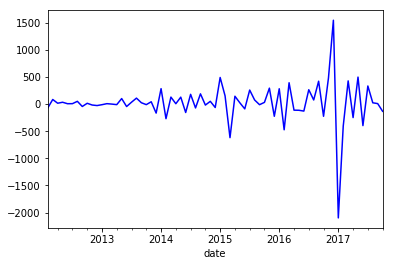

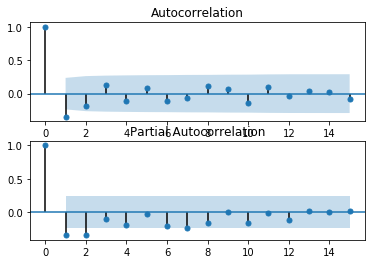

Test Statistic                 -4.360333
p-value                         0.000349
#Lags Used                      9.000000
Number of Observations Used    59.000000
Critical Value (5%)            -2.911939
Critical Value (1%)            -3.546395
Critical Value (10%)           -2.593652
dtype: float64
bic:852.270934009775 and p:14 q:0


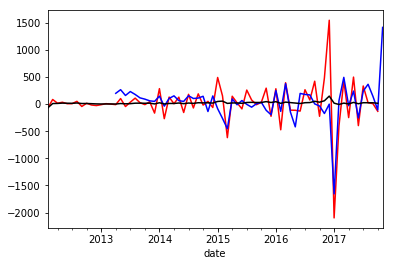

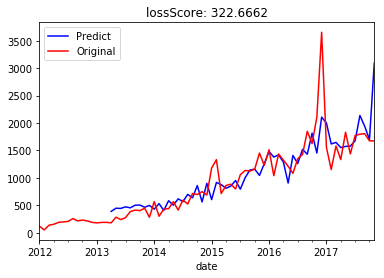

CLASS:  194450


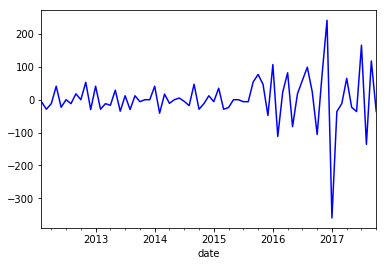

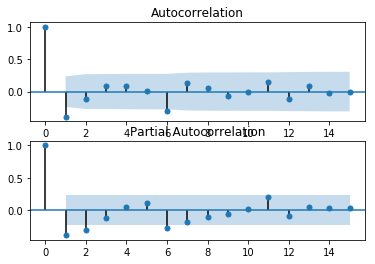

Test Statistic                 -1.289455
p-value                         0.633983
#Lags Used                     10.000000
Number of Observations Used    58.000000
Critical Value (5%)            -2.912837
Critical Value (1%)            -3.548494
Critical Value (10%)           -2.594129
dtype: float64
bic:665.5501928514391 and p:14 q:0


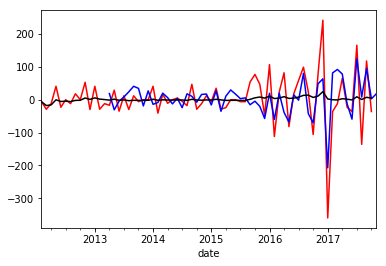

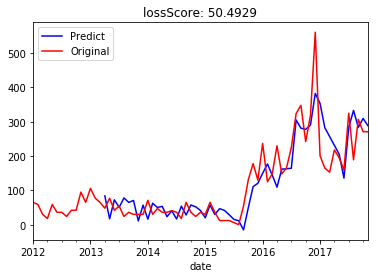

CLASS:  527809


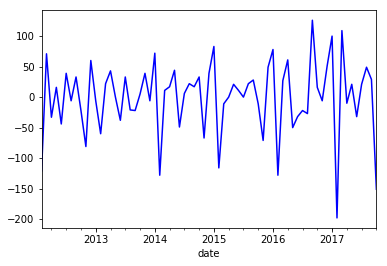

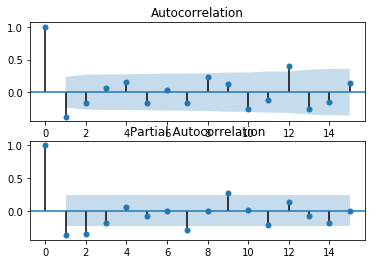

Test Statistic                 -2.483726
p-value                         0.119484
#Lags Used                     11.000000
Number of Observations Used    57.000000
Critical Value (5%)            -2.913766
Critical Value (1%)            -3.550670
Critical Value (10%)           -2.594624
dtype: float64
bic:622.209643349664 and p:14 q:0


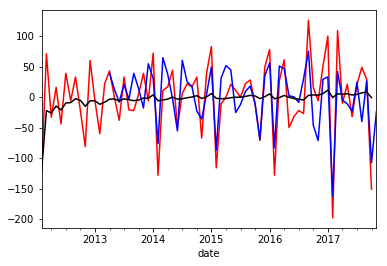

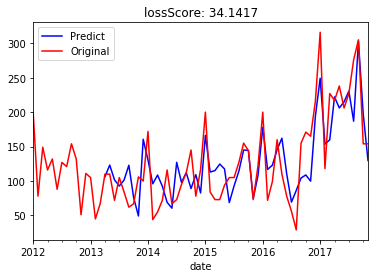

CLASS:  628041


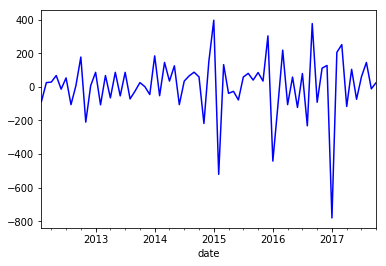

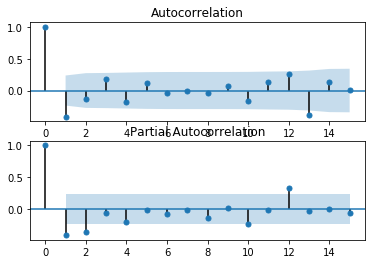

Test Statistic                 -1.629856
p-value                         0.467566
#Lags Used                     11.000000
Number of Observations Used    57.000000
Critical Value (5%)            -2.913766
Critical Value (1%)            -3.550670
Critical Value (10%)           -2.594624
dtype: float64
bic:758.1869174609893 and p:14 q:1


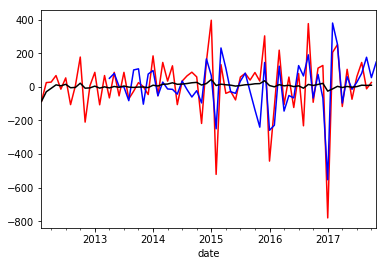

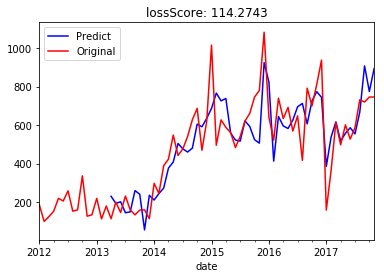

CLASS:  209945


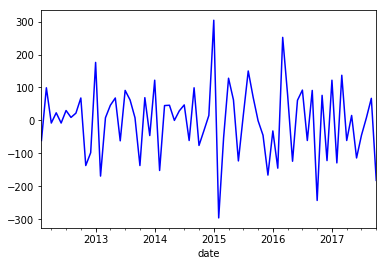

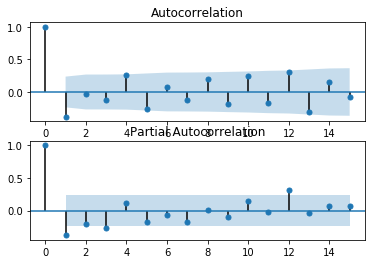

Test Statistic                 -1.520483
p-value                         0.523355
#Lags Used                     11.000000
Number of Observations Used    57.000000
Critical Value (5%)            -2.913766
Critical Value (1%)            -3.550670
Critical Value (10%)           -2.594624
dtype: float64
bic:703.6447932231403 and p:14 q:0


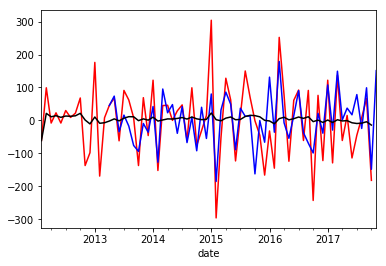

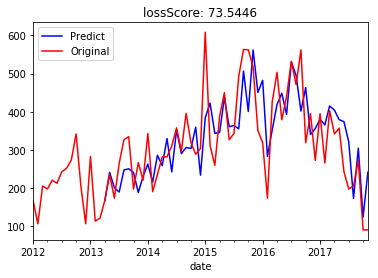

CLASS:  883691


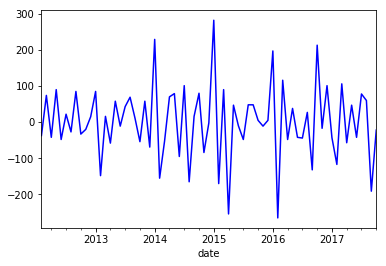

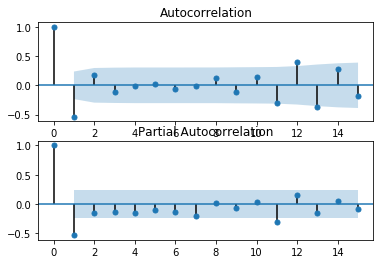

Test Statistic                 -4.343618
p-value                         0.000373
#Lags Used                     10.000000
Number of Observations Used    58.000000
Critical Value (5%)            -2.912837
Critical Value (1%)            -3.548494
Critical Value (10%)           -2.594129
dtype: float64
bic:695.1216549397348 and p:14 q:0


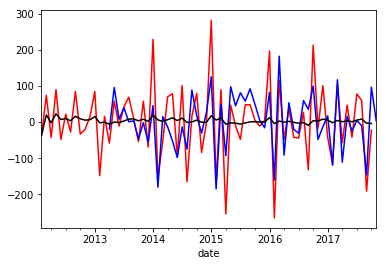

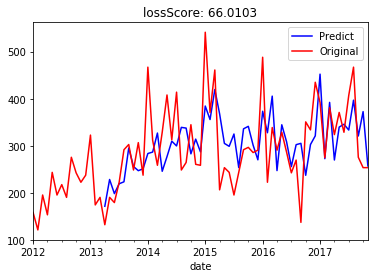

CLASS:  482497


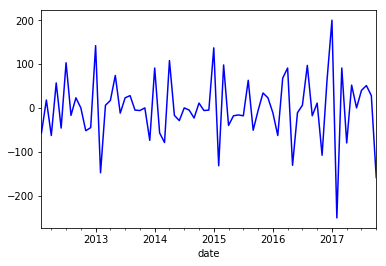

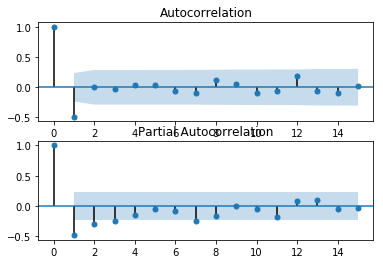

Test Statistic                -6.860855e+00
p-value                        1.603933e-09
#Lags Used                     3.000000e+00
Number of Observations Used    6.500000e+01
Critical Value (5%)           -2.907154e+00
Critical Value (1%)           -3.535217e+00
Critical Value (10%)          -2.591103e+00
dtype: float64
bic:649.3601231685954 and p:14 q:0


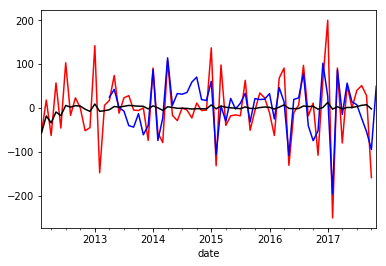

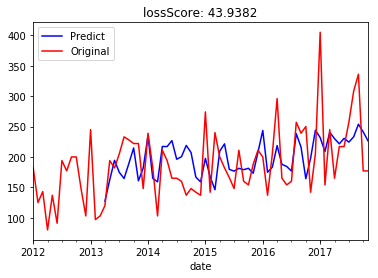

CLASS:  395234


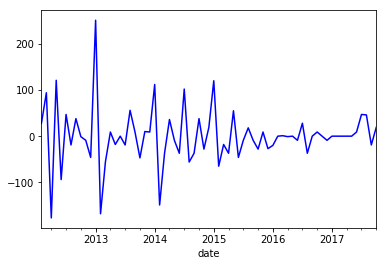

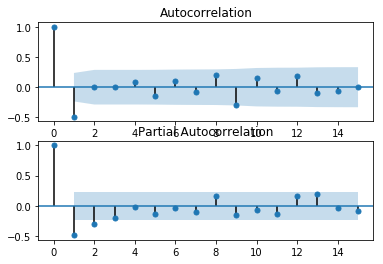

Test Statistic                -9.931364e+00
p-value                        2.817213e-17
#Lags Used                     1.000000e+00
Number of Observations Used    6.700000e+01
Critical Value (5%)           -2.905755e+00
Critical Value (1%)           -3.531955e+00
Critical Value (10%)          -2.590357e+00
dtype: float64
bic:603.1192244030053 and p:14 q:8


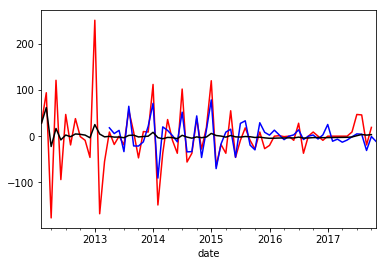

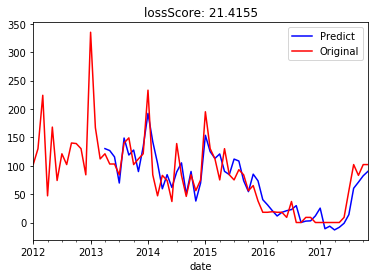

CLASS:  714152


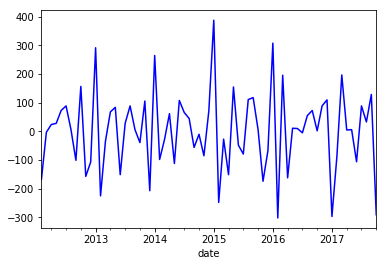

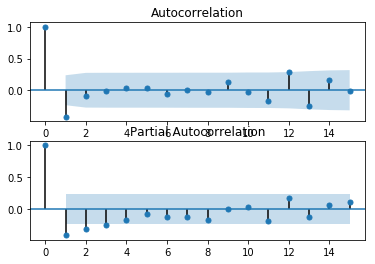

Test Statistic                -6.970067e+00
p-value                        8.711023e-10
#Lags Used                     3.000000e+00
Number of Observations Used    6.500000e+01
Critical Value (5%)           -2.907154e+00
Critical Value (1%)           -3.535217e+00
Critical Value (10%)          -2.591103e+00
dtype: float64
bic:722.9968875937291 and p:14 q:0


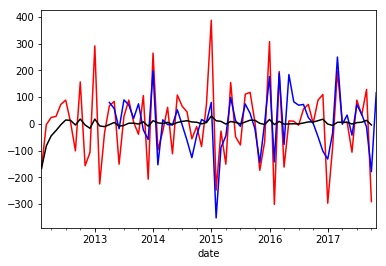

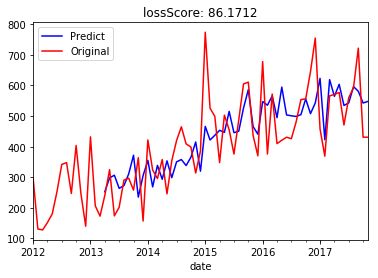

CLASS:  614059


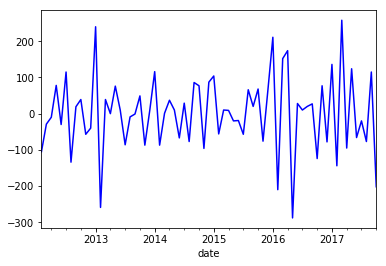

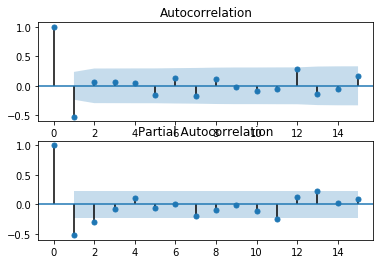

Test Statistic                -1.000294e+01
p-value                        1.863495e-17
#Lags Used                     1.000000e+00
Number of Observations Used    6.700000e+01
Critical Value (5%)           -2.905755e+00
Critical Value (1%)           -3.531955e+00
Critical Value (10%)          -2.590357e+00
dtype: float64
bic:685.9325819339548 and p:14 q:0


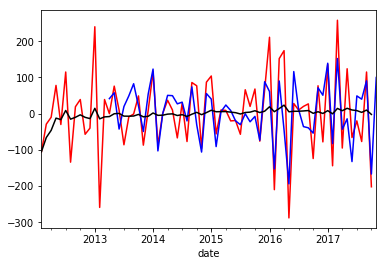

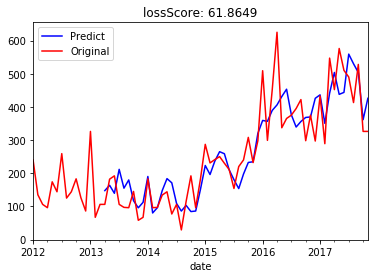

CLASS:  379876


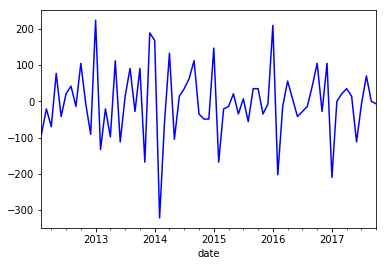

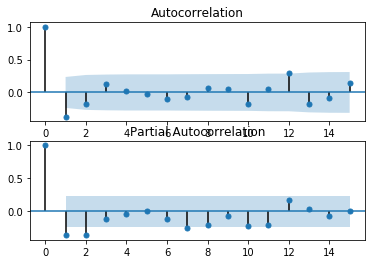

Test Statistic                 -5.203975
p-value                         0.000009
#Lags Used                     10.000000
Number of Observations Used    58.000000
Critical Value (5%)            -2.912837
Critical Value (1%)            -3.548494
Critical Value (10%)           -2.594129
dtype: float64
bic:686.8204616726838 and p:14 q:0


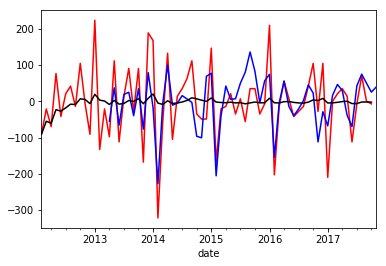

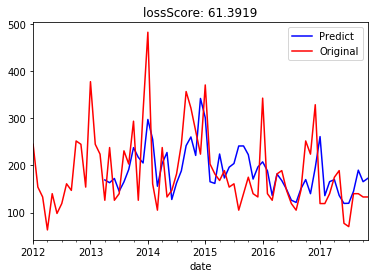

CLASS:  125403


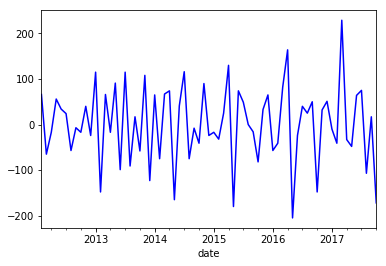

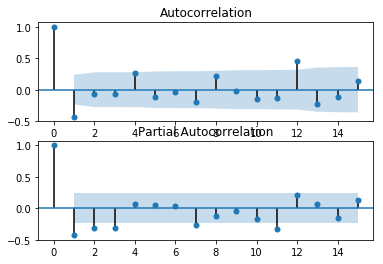

Test Statistic                -5.670408e+00
p-value                        8.949310e-07
#Lags Used                     1.000000e+01
Number of Observations Used    5.800000e+01
Critical Value (5%)           -2.912837e+00
Critical Value (1%)           -3.548494e+00
Critical Value (10%)          -2.594129e+00
dtype: float64
bic:652.061011478763 and p:14 q:0


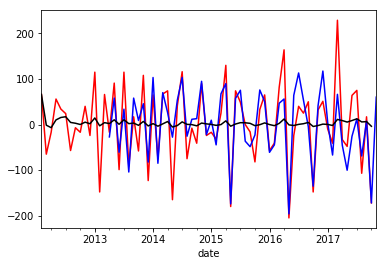

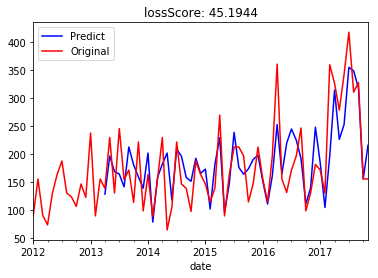

CLASS:  472603


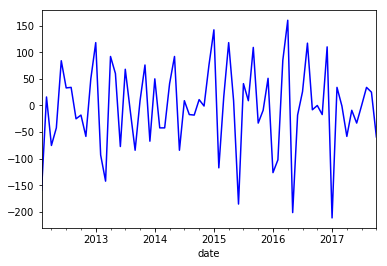

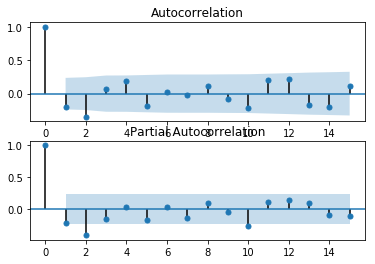

Test Statistic                 -3.153230
p-value                         0.022857
#Lags Used                     10.000000
Number of Observations Used    58.000000
Critical Value (5%)            -2.912837
Critical Value (1%)            -3.548494
Critical Value (10%)           -2.594129
dtype: float64
bic:661.758963968606 and p:14 q:3


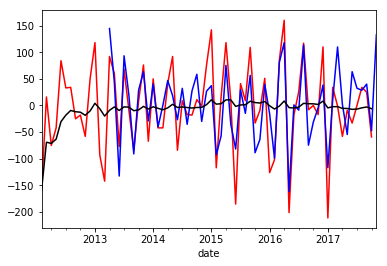

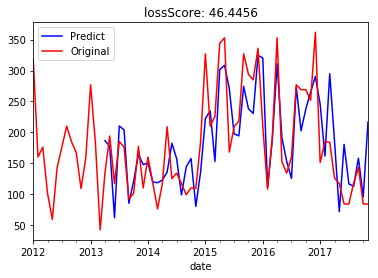

CLASS:  304458


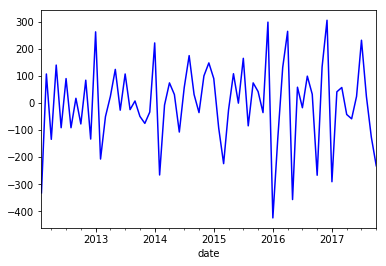

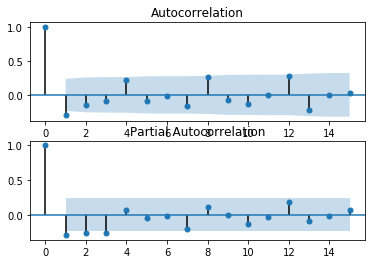

Test Statistic                -8.457984e+00
p-value                        1.595543e-13
#Lags Used                     2.000000e+00
Number of Observations Used    6.600000e+01
Critical Value (5%)           -2.906444e+00
Critical Value (1%)           -3.533560e+00
Critical Value (10%)          -2.590724e+00
dtype: float64
bic:741.7624392383352 and p:14 q:0


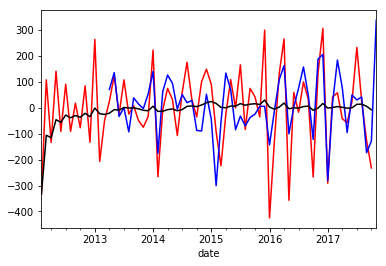

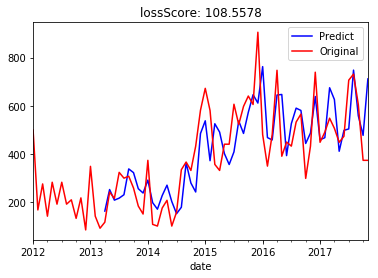

CLASS:  713651


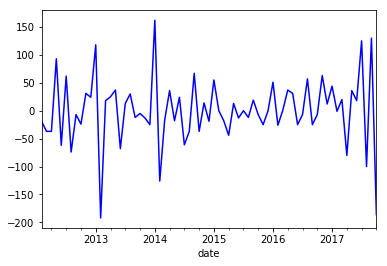

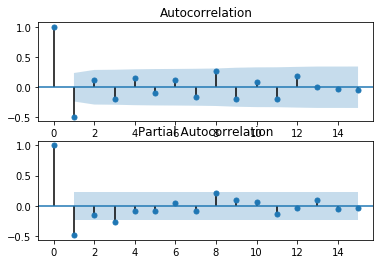

Test Statistic                -8.186729e+00
p-value                        7.863170e-13
#Lags Used                     2.000000e+00
Number of Observations Used    6.600000e+01
Critical Value (5%)           -2.906444e+00
Critical Value (1%)           -3.533560e+00
Critical Value (10%)          -2.590724e+00
dtype: float64
bic:623.998846048336 and p:14 q:0


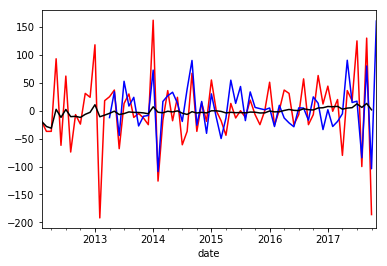

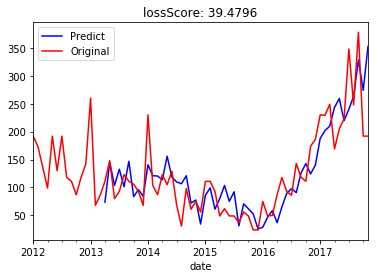

CLASS:  354068


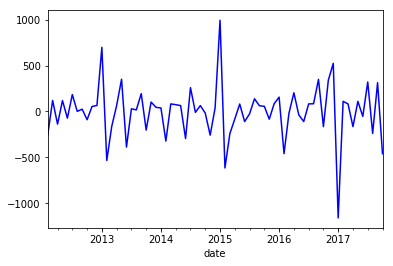

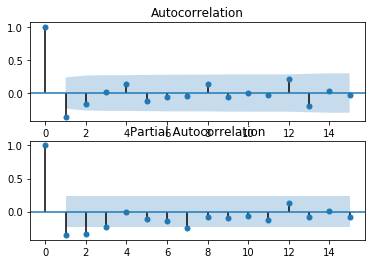

Test Statistic                -7.721802e+00
p-value                        1.187192e-11
#Lags Used                     2.000000e+00
Number of Observations Used    6.600000e+01
Critical Value (5%)           -2.906444e+00
Critical Value (1%)           -3.533560e+00
Critical Value (10%)          -2.590724e+00
dtype: float64
bic:813.8387745422369 and p:14 q:0


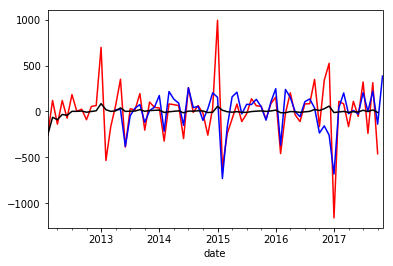

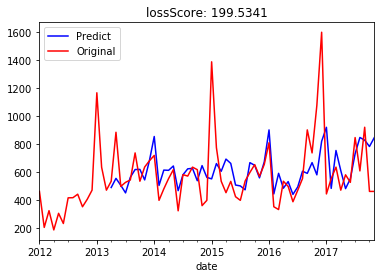

CLASS:  603972


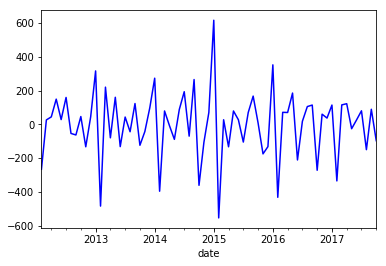

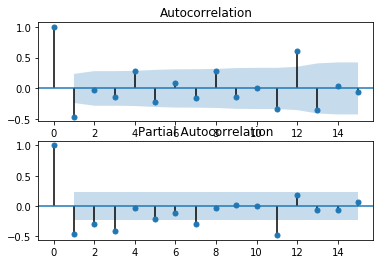

Test Statistic                 -3.934525
p-value                         0.001795
#Lags Used                     11.000000
Number of Observations Used    57.000000
Critical Value (5%)            -2.913766
Critical Value (1%)            -3.550670
Critical Value (10%)           -2.594624
dtype: float64
bic:733.9235848340426 and p:14 q:0


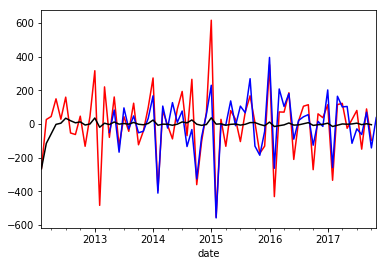

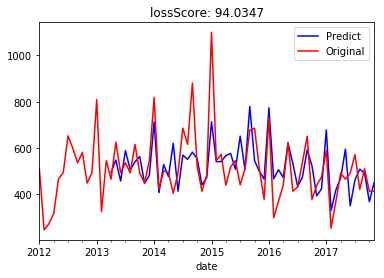

CLASS:  321683


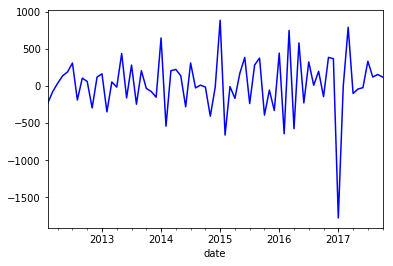

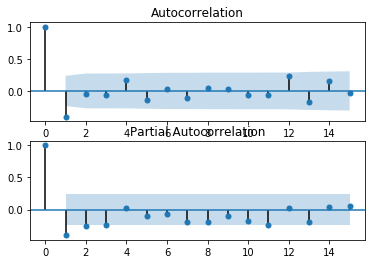

Test Statistic                -5.695142e+00
p-value                        7.905713e-07
#Lags Used                     1.000000e+01
Number of Observations Used    5.800000e+01
Critical Value (5%)           -2.912837e+00
Critical Value (1%)           -3.548494e+00
Critical Value (10%)          -2.594129e+00
dtype: float64
bic:842.2388102791839 and p:14 q:0


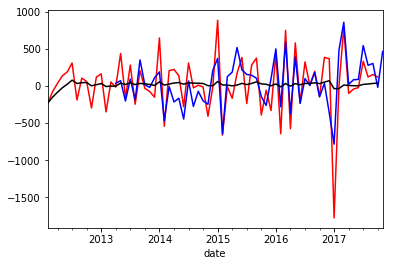

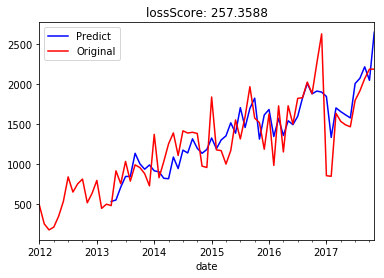

CLASS:  291086


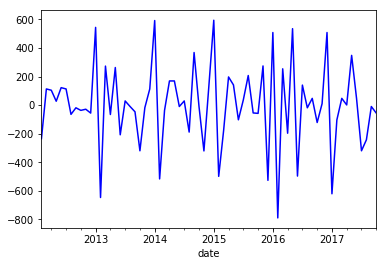

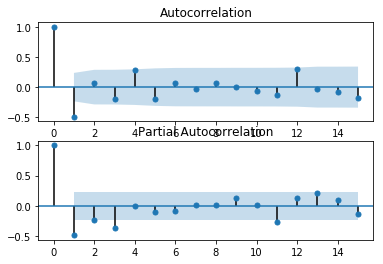

Test Statistic                -8.659666e+00
p-value                        4.860995e-14
#Lags Used                     2.000000e+00
Number of Observations Used    6.600000e+01
Critical Value (5%)           -2.906444e+00
Critical Value (1%)           -3.533560e+00
Critical Value (10%)          -2.590724e+00
dtype: float64
bic:802.7881750639643 and p:14 q:0


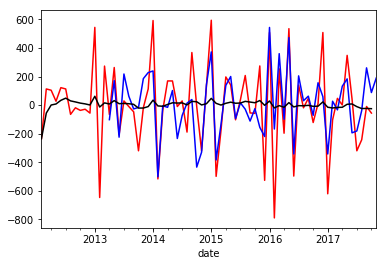

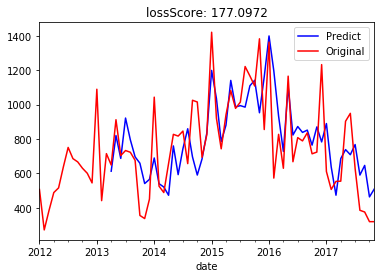

CLASS:  559132


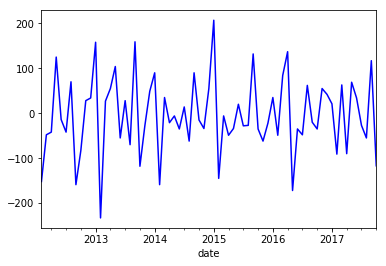

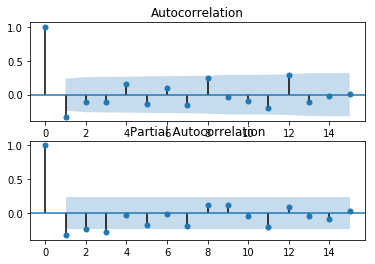

Test Statistic                -8.376844e+00
p-value                        2.572495e-13
#Lags Used                     2.000000e+00
Number of Observations Used    6.600000e+01
Critical Value (5%)           -2.906444e+00
Critical Value (1%)           -3.533560e+00
Critical Value (10%)          -2.590724e+00
dtype: float64
bic:646.7416131115592 and p:14 q:1


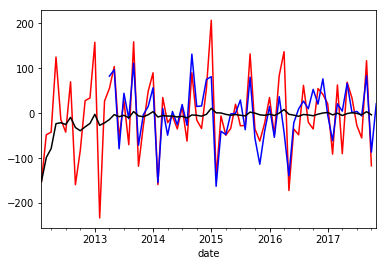

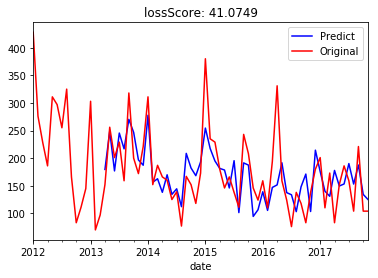

CLASS:  290854


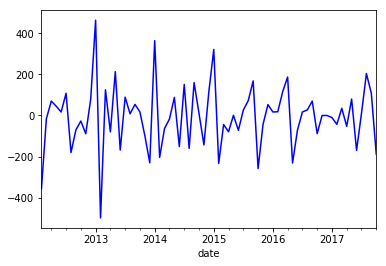

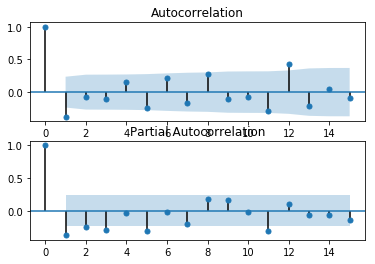

Test Statistic                 -4.347258
p-value                         0.000368
#Lags Used                     10.000000
Number of Observations Used    58.000000
Critical Value (5%)            -2.912837
Critical Value (1%)            -3.548494
Critical Value (10%)           -2.594129
dtype: float64
bic:701.2262951190428 and p:14 q:2


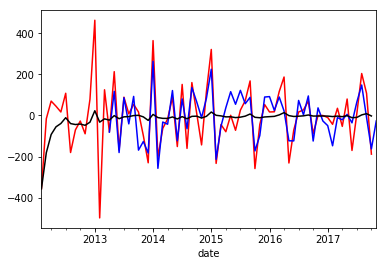

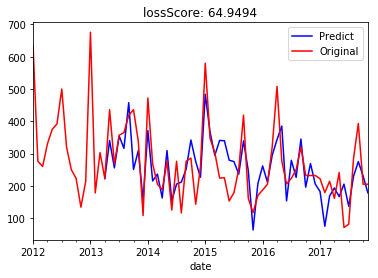

CLASS:  682651


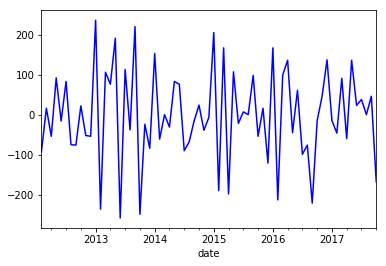

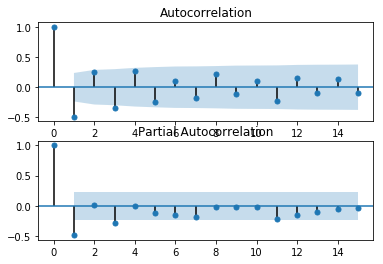

Test Statistic                -6.937148e+00
p-value                        1.047531e-09
#Lags Used                     2.000000e+00
Number of Observations Used    6.600000e+01
Critical Value (5%)           -2.906444e+00
Critical Value (1%)           -3.533560e+00
Critical Value (10%)          -2.590724e+00
dtype: float64
bic:709.8234533372623 and p:14 q:0


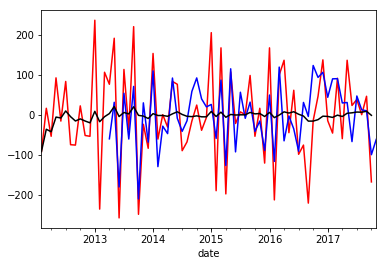

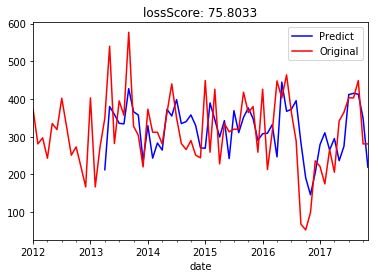

CLASS:  580470


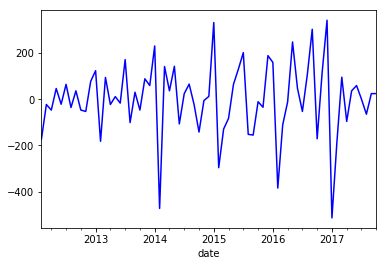

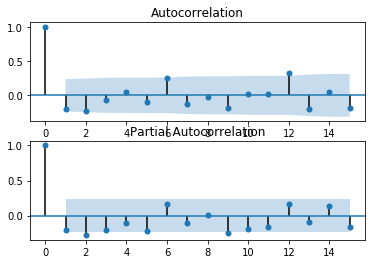

Test Statistic                 -4.651408
p-value                         0.000104
#Lags Used                     10.000000
Number of Observations Used    58.000000
Critical Value (5%)            -2.912837
Critical Value (1%)            -3.548494
Critical Value (10%)           -2.594129
dtype: float64
bic:753.3562250655028 and p:14 q:0


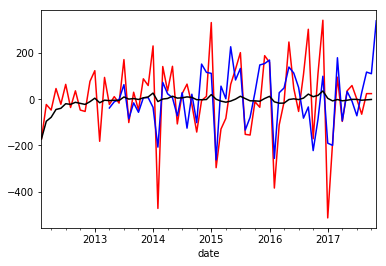

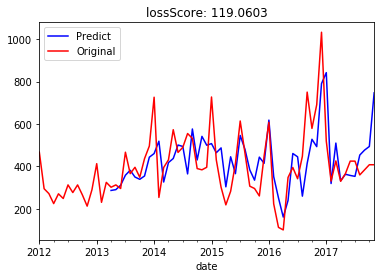

CLASS:  914348


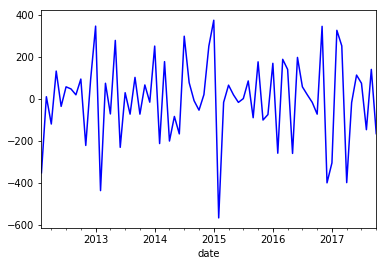

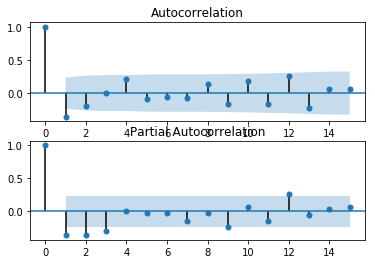

Test Statistic                -9.260714e+00
p-value                        1.409590e-15
#Lags Used                     2.000000e+00
Number of Observations Used    6.600000e+01
Critical Value (5%)           -2.906444e+00
Critical Value (1%)           -3.533560e+00
Critical Value (10%)          -2.590724e+00
dtype: float64
bic:759.7636767625092 and p:14 q:1


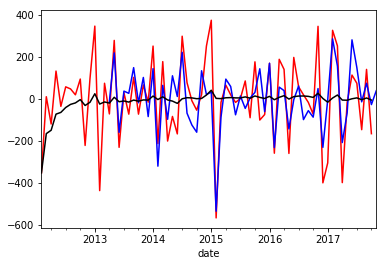

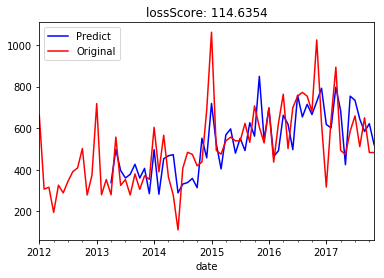

CLASS:  580634


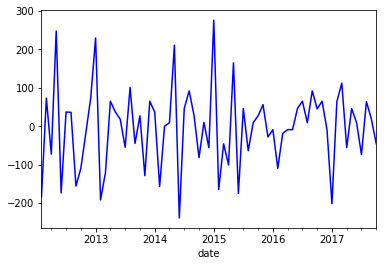

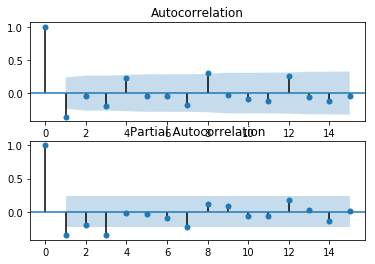

Test Statistic                -8.318489e+00
p-value                        3.626044e-13
#Lags Used                     2.000000e+00
Number of Observations Used    6.600000e+01
Critical Value (5%)           -2.906444e+00
Critical Value (1%)           -3.533560e+00
Critical Value (10%)          -2.590724e+00
dtype: float64
bic:677.5124128566566 and p:14 q:4


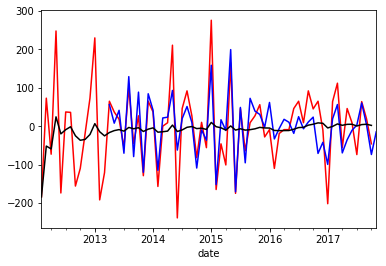

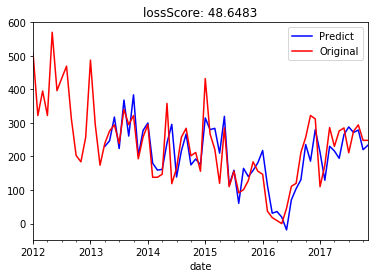

CLASS:  136916


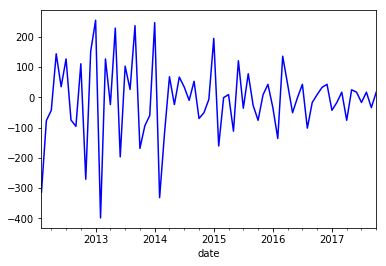

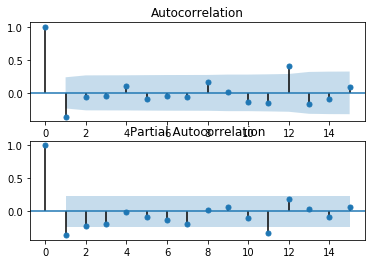

Test Statistic                 -4.961968
p-value                         0.000026
#Lags Used                     10.000000
Number of Observations Used    58.000000
Critical Value (5%)            -2.912837
Critical Value (1%)            -3.548494
Critical Value (10%)           -2.594129
dtype: float64
bic:675.0282734856947 and p:14 q:3


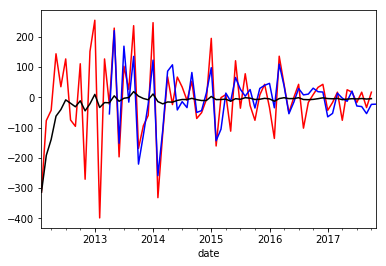

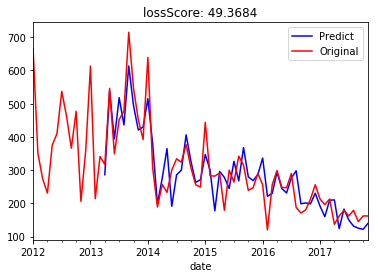

CLASS:  819061


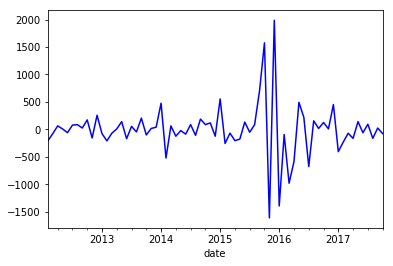

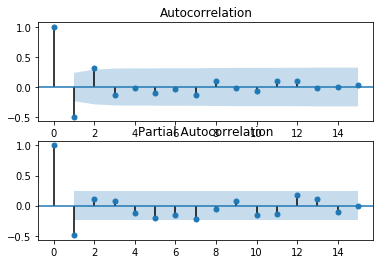

Test Statistic                -1.397906e+01
p-value                        4.209779e-26
#Lags Used                     0.000000e+00
Number of Observations Used    6.800000e+01
Critical Value (5%)           -2.905087e+00
Critical Value (1%)           -3.530399e+00
Critical Value (10%)          -2.590001e+00
dtype: float64
bic:879.2960728876666 and p:14 q:0


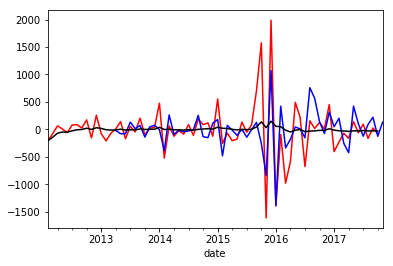

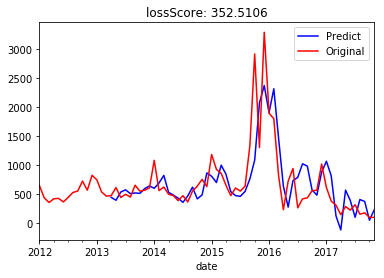

CLASS:  576298


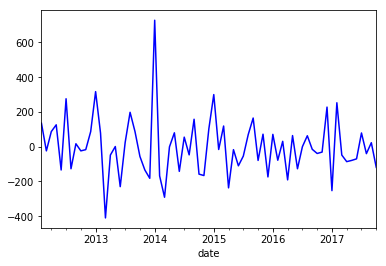

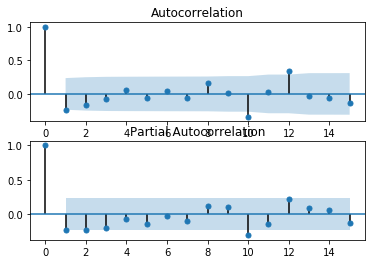

Test Statistic                 -4.083716
p-value                         0.001030
#Lags Used                     10.000000
Number of Observations Used    58.000000
Critical Value (5%)            -2.912837
Critical Value (1%)            -3.548494
Critical Value (10%)           -2.594129
dtype: float64
bic:740.199078569337 and p:14 q:0


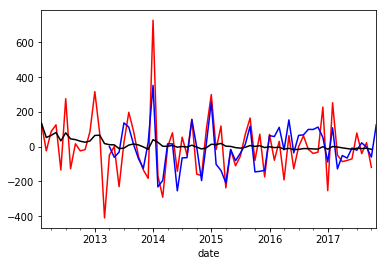

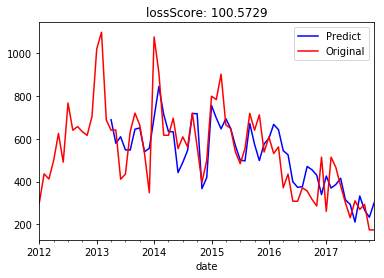

CLASS:  468392


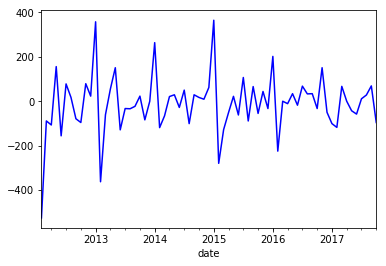

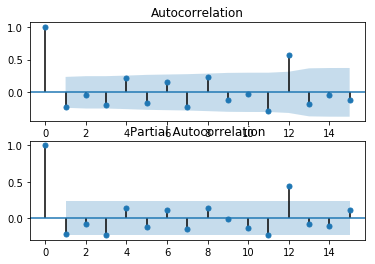

Test Statistic                 -2.367810
p-value                         0.151029
#Lags Used                     11.000000
Number of Observations Used    57.000000
Critical Value (5%)            -2.913766
Critical Value (1%)            -3.550670
Critical Value (10%)           -2.594624
dtype: float64
bic:679.1453561665805 and p:14 q:0


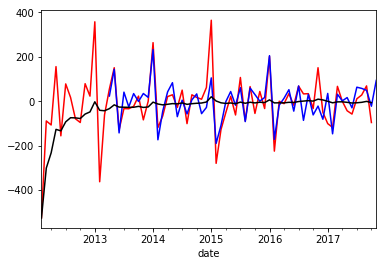

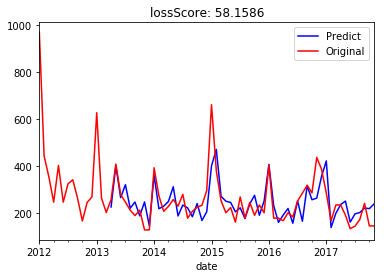

CLASS:  735971


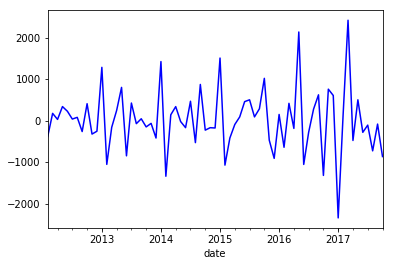

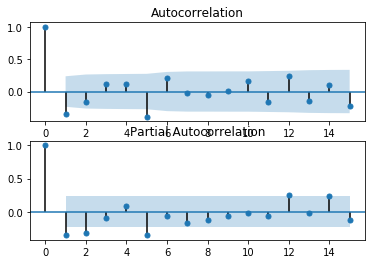

Test Statistic                 -3.148918
p-value                         0.023139
#Lags Used                     11.000000
Number of Observations Used    57.000000
Critical Value (5%)            -2.913766
Critical Value (1%)            -3.550670
Critical Value (10%)           -2.594624
dtype: float64
bic:905.6195123962211 and p:14 q:0


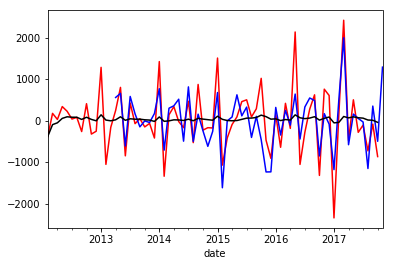

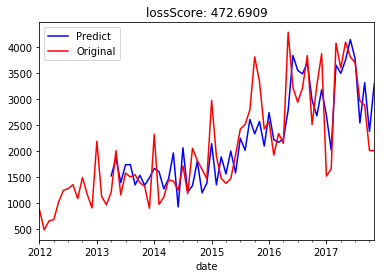

CLASS:  384924


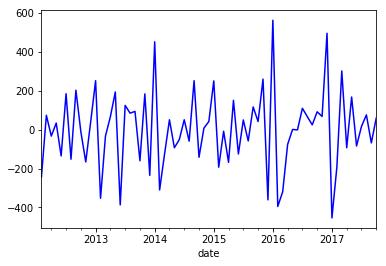

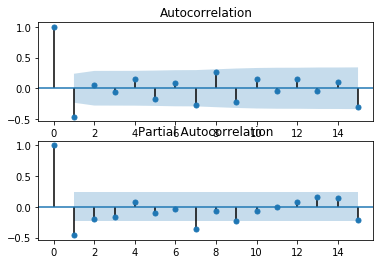

Test Statistic                 -4.756449
p-value                         0.000066
#Lags Used                      8.000000
Number of Observations Used    60.000000
Critical Value (5%)            -2.911073
Critical Value (1%)            -3.544369
Critical Value (10%)           -2.593190
dtype: float64
bic:774.0146577671791 and p:14 q:0


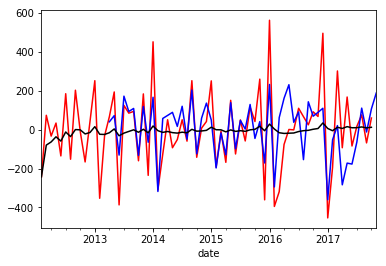

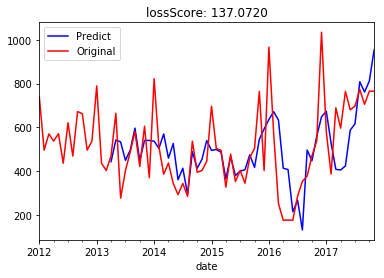

CLASS:  281301


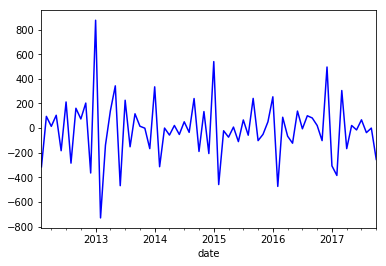

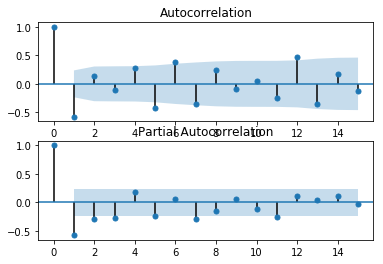

Test Statistic                 -4.289857
p-value                         0.000463
#Lags Used                     11.000000
Number of Observations Used    57.000000
Critical Value (5%)            -2.913766
Critical Value (1%)            -3.550670
Critical Value (10%)           -2.594624
dtype: float64
bic:741.6122001543771 and p:14 q:0


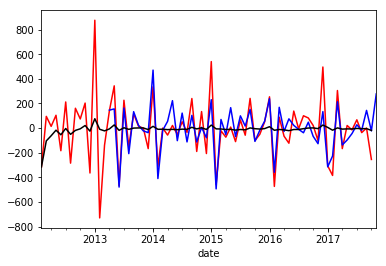

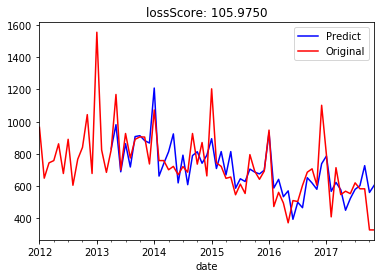

CLASS:  597927


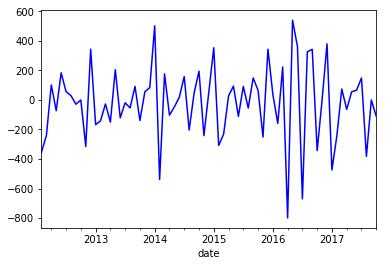

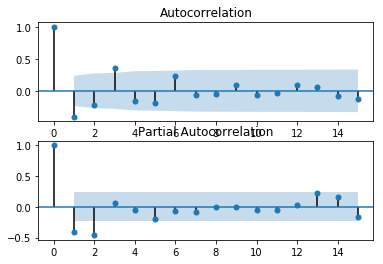

Test Statistic                -1.191293e+01
p-value                        5.244959e-22
#Lags Used                     1.000000e+00
Number of Observations Used    6.700000e+01
Critical Value (5%)           -2.905755e+00
Critical Value (1%)           -3.531955e+00
Critical Value (10%)          -2.590357e+00
dtype: float64
bic:795.0110373749524 and p:14 q:5


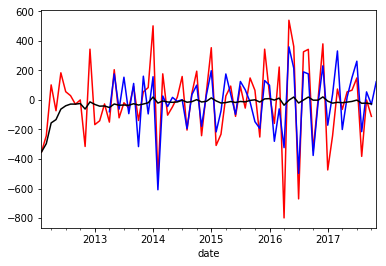

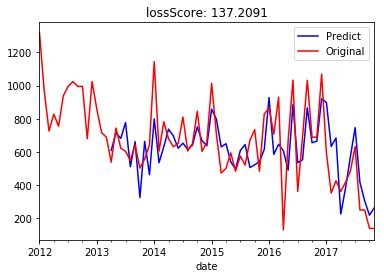

CLASS:  248352


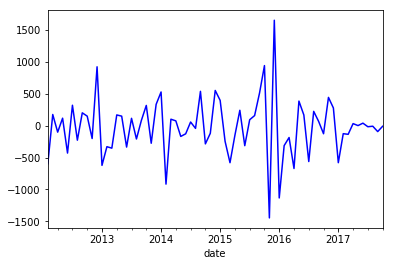

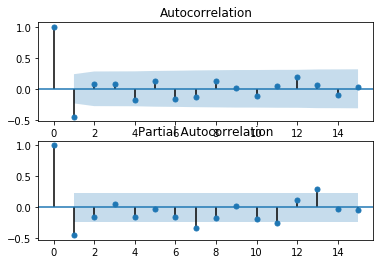

Test Statistic                 -4.705436
p-value                         0.000082
#Lags Used                     10.000000
Number of Observations Used    58.000000
Critical Value (5%)            -2.912837
Critical Value (1%)            -3.548494
Critical Value (10%)           -2.594129
dtype: float64
bic:857.5568552969919 and p:14 q:0


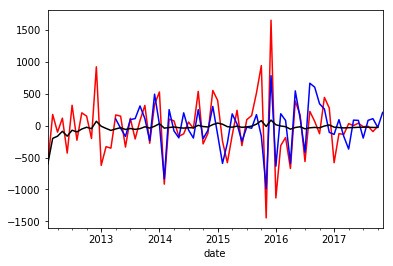

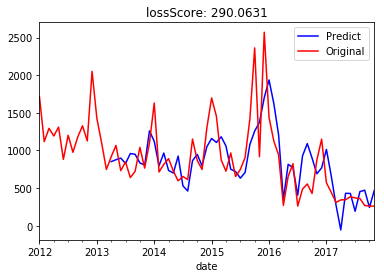

CLASS:  425432


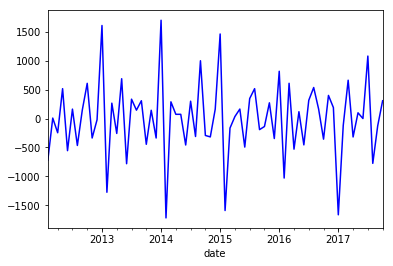

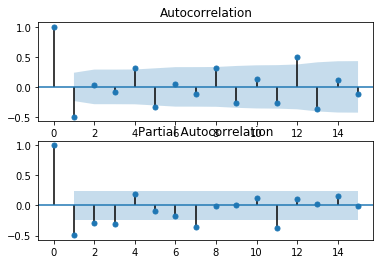

Test Statistic                 -4.624505
p-value                         0.000116
#Lags Used                     10.000000
Number of Observations Used    58.000000
Critical Value (5%)            -2.912837
Critical Value (1%)            -3.548494
Critical Value (10%)           -2.594129
dtype: float64
bic:865.6109350893051 and p:14 q:1


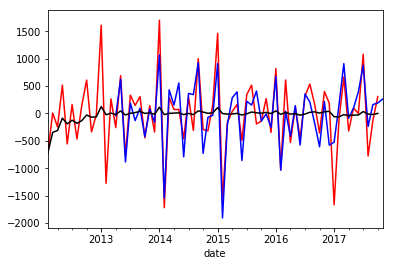

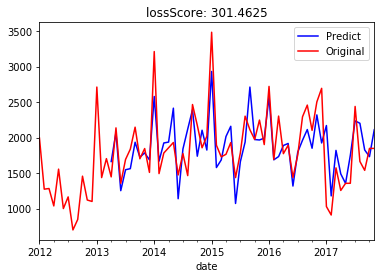

CLASS:  178529


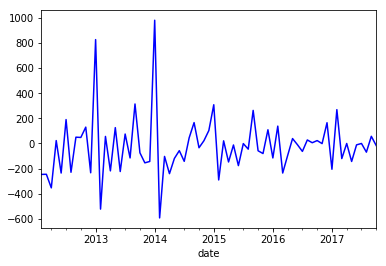

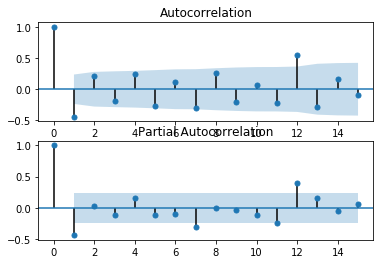

Test Statistic                 -3.212872
p-value                         0.019252
#Lags Used                     11.000000
Number of Observations Used    57.000000
Critical Value (5%)            -2.913766
Critical Value (1%)            -3.550670
Critical Value (10%)           -2.594624
dtype: float64
bic:745.1262171784031 and p:14 q:2


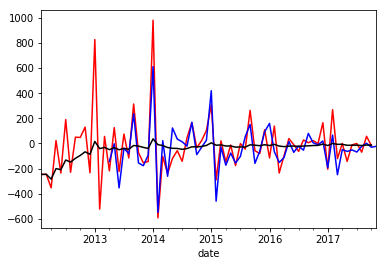

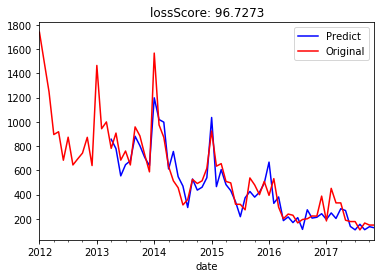

CLASS:  349023


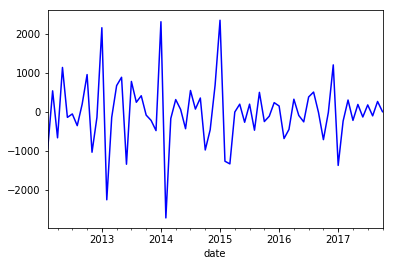

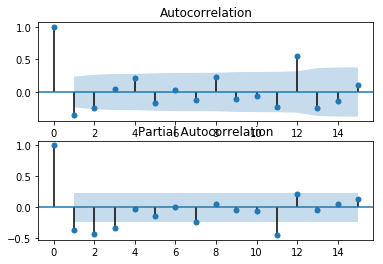

Test Statistic                 -3.261299
p-value                         0.016700
#Lags Used                     11.000000
Number of Observations Used    57.000000
Critical Value (5%)            -2.913766
Critical Value (1%)            -3.550670
Critical Value (10%)           -2.594624
dtype: float64
bic:899.3651111902004 and p:14 q:1


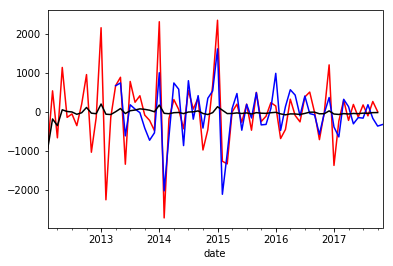

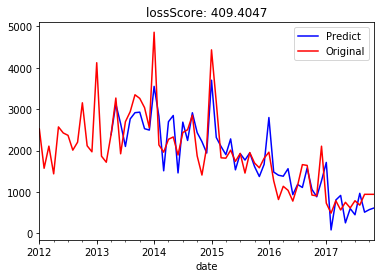

CLASS:  265980


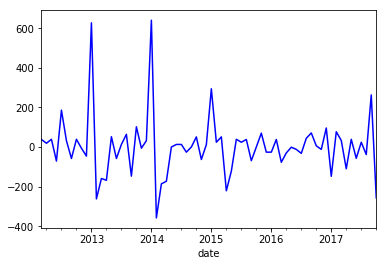

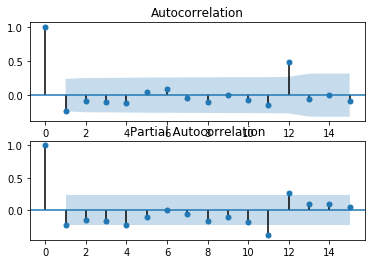

Test Statistic                 -4.996811
p-value                         0.000023
#Lags Used                     11.000000
Number of Observations Used    56.000000
Critical Value (5%)            -2.914731
Critical Value (1%)            -3.552928
Critical Value (10%)           -2.595137
dtype: float64
bic:695.1895750233527 and p:14 q:2


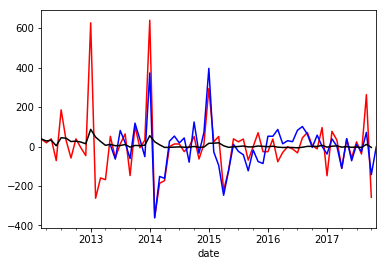

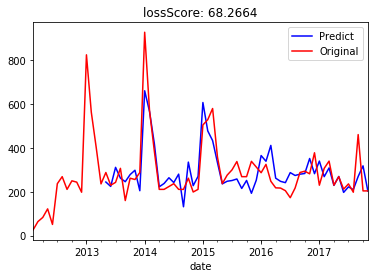

CLASS:  923841


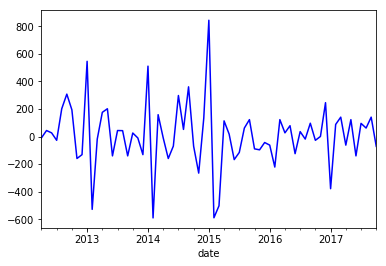

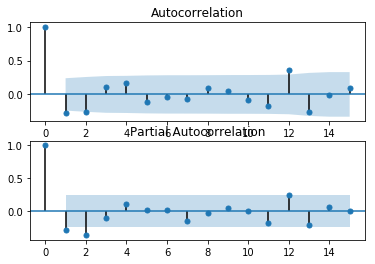

Test Statistic                -9.266184e+00
p-value                        1.365012e-15
#Lags Used                     1.000000e+00
Number of Observations Used    6.500000e+01
Critical Value (5%)           -2.907154e+00
Critical Value (1%)           -3.535217e+00
Critical Value (10%)          -2.591103e+00
dtype: float64
bic:757.5508433718358 and p:14 q:2


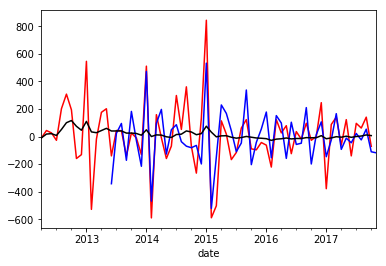

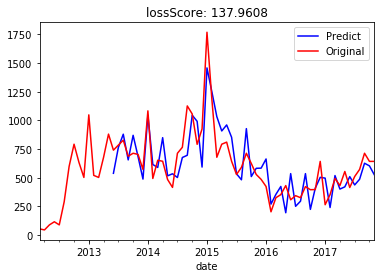

CLASS:  732758


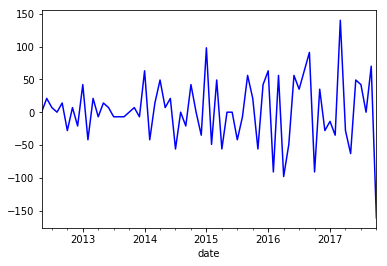

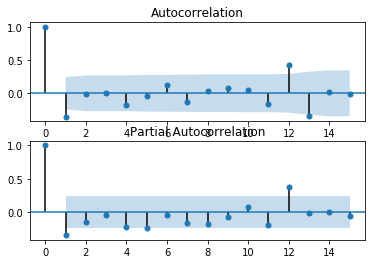

Test Statistic                 -1.680990
p-value                         0.440933
#Lags Used                     11.000000
Number of Observations Used    54.000000
Critical Value (5%)            -2.916770
Critical Value (1%)            -3.557709
Critical Value (10%)           -2.596222
dtype: float64
bic:583.0311921684826 and p:14 q:0


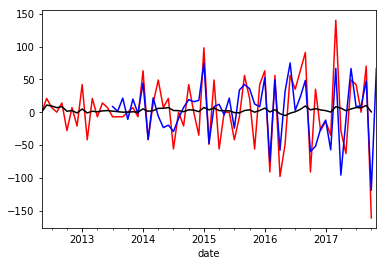

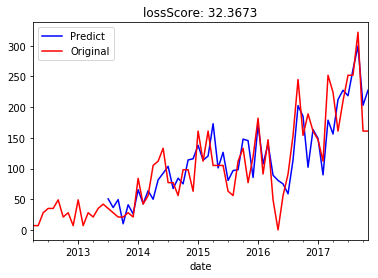

CLASS:  745137


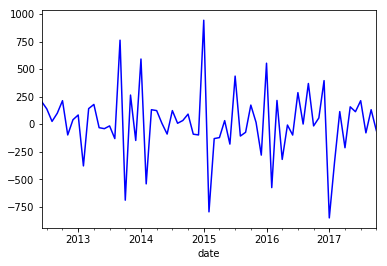

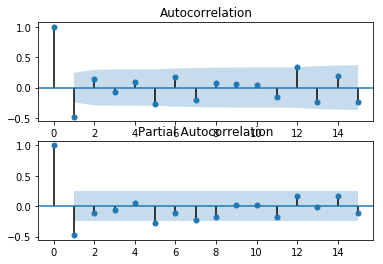

Test Statistic                 -5.319916
p-value                         0.000005
#Lags Used                      7.000000
Number of Observations Used    57.000000
Critical Value (5%)            -2.913766
Critical Value (1%)            -3.550670
Critical Value (10%)           -2.594624
dtype: float64
bic:765.4418547663281 and p:14 q:0


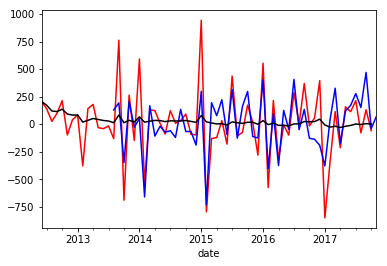

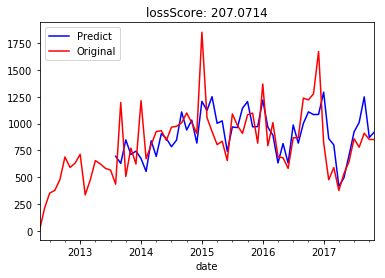

CLASS:  786351


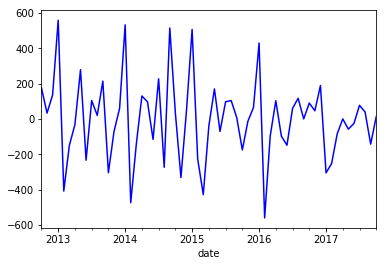

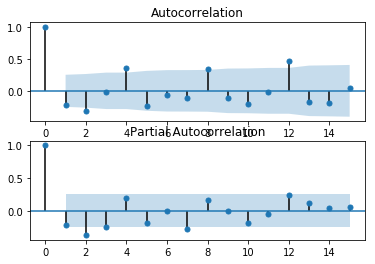

Test Statistic                 -2.513015
p-value                         0.112340
#Lags Used                     11.000000
Number of Observations Used    49.000000
Critical Value (5%)            -2.922629
Critical Value (1%)            -3.571472
Critical Value (10%)           -2.599336
dtype: float64
bic:668.7007326962092 and p:14 q:0


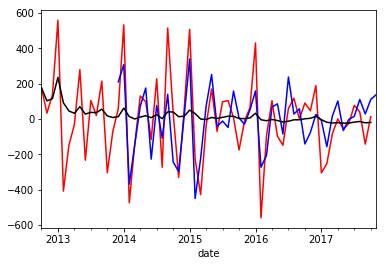

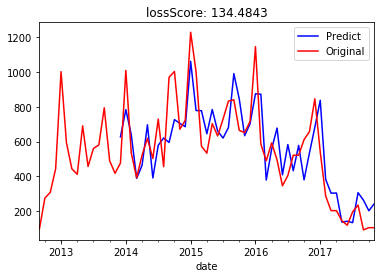

CLASS:  347384


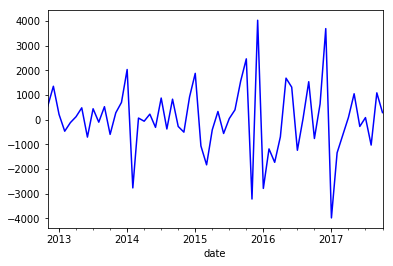

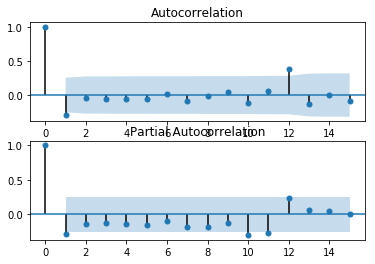

Test Statistic                -6.719406e+00
p-value                        3.514153e-09
#Lags Used                     1.000000e+01
Number of Observations Used    4.900000e+01
Critical Value (5%)           -2.922629e+00
Critical Value (1%)           -3.571472e+00
Critical Value (10%)          -2.599336e+00
dtype: float64
bic:833.2946409631396 and p:14 q:0


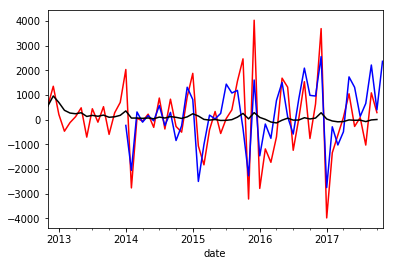

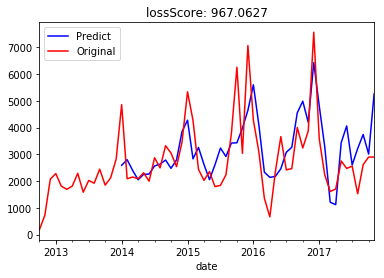

CLASS:  291514


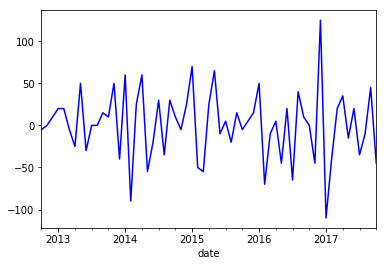

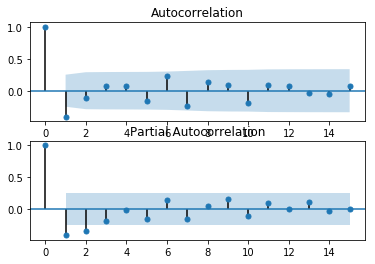

Test Statistic                -8.942201e+00
p-value                        9.188886e-15
#Lags Used                     1.000000e+00
Number of Observations Used    5.900000e+01
Critical Value (5%)           -2.911939e+00
Critical Value (1%)           -3.546395e+00
Critical Value (10%)          -2.593652e+00
dtype: float64
bic:522.210429277098 and p:14 q:5


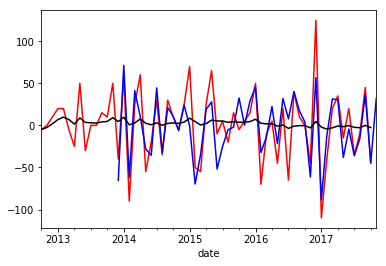

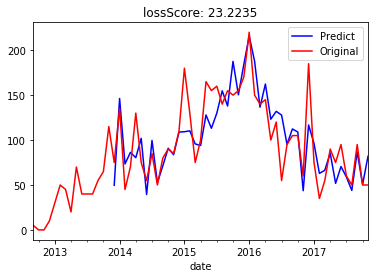

CLASS:  905745


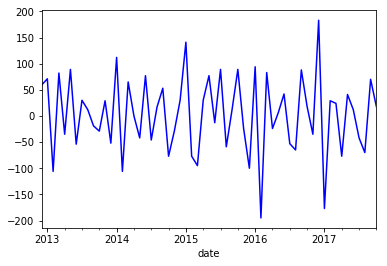

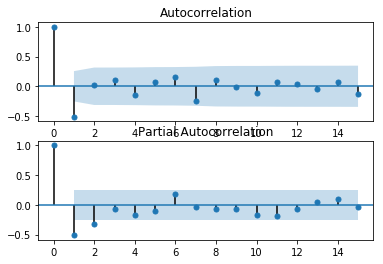

Test Statistic                -9.459715e+00
p-value                        4.387089e-16
#Lags Used                     1.000000e+00
Number of Observations Used    5.700000e+01
Critical Value (5%)           -2.913766e+00
Critical Value (1%)           -3.550670e+00
Critical Value (10%)          -2.594624e+00
dtype: float64
bic:549.0558693225975 and p:14 q:0


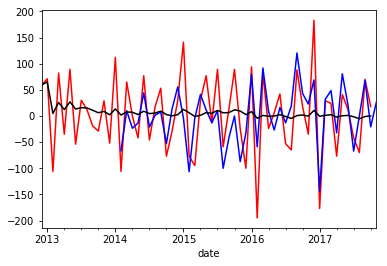

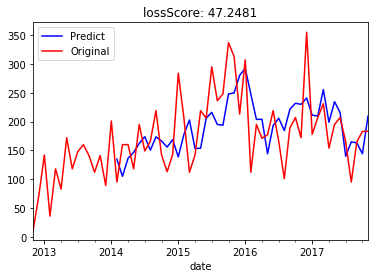

CLASS:  175962


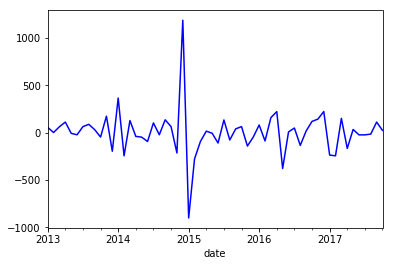

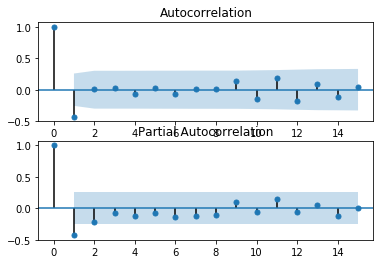

Test Statistic                -7.693968e+00
p-value                        1.395173e-11
#Lags Used                     1.000000e+00
Number of Observations Used    5.600000e+01
Critical Value (5%)           -2.914731e+00
Critical Value (1%)           -3.552928e+00
Critical Value (10%)          -2.595137e+00
dtype: float64
bic:650.3147976896882 and p:14 q:3


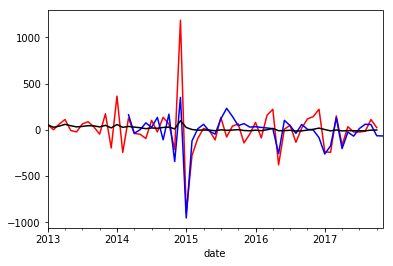

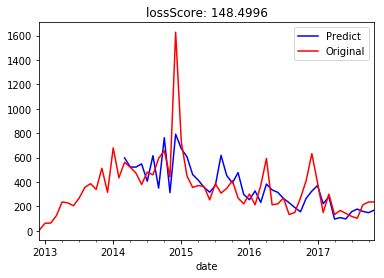

CLASS:  651782


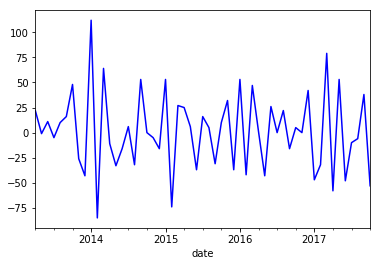

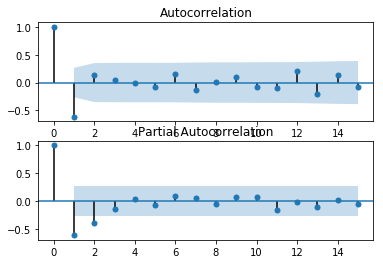

Test Statistic                -6.609106e+00
p-value                        6.444022e-09
#Lags Used                     2.000000e+00
Number of Observations Used    5.200000e+01
Critical Value (5%)           -2.918973e+00
Critical Value (1%)           -3.562879e+00
Critical Value (10%)          -2.597393e+00
dtype: float64
bic:428.1346690307479 and p:14 q:0


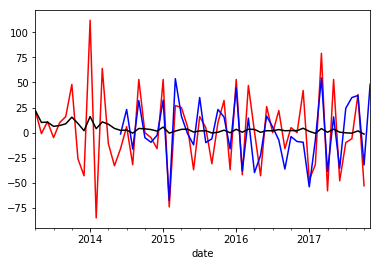

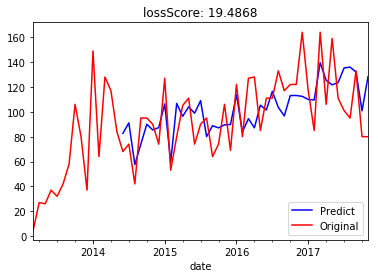

CLASS:  221795


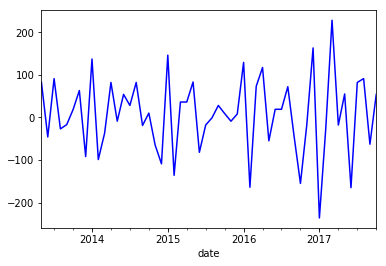

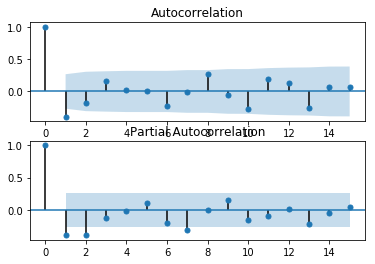

Test Statistic                 -2.680997
p-value                         0.077385
#Lags Used                     10.000000
Number of Observations Used    43.000000
Critical Value (5%)            -2.931550
Critical Value (1%)            -3.592504
Critical Value (10%)           -2.604066
dtype: float64
bic:497.81976425796813 and p:13 q:2


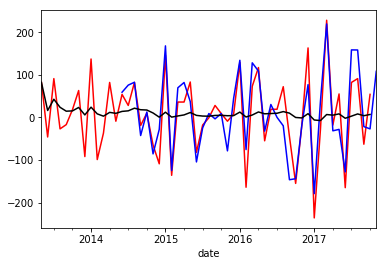

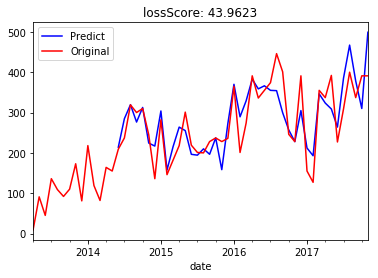

CLASS:  671482


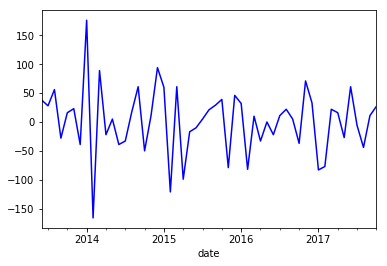

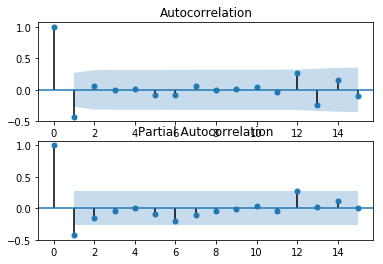

Test Statistic                 -2.994694
p-value                         0.035393
#Lags Used                     11.000000
Number of Observations Used    41.000000
Critical Value (5%)            -2.935135
Critical Value (1%)            -3.600983
Critical Value (10%)           -2.605963
dtype: float64
bic:441.19659514688453 and p:14 q:0


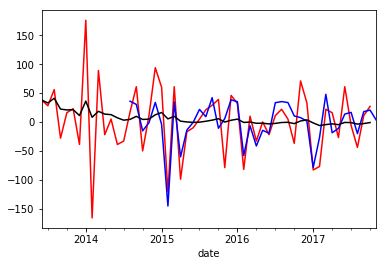

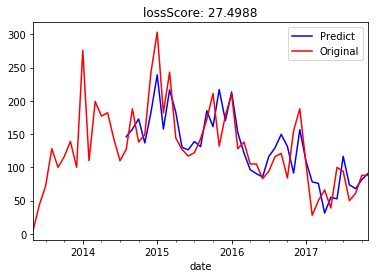

CLASS:  871642


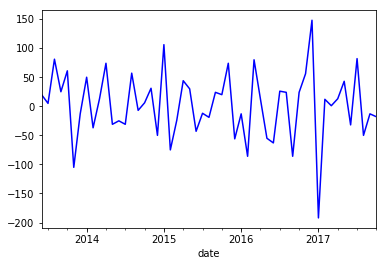

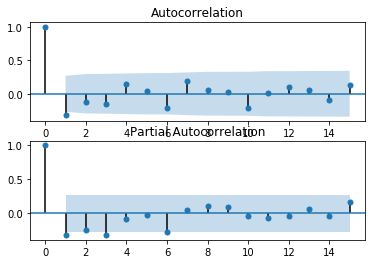

Test Statistic                 -5.330175
p-value                         0.000005
#Lags Used                      5.000000
Number of Observations Used    47.000000
Critical Value (5%)            -2.925338
Critical Value (1%)            -3.577848
Critical Value (10%)           -2.600774
dtype: float64
bic:462.2597058376711 and p:14 q:3


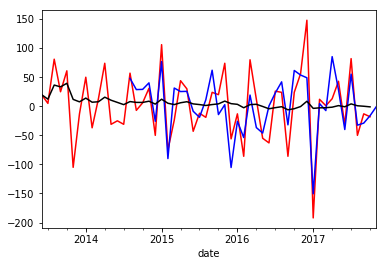

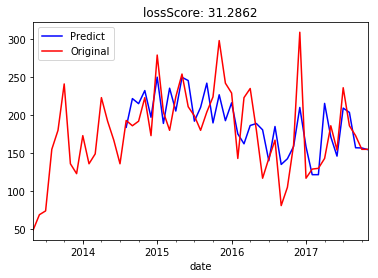

CLASS:  308913


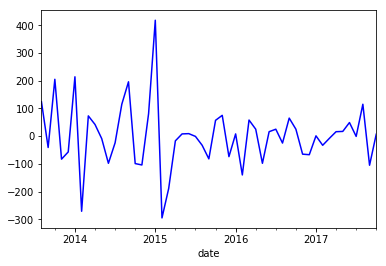

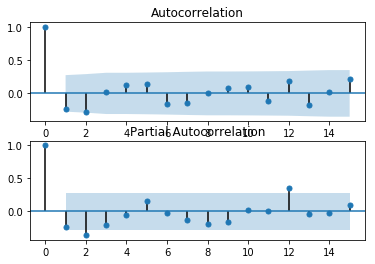

Test Statistic                -6.738671e+00
p-value                        3.159485e-09
#Lags Used                     2.000000e+00
Number of Observations Used    4.800000e+01
Critical Value (5%)           -2.923954e+00
Critical Value (1%)           -3.574589e+00
Critical Value (10%)          -2.600039e+00
dtype: float64
bic:469.20460173310005 and p:14 q:2


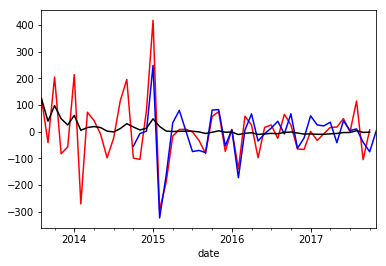

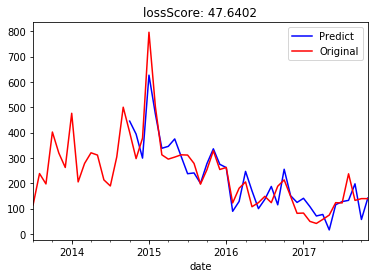

CLASS:  854079


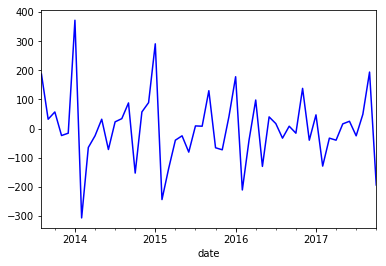

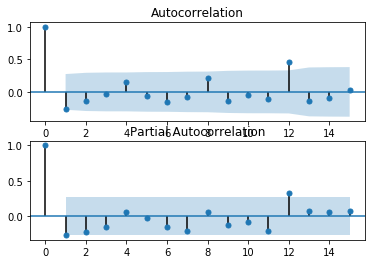

Test Statistic                 -2.904532
p-value                         0.044824
#Lags Used                     11.000000
Number of Observations Used    39.000000
Critical Value (5%)            -2.939109
Critical Value (1%)            -3.610400
Critical Value (10%)           -2.608063
dtype: float64
bic:476.30589473942973 and p:14 q:0


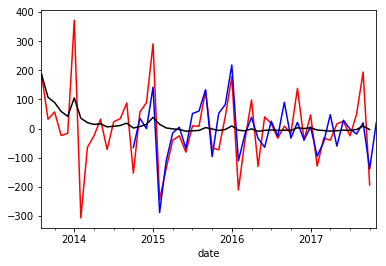

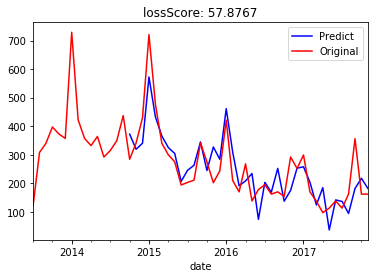

CLASS:  621073


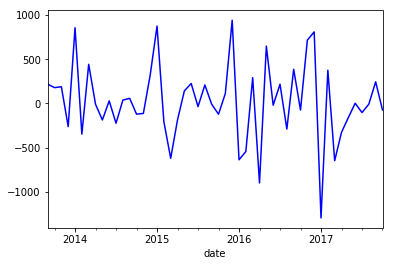

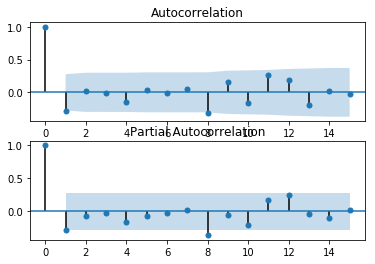

Test Statistic                 -5.171664
p-value                         0.000010
#Lags Used                      9.000000
Number of Observations Used    40.000000
Critical Value (5%)            -2.937069
Critical Value (1%)            -3.605565
Critical Value (10%)           -2.606986
dtype: float64
bic:575.4264690004309 and p:14 q:0


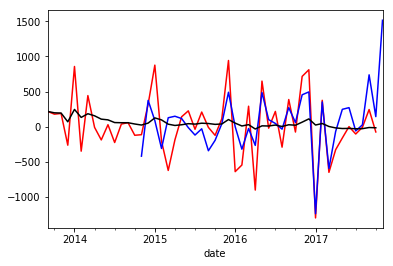

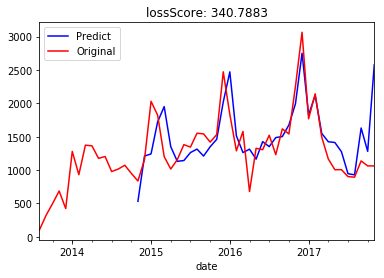

CLASS:  356986


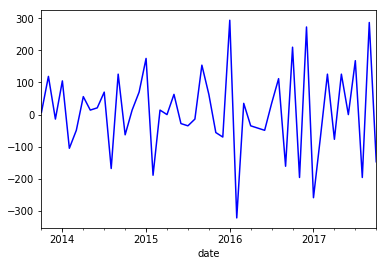

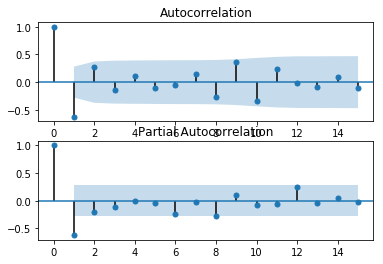

Test Statistic                -1.420909e+01
p-value                        1.734082e-26
#Lags Used                     0.000000e+00
Number of Observations Used    4.800000e+01
Critical Value (5%)           -2.923954e+00
Critical Value (1%)           -3.574589e+00
Critical Value (10%)          -2.600039e+00
dtype: float64
bic:468.21241679322594 and p:14 q:0


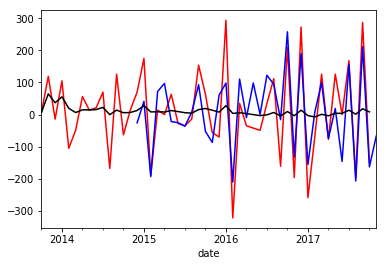

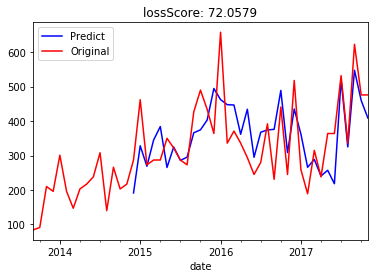

CLASS:  560265


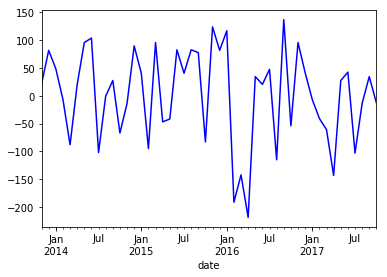

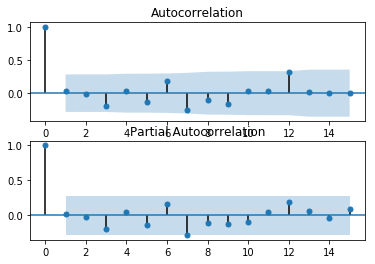

Test Statistic                -6.538432e+00
p-value                        9.479208e-09
#Lags Used                     0.000000e+00
Number of Observations Used    4.700000e+01
Critical Value (5%)           -2.925338e+00
Critical Value (1%)           -3.577848e+00
Critical Value (10%)          -2.600774e+00
dtype: float64
bic:443.7798455713245 and p:14 q:2


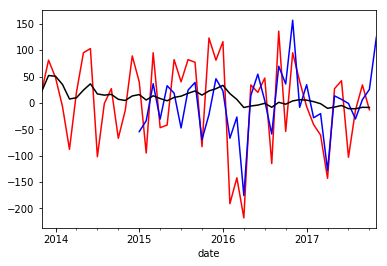

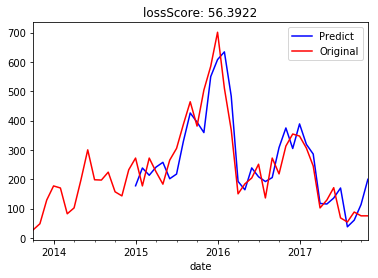

CLASS:  436105


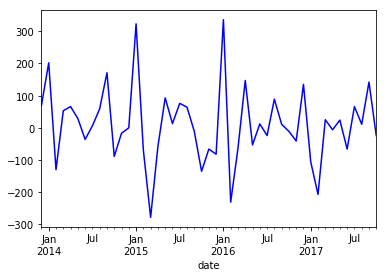

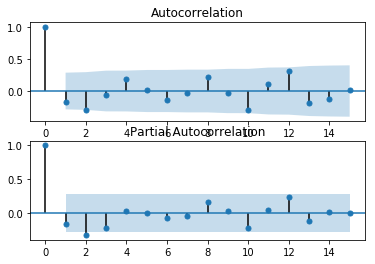

Test Statistic                -5.917518e+00
p-value                        2.552013e-07
#Lags Used                     2.000000e+00
Number of Observations Used    4.400000e+01
Critical Value (5%)           -2.929886e+00
Critical Value (1%)           -3.588573e+00
Critical Value (10%)          -2.603185e+00
dtype: float64
bic:417.50147336587935 and p:14 q:4


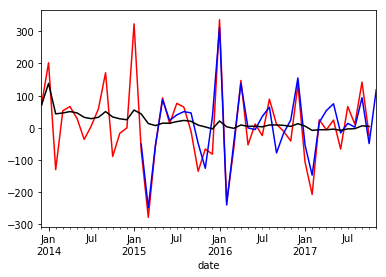

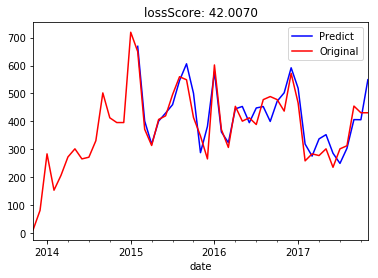

CLASS:  360648


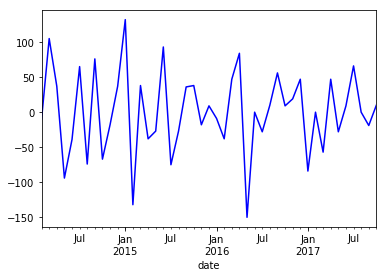

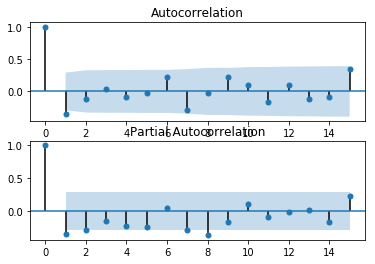

Test Statistic                 -5.498158
p-value                         0.000002
#Lags Used                      8.000000
Number of Observations Used    36.000000
Critical Value (5%)            -2.945951
Critical Value (1%)            -3.626652
Critical Value (10%)           -2.611671
dtype: float64
bic:383.54196409395854 and p:11 q:0


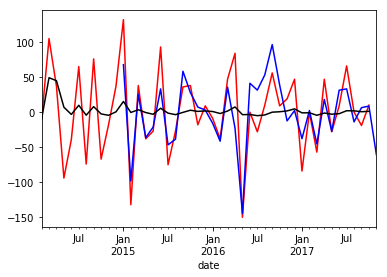

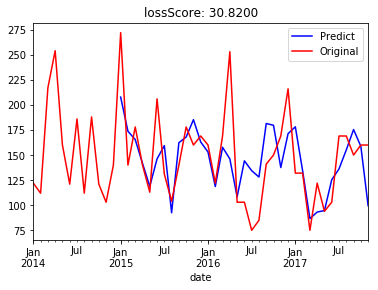

CLASS:  124140


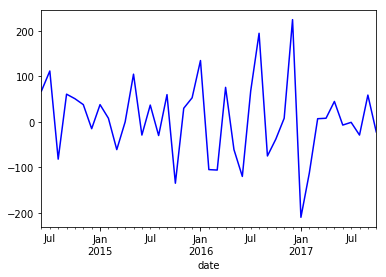

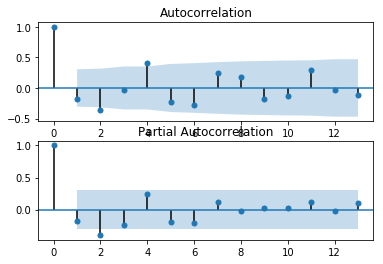

Test Statistic                 -3.875547
p-value                         0.002222
#Lags Used                      5.000000
Number of Observations Used    35.000000
Critical Value (5%)            -2.948510
Critical Value (1%)            -3.632743
Critical Value (10%)           -2.613017
dtype: float64
bic:100000 and p:0 q:0


AttributeError: 'NoneType' object has no attribute 'predict'

In [50]:
finalResult = {}
failedList = []
for value in sorted_result:
    print('CLASS: ', value[0])
    tempDf = pd.DataFrame(value[1], columns = ['date', 'sale_quantity'])
    tempDf['date'] = tempDf['date'].apply(strToDate)
    tempDf = tempDf.set_index('date')
    tempDf = tempDf['sale_quantity']
    tempDf.sort_index(inplace=True)

    # 差分
    ts_diff_1 = tempDf.diff(1)
    ts_diff_1.dropna(inplace=True)
    draw_ts(ts_diff_1)
    
    dataSize = len(ts_diff_1)
    lags = 15
    if dataSize<45:
        lags = round(dataSize/3)
    if dataSize < 10:
        continue
        
    draw_acf_pacf(ts_diff_1, lags=lags)
    stationarityResult = testStationarity(ts_diff_1)
    print(stationarityResult)

    # model
    bic, p, q, result_arma = proper_model(ts_diff_1, lags)
    print('bic:{} and p:{} q:{}'.format(bic, p, q))
    predict_ts = result_arma.predict(end=datetime(2017, 11, 1))
    
    #draw 残差
    f = plt.figure(facecolor='white')
    ts_diff_1.plot(color='red', label= 'Original')
    predict_ts.plot(color='blue', label = 'Predict')
    expweighted_avg = pd.ewma(ts_diff_1, halflife=12)
    expweighted_avg.plot(color='black', label='AVG')
    plt.show()
    
    # 一阶差分还原
    tempDf[datetime(2017, 11, 1)] = tempDf[datetime(2017, 10, 1)]
    shift_ts = tempDf.shift(1)
    diff_recover_1 = predict_ts.add(shift_ts)
    tempSeries = tempDf[diff_recover_1.index]
    plt.figure(facecolor='white')
    ax = plt.gca()
    ax.xaxis.set_major_locator(years)
    ax.xaxis.set_major_formatter(yearsFmt)
    ax.xaxis.set_minor_locator(months)
    diff_recover_1.plot(color='blue', label='Predict')
    tempDf.plot(color='red', label='Original')
    plt.legend(loc='best')
    lossScore = np.sqrt(sum(((diff_recover_1-tempSeries).dropna())**2)/tempSeries.size)
    plt.title('lossScore: %.4f'% lossScore)
    plt.show()
    
    if stationarityResult['p-value']>0.1 or lossScore > 100:
        failedList.append([value[0], stationarityResult['p-value'], lossScore])
    finalResult[value[0]] = diff_recover_1[datetime(2017, 11, 1)]

for value in failedList:
    print('class: {} and p-value: {} and lossScore: {}'.format(failedList[0], failedList[1], failedList[2]))

CLASS:  124140


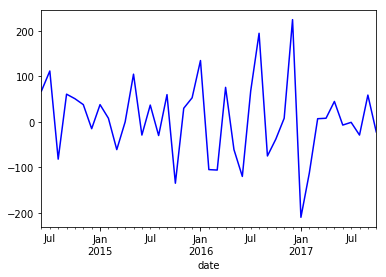

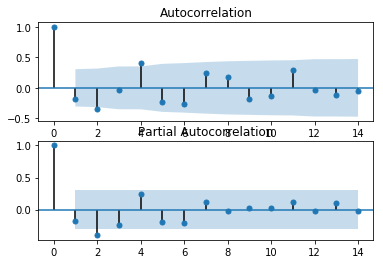

Test Statistic                 -3.875547
p-value                         0.002222
#Lags Used                      5.000000
Number of Observations Used    35.000000
Critical Value (5%)            -2.948510
Critical Value (1%)            -3.632743
Critical Value (10%)           -2.613017
dtype: float64
bic:353.84564952884483 and p:13 q:4


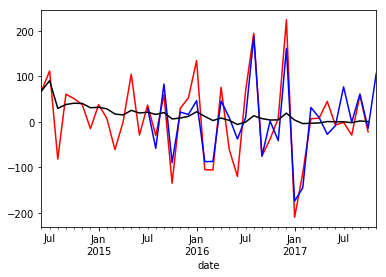

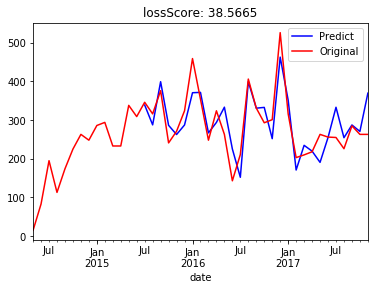

CLASS:  496459


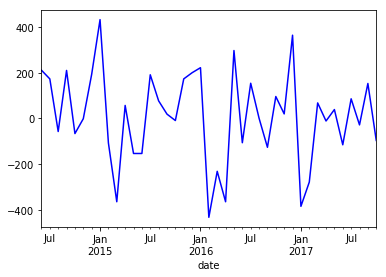

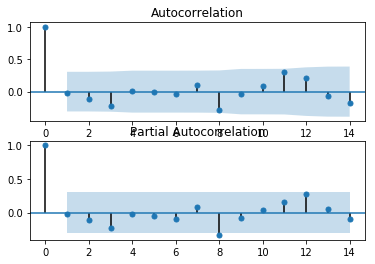

Test Statistic                 -4.494787
p-value                         0.000201
#Lags Used                      8.000000
Number of Observations Used    32.000000
Critical Value (5%)            -2.957219
Critical Value (1%)            -3.653520
Critical Value (10%)           -2.617588
dtype: float64
bic:396.2459631567323 and p:13 q:0


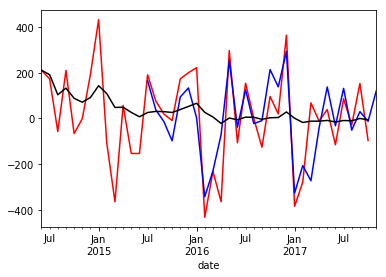

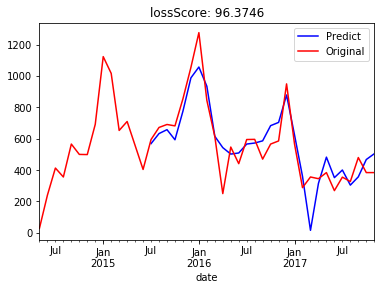

CLASS:  281792


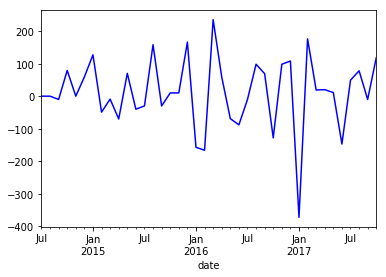

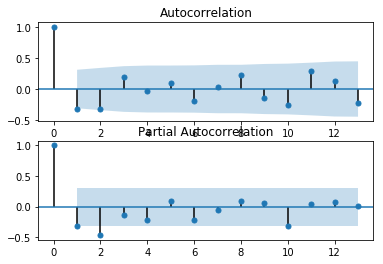

Test Statistic                 -4.926601
p-value                         0.000031
#Lags Used                      3.000000
Number of Observations Used    36.000000
Critical Value (5%)            -2.945951
Critical Value (1%)            -3.626652
Critical Value (10%)           -2.611671
dtype: float64
bic:370.0099454947605 and p:12 q:0


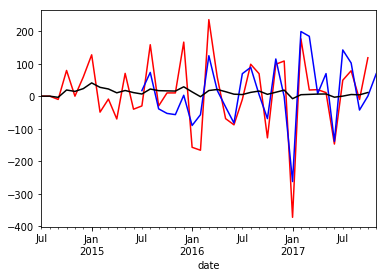

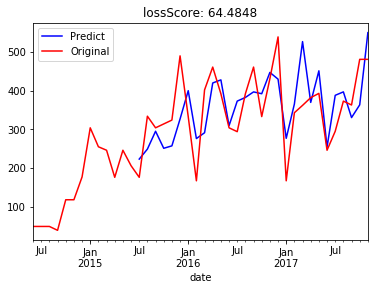

CLASS:  289386


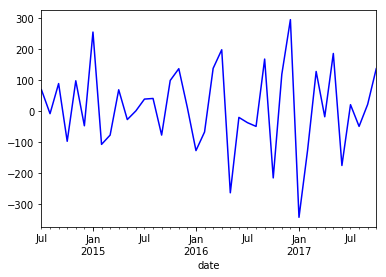

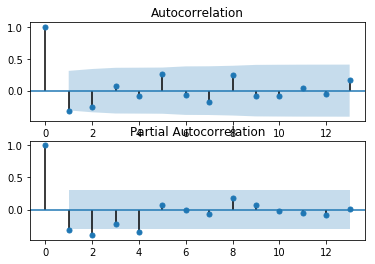

Test Statistic                -5.874709e+00
p-value                        3.179485e-07
#Lags Used                     3.000000e+00
Number of Observations Used    3.600000e+01
Critical Value (5%)           -2.945951e+00
Critical Value (1%)           -3.626652e+00
Critical Value (10%)          -2.611671e+00
dtype: float64
bic:382.4618193950947 and p:12 q:1


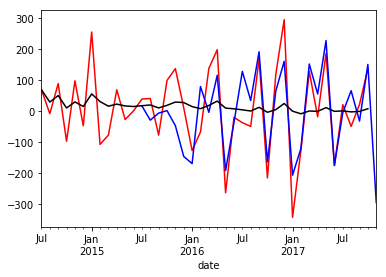

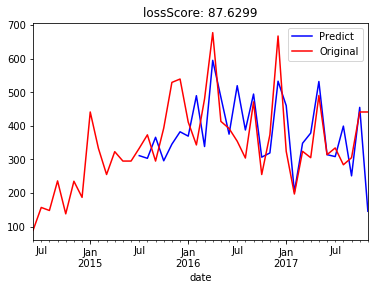

CLASS:  739296


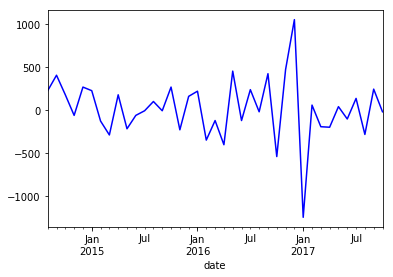

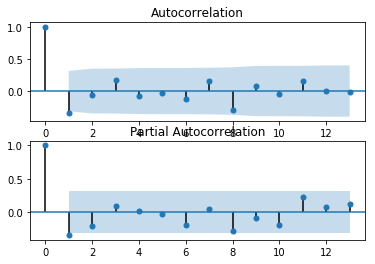

Test Statistic                -6.188302e+00
p-value                        6.211289e-08
#Lags Used                     1.000000e+00
Number of Observations Used    3.700000e+01
Critical Value (5%)           -2.943539e+00
Critical Value (1%)           -3.620918e+00
Critical Value (10%)          -2.610400e+00
dtype: float64
bic:421.1198386436759 and p:12 q:0


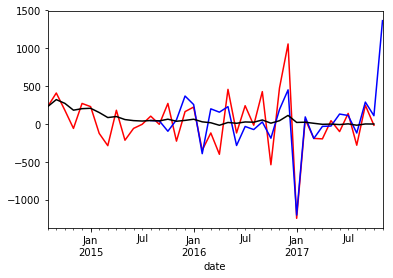

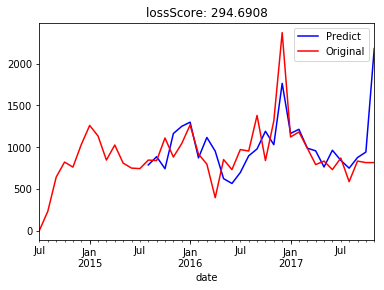

CLASS:  219195


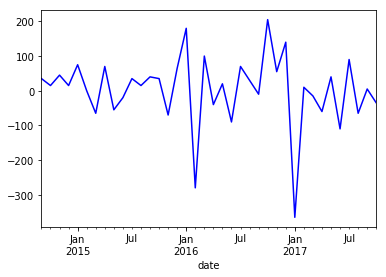

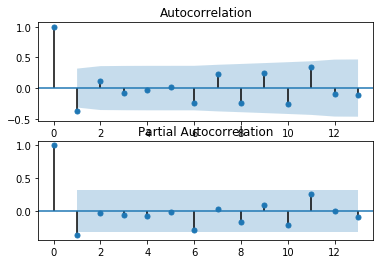

Test Statistic                -8.717185e+00
p-value                        3.462844e-14
#Lags Used                     0.000000e+00
Number of Observations Used    3.700000e+01
Critical Value (5%)           -2.943539e+00
Critical Value (1%)           -3.620918e+00
Critical Value (10%)          -2.610400e+00
dtype: float64
bic:353.2478275241912 and p:12 q:0


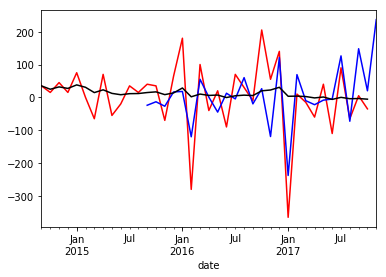

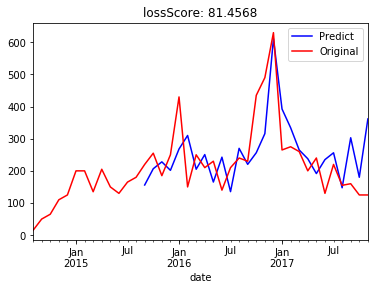

CLASS:  978089


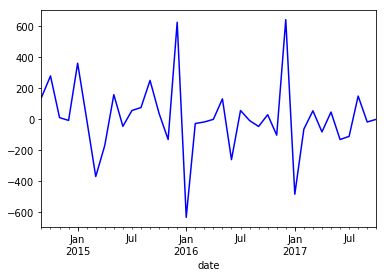

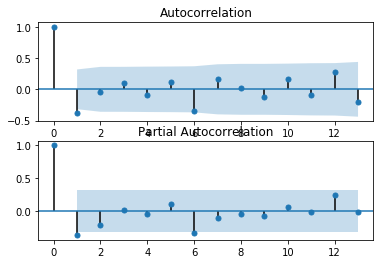

Test Statistic                -6.227106e+00
p-value                        5.057280e-08
#Lags Used                     1.000000e+00
Number of Observations Used    3.600000e+01
Critical Value (5%)           -2.945951e+00
Critical Value (1%)           -3.626652e+00
Critical Value (10%)          -2.611671e+00
dtype: float64
bic:382.0783812587813 and p:12 q:1


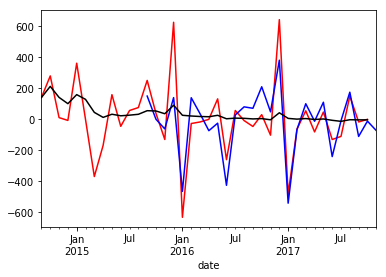

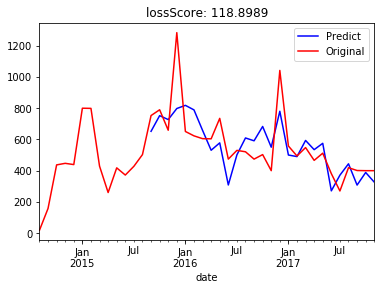

CLASS:  591790


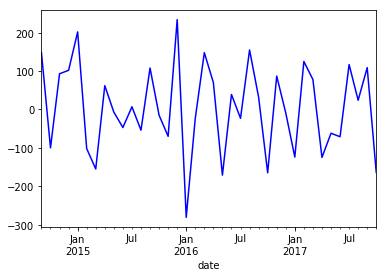

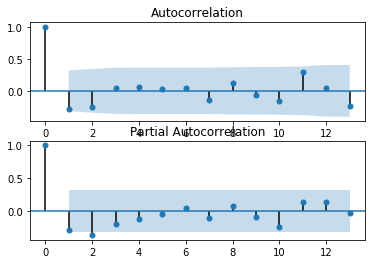

Test Statistic                 -5.055504
p-value                         0.000017
#Lags Used                      4.000000
Number of Observations Used    33.000000
Critical Value (5%)            -2.954127
Critical Value (1%)            -3.646135
Critical Value (10%)           -2.615968
dtype: float64
bic:338.361876897301 and p:12 q:0


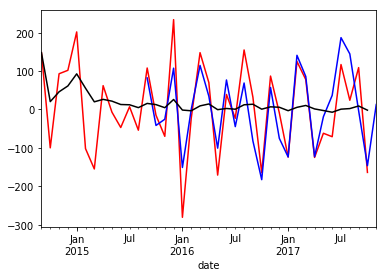

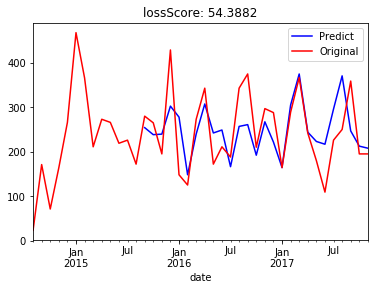

CLASS:  649213


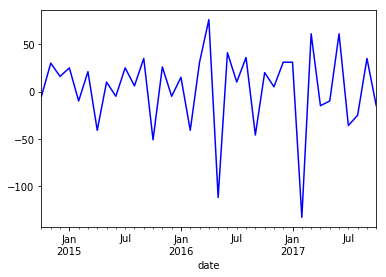

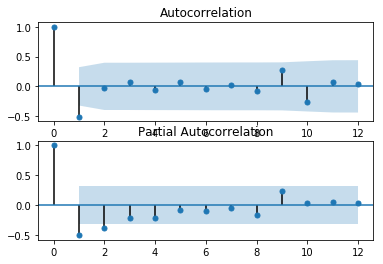

Test Statistic                 -5.068185
p-value                         0.000016
#Lags Used                      3.000000
Number of Observations Used    33.000000
Critical Value (5%)            -2.954127
Critical Value (1%)            -3.646135
Critical Value (10%)           -2.615968
dtype: float64
bic:293.1565490796188 and p:11 q:0


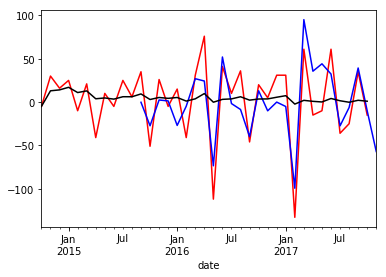

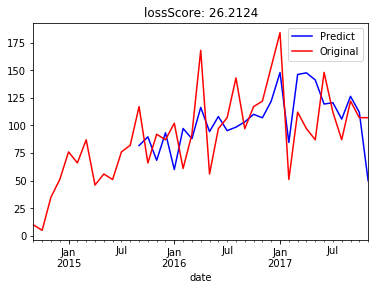

CLASS:  714860


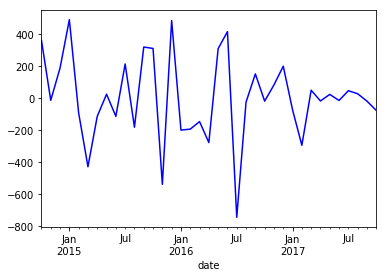

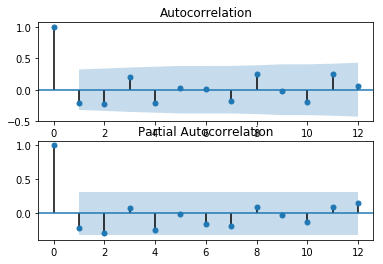

Test Statistic                -6.136813e+00
p-value                        8.149509e-08
#Lags Used                     1.000000e+00
Number of Observations Used    3.500000e+01
Critical Value (5%)           -2.948510e+00
Critical Value (1%)           -3.632743e+00
Critical Value (10%)          -2.613017e+00
dtype: float64
bic:390.9774939316175 and p:11 q:1


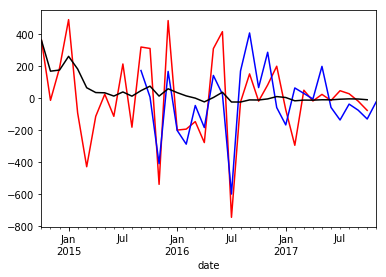

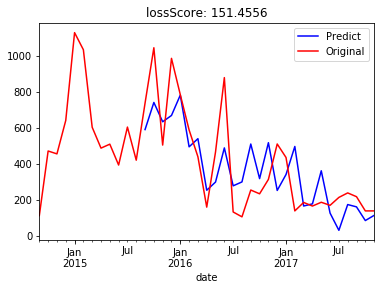

CLASS:  741152


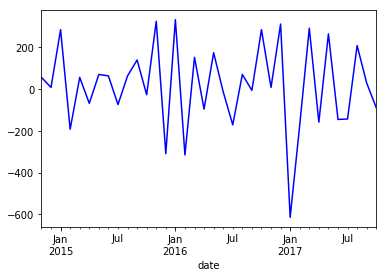

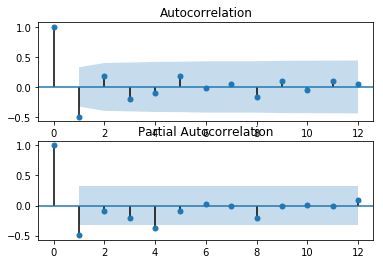

Test Statistic                -9.897414e+00
p-value                        3.428570e-17
#Lags Used                     0.000000e+00
Number of Observations Used    3.500000e+01
Critical Value (5%)           -2.948510e+00
Critical Value (1%)           -3.632743e+00
Critical Value (10%)          -2.613017e+00
dtype: float64
bic:358.4019319499321 and p:11 q:4


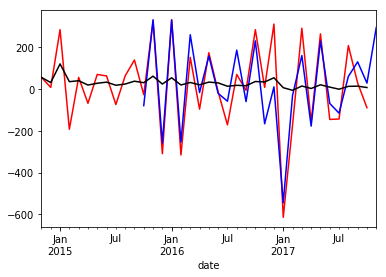

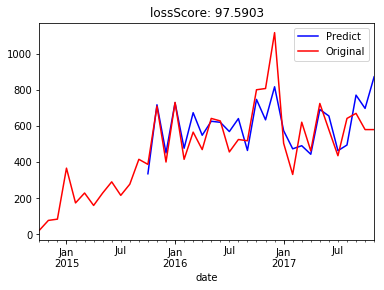

CLASS:  963845


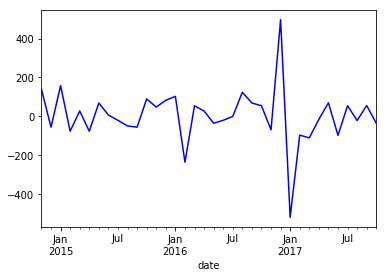

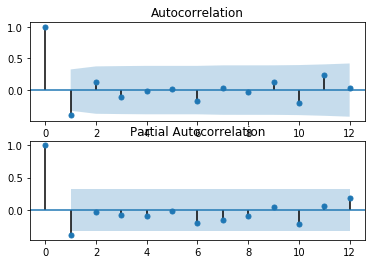

Test Statistic                -8.885417e+00
p-value                        1.284183e-14
#Lags Used                     0.000000e+00
Number of Observations Used    3.500000e+01
Critical Value (5%)           -2.948510e+00
Critical Value (1%)           -3.632743e+00
Critical Value (10%)          -2.613017e+00
dtype: float64
bic:353.0254039402794 and p:11 q:0


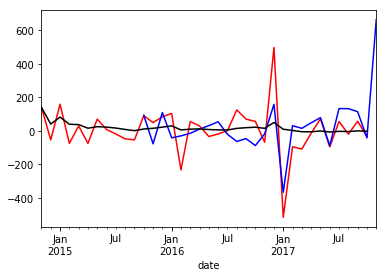

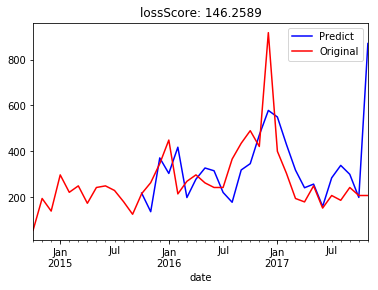

CLASS:  587678


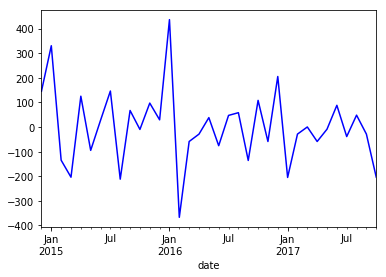

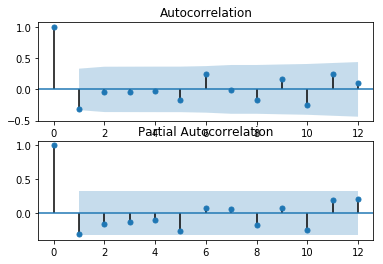

Test Statistic                -7.856656e+00
p-value                        5.420128e-12
#Lags Used                     0.000000e+00
Number of Observations Used    3.400000e+01
Critical Value (5%)           -2.951230e+00
Critical Value (1%)           -3.639224e+00
Critical Value (10%)          -2.614447e+00
dtype: float64
bic:324.62451742943045 and p:11 q:1


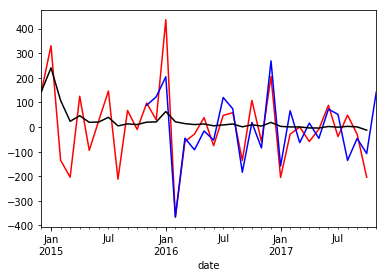

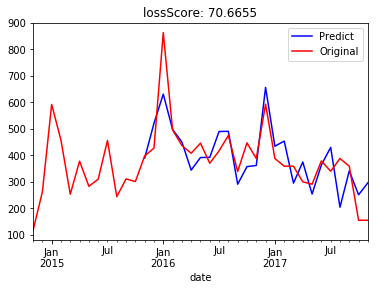

CLASS:  350259


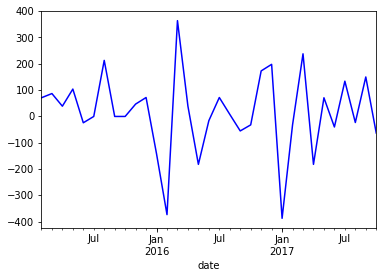

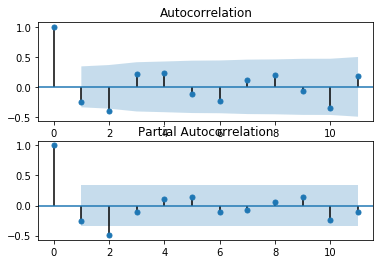

Test Statistic                -7.374418e+00
p-value                        8.798788e-11
#Lags Used                     1.000000e+00
Number of Observations Used    3.100000e+01
Critical Value (5%)           -2.960525e+00
Critical Value (1%)           -3.661429e+00
Critical Value (10%)          -2.619319e+00
dtype: float64
bic:317.8838907222166 and p:10 q:1


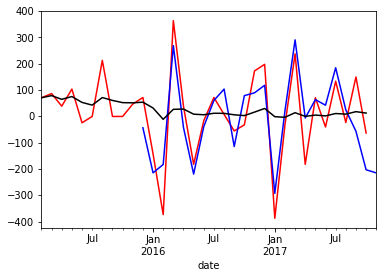

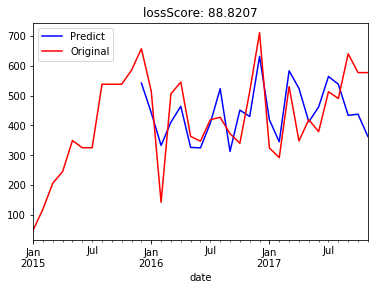

CLASS:  924154


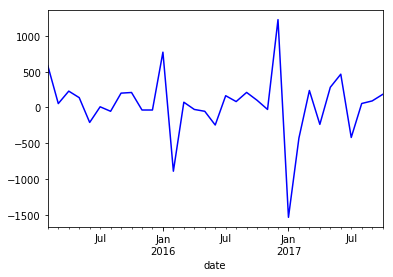

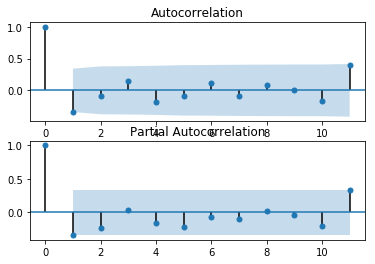

Test Statistic                 -2.442711
p-value                         0.130043
#Lags Used                     10.000000
Number of Observations Used    22.000000
Critical Value (5%)            -3.005426
Critical Value (1%)            -3.769733
Critical Value (10%)           -2.642501
dtype: float64
bic:374.3186245793228 and p:10 q:0


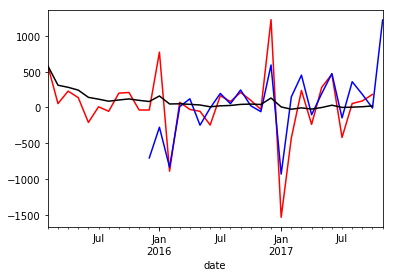

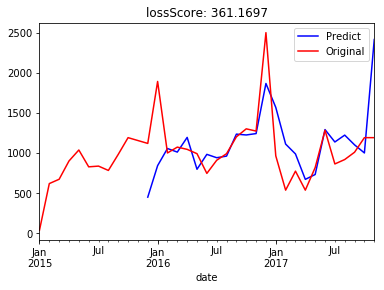

CLASS:  270690


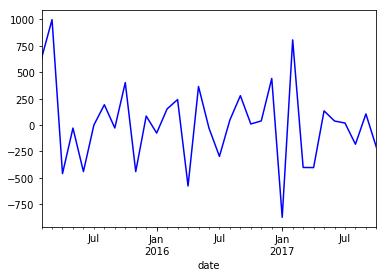

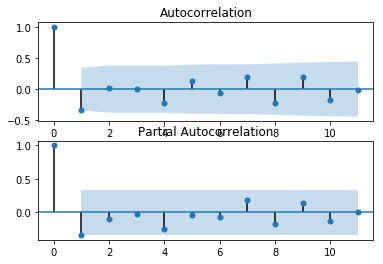

Test Statistic                -7.636351e+00
p-value                        1.947779e-11
#Lags Used                     1.000000e+00
Number of Observations Used    3.100000e+01
Critical Value (5%)           -2.960525e+00
Critical Value (1%)           -3.661429e+00
Critical Value (10%)          -2.619319e+00
dtype: float64
bic:342.53879522614267 and p:10 q:2


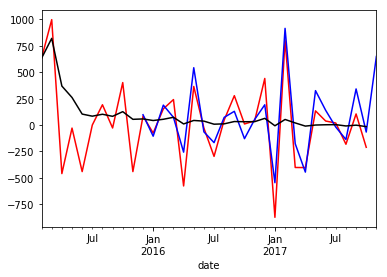

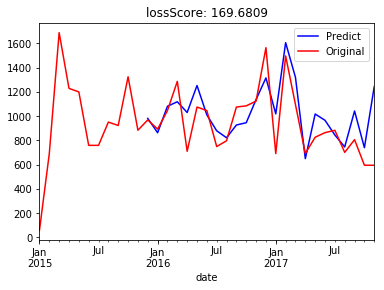

CLASS:  416749


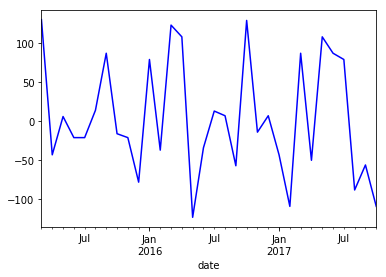

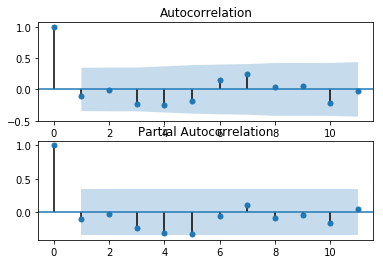

Test Statistic                 -4.581639
p-value                         0.000140
#Lags Used                      5.000000
Number of Observations Used    26.000000
Critical Value (5%)            -2.981247
Critical Value (1%)            -3.711212
Critical Value (10%)           -2.630095
dtype: float64
bic:272.8884136566647 and p:10 q:0


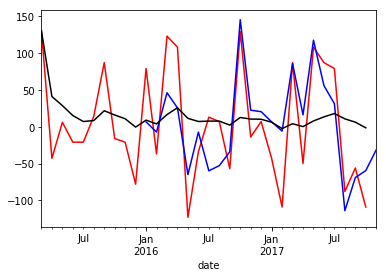

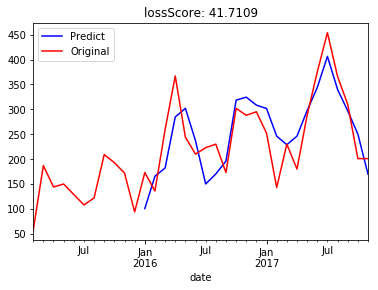

CLASS:  103507


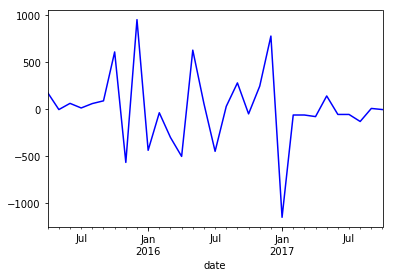

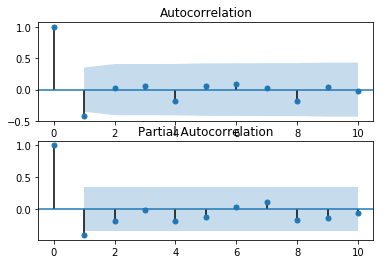

Test Statistic                 -5.195147
p-value                         0.000009
#Lags Used                      1.000000
Number of Observations Used    29.000000
Critical Value (5%)            -2.967882
Critical Value (1%)            -3.679060
Critical Value (10%)           -2.623158
dtype: float64
bic:343.07137753666154 and p:9 q:4


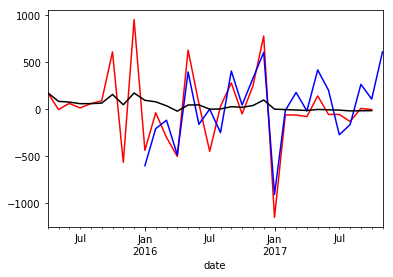

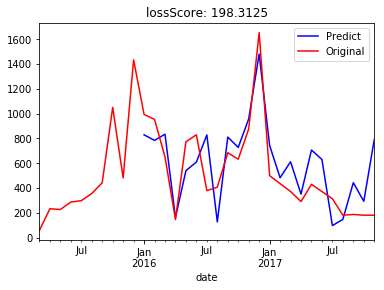

CLASS:  401052


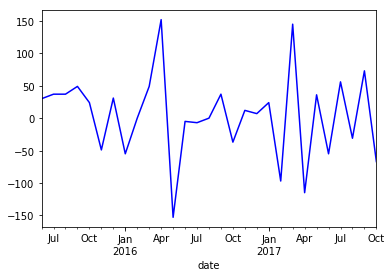

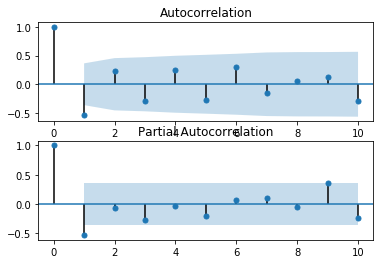

Test Statistic                 -1.390350
p-value                         0.586894
#Lags Used                      8.000000
Number of Observations Used    20.000000
Critical Value (5%)            -3.021645
Critical Value (1%)            -3.809209
Critical Value (10%)           -2.650713
dtype: float64
bic:233.93132683051604 and p:9 q:0


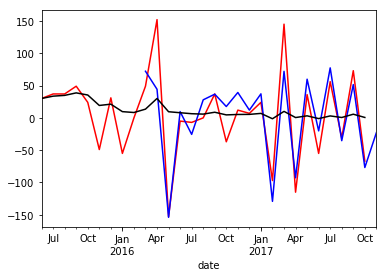

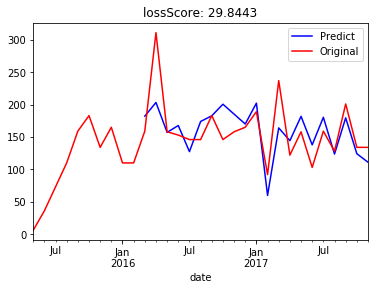

CLASS:  692703


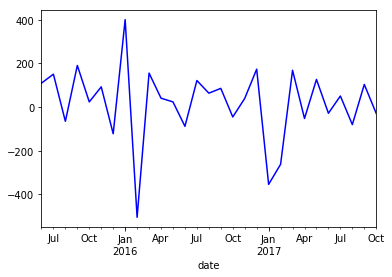

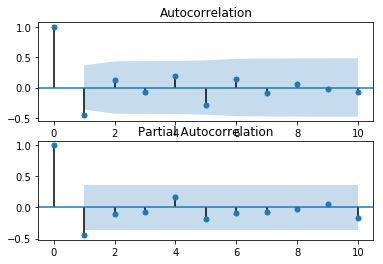

Test Statistic                -8.313363e+00
p-value                        3.737003e-13
#Lags Used                     0.000000e+00
Number of Observations Used    2.800000e+01
Critical Value (5%)           -2.971989e+00
Critical Value (1%)           -3.688926e+00
Critical Value (10%)          -2.625296e+00
dtype: float64
bic:279.2031107817019 and p:9 q:2


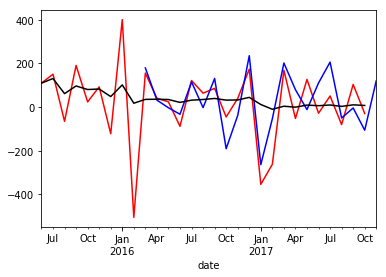

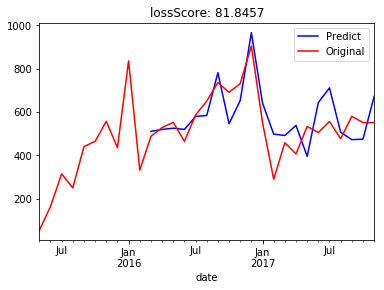

CLASS:  437598


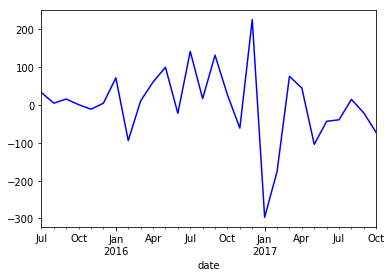

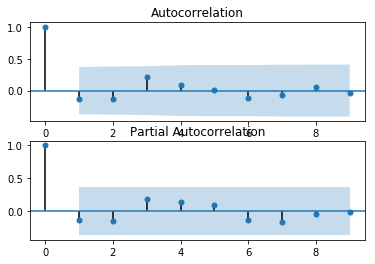

Test Statistic                -5.676731e+00
p-value                        8.670419e-07
#Lags Used                     0.000000e+00
Number of Observations Used    2.700000e+01
Critical Value (5%)           -2.976430e+00
Critical Value (1%)           -3.699608e+00
Critical Value (10%)          -2.627601e+00
dtype: float64
bic:272.751585695191 and p:8 q:0


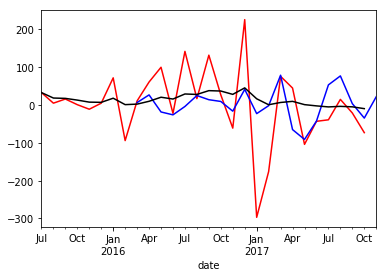

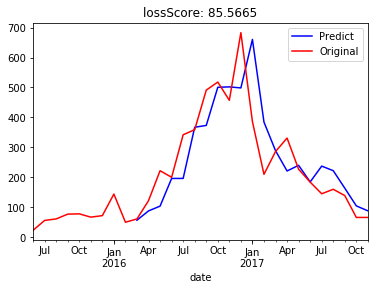

CLASS:  750340


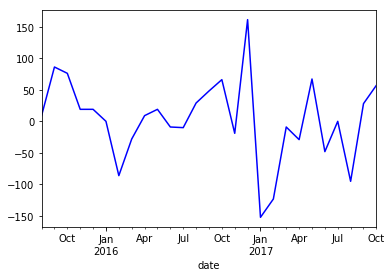

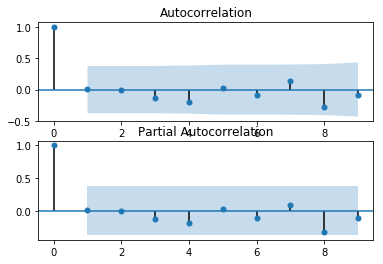

Test Statistic                 -4.809331
p-value                         0.000052
#Lags Used                      0.000000
Number of Observations Used    26.000000
Critical Value (5%)            -2.981247
Critical Value (1%)            -3.711212
Critical Value (10%)           -2.630095
dtype: float64
bic:238.7998117451797 and p:8 q:0


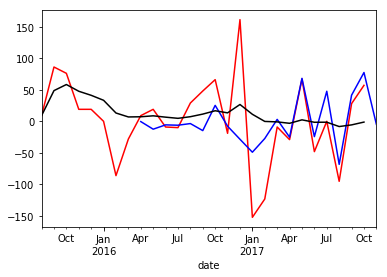

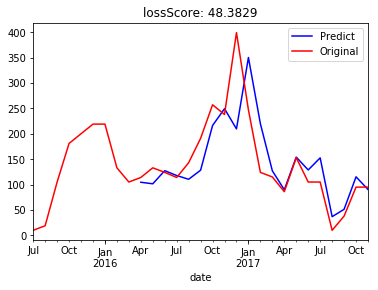

CLASS:  206765


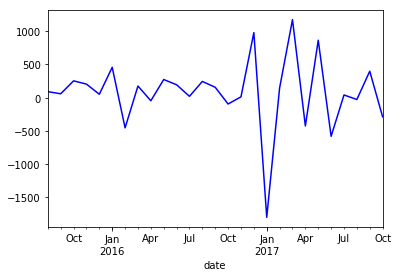

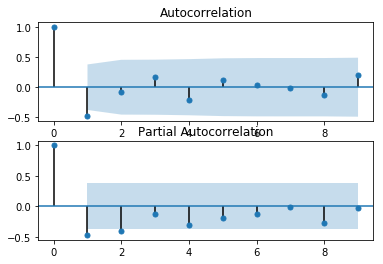

Test Statistic                -6.176973e+00
p-value                        6.594516e-08
#Lags Used                     1.000000e+00
Number of Observations Used    2.500000e+01
Critical Value (5%)           -2.986489e+00
Critical Value (1%)           -3.723863e+00
Critical Value (10%)          -2.632800e+00
dtype: float64
bic:310.2319081726708 and p:8 q:0


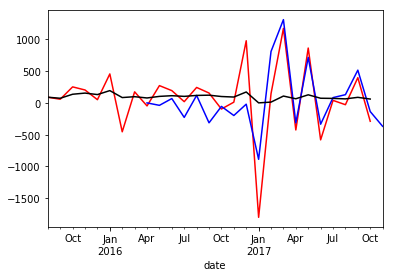

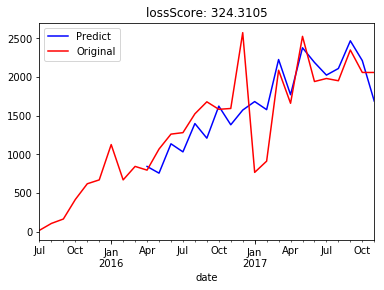

CLASS:  654134


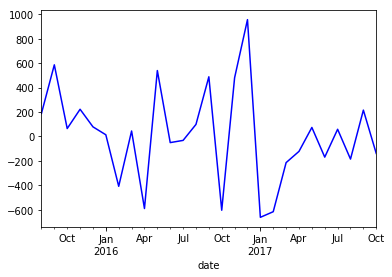

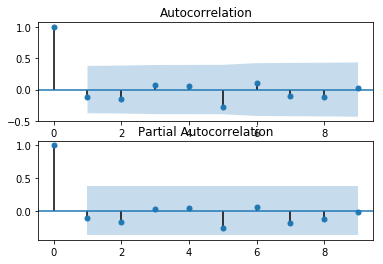

Test Statistic                 -4.516440
p-value                         0.000184
#Lags Used                      1.000000
Number of Observations Used    25.000000
Critical Value (5%)            -2.986489
Critical Value (1%)            -3.723863
Critical Value (10%)           -2.632800
dtype: float64
bic:307.0412637061644 and p:8 q:3


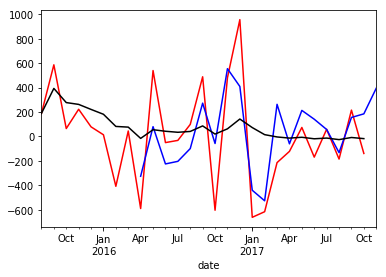

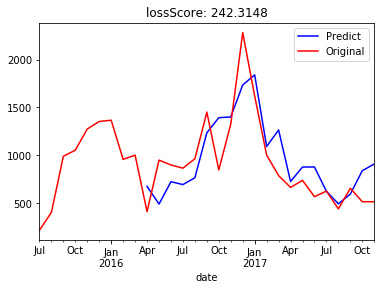

CLASS:  516750


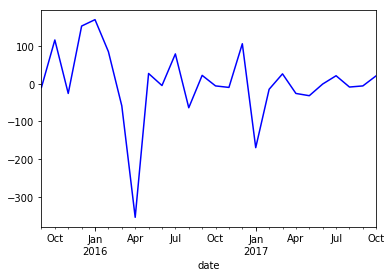

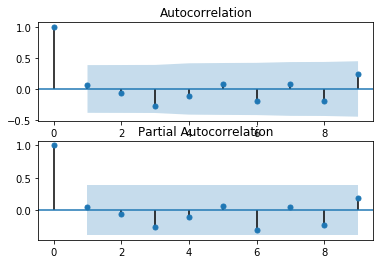

Test Statistic                 -3.498774
p-value                         0.008019
#Lags Used                      8.000000
Number of Observations Used    17.000000
Critical Value (5%)            -3.054358
Critical Value (1%)            -3.889266
Critical Value (10%)           -2.666984
dtype: float64
bic:196.61010928144557 and p:8 q:3


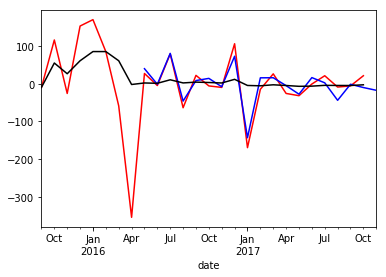

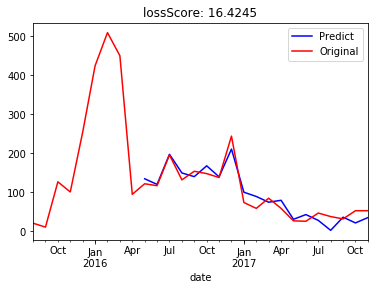

CLASS:  810398


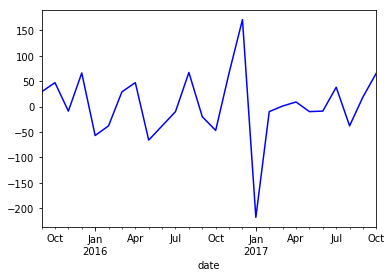

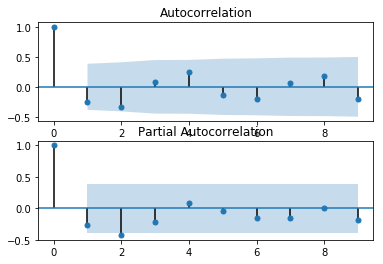

Test Statistic                -5.982930e+00
p-value                        1.820367e-07
#Lags Used                     1.000000e+00
Number of Observations Used    2.400000e+01
Critical Value (5%)           -2.992216e+00
Critical Value (1%)           -3.737709e+00
Critical Value (10%)          -2.635747e+00
dtype: float64
bic:218.46255490103437 and p:8 q:1


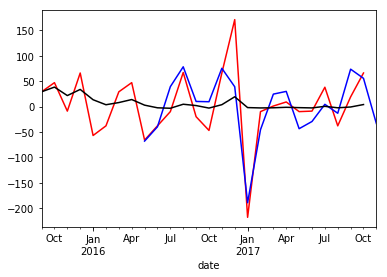

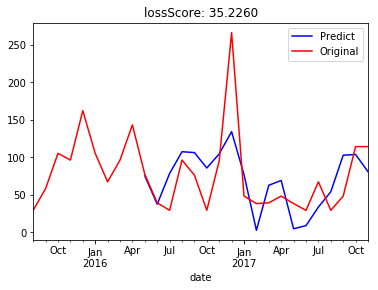

CLASS:  348641


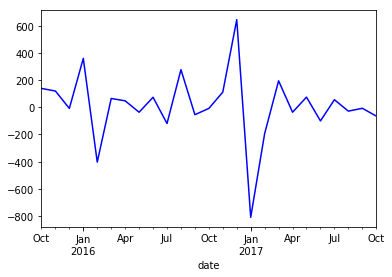

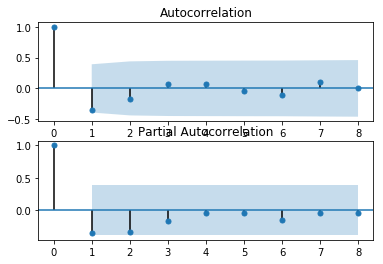

Test Statistic                 -5.386585
p-value                         0.000004
#Lags Used                      1.000000
Number of Observations Used    23.000000
Critical Value (5%)            -2.998500
Critical Value (1%)            -3.752928
Critical Value (10%)           -2.638967
dtype: float64
bic:268.2925936257818 and p:7 q:3


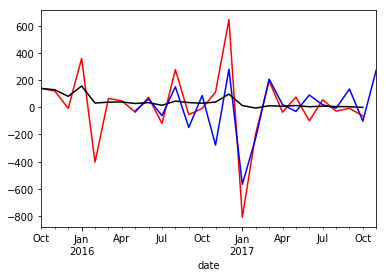

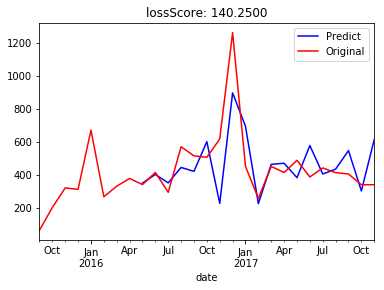

CLASS:  492952


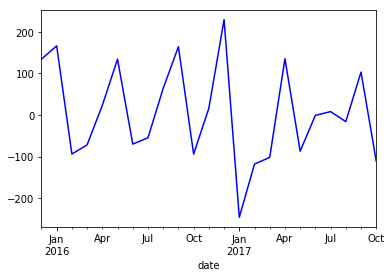

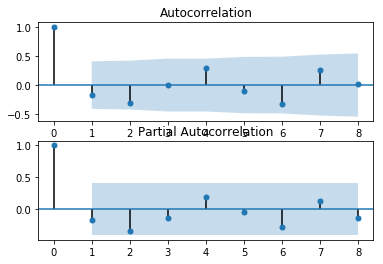

Test Statistic                 -5.341955
p-value                         0.000004
#Lags Used                      0.000000
Number of Observations Used    22.000000
Critical Value (5%)            -3.005426
Critical Value (1%)            -3.769733
Critical Value (10%)           -2.642501
dtype: float64
bic:212.41602315910214 and p:7 q:3


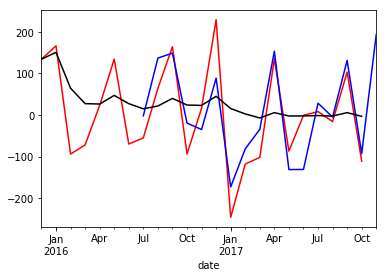

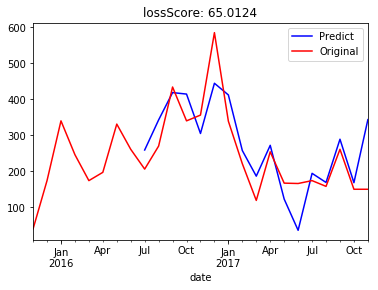

CLASS:  510309


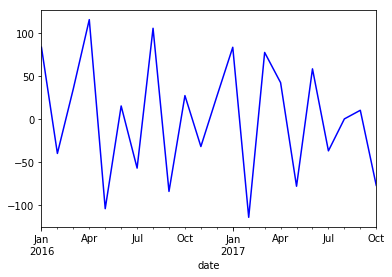

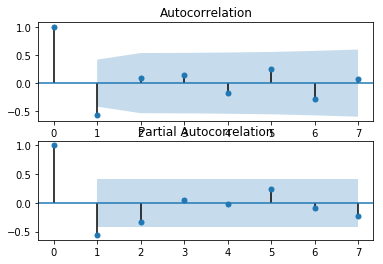

Test Statistic                -5.744290e+00
p-value                        6.172657e-07
#Lags Used                     9.000000e+00
Number of Observations Used    1.200000e+01
Critical Value (5%)           -3.154972e+00
Critical Value (1%)           -4.137829e+00
Critical Value (10%)          -2.714477e+00
dtype: float64
bic:175.7866680843272 and p:6 q:2


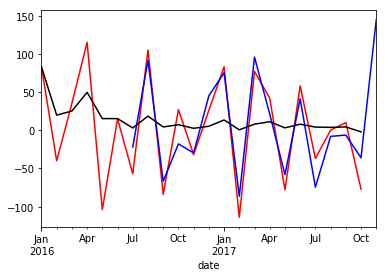

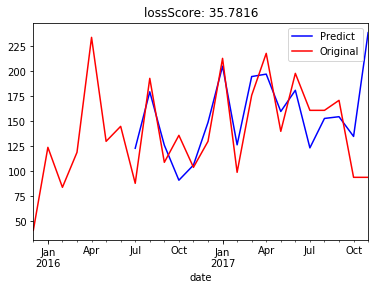

CLASS:  736094


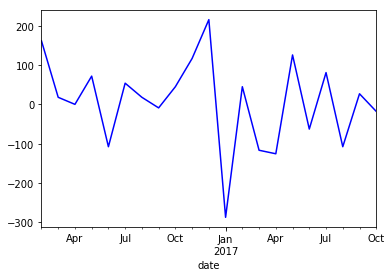

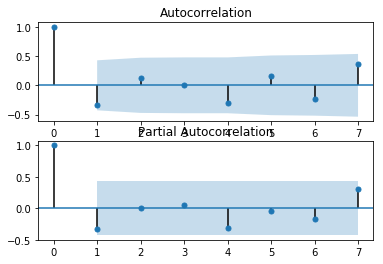

Test Statistic                  0.000000
p-value                         0.958532
#Lags Used                      9.000000
Number of Observations Used    11.000000
Critical Value (5%)            -3.189369
Critical Value (1%)            -4.223238
Critical Value (10%)           -2.729839
dtype: float64
bic:199.38468930880637 and p:6 q:2


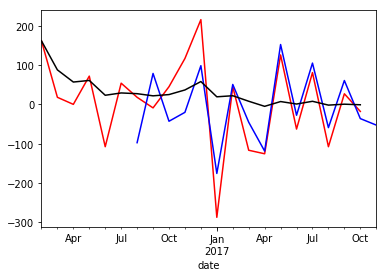

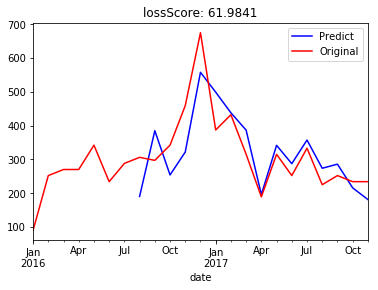

CLASS:  186250


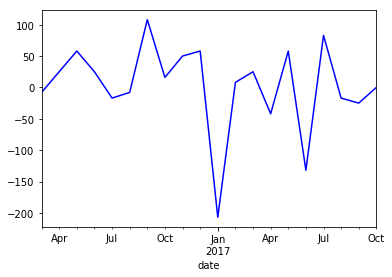

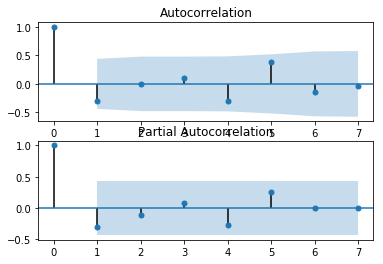

Test Statistic                  0.201991
p-value                         0.972373
#Lags Used                      8.000000
Number of Observations Used    11.000000
Critical Value (5%)            -3.189369
Critical Value (1%)            -4.223238
Critical Value (10%)           -2.729839
dtype: float64
bic:178.5851178593086 and p:6 q:0


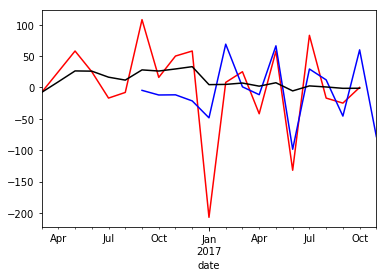

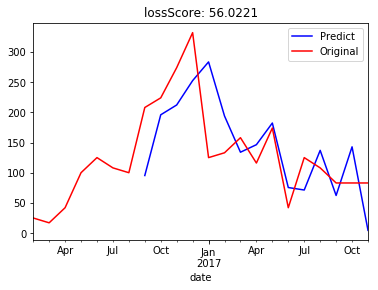

CLASS:  953842


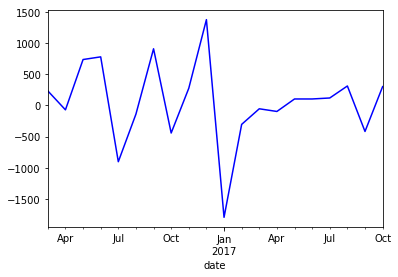

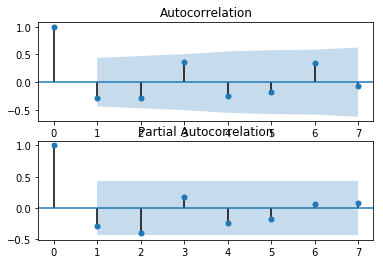

Test Statistic                 -0.000000
p-value                         0.958532
#Lags Used                      9.000000
Number of Observations Used    10.000000
Critical Value (5%)            -3.232950
Critical Value (1%)            -4.331573
Critical Value (10%)           -2.748700
dtype: float64
bic:236.8465688611568 and p:6 q:2


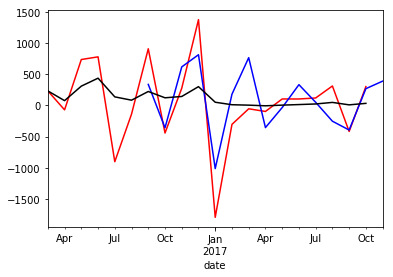

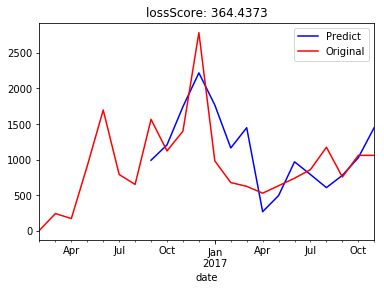

CLASS:  250658


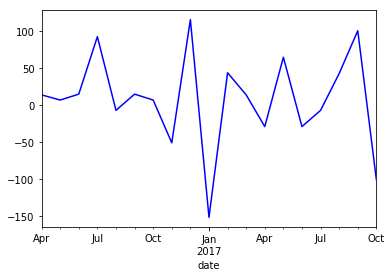

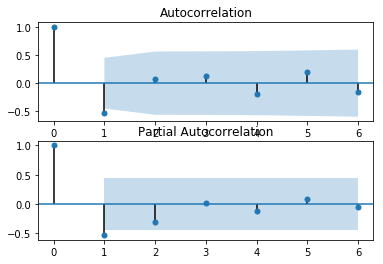

Test Statistic                 -0.000000
p-value                         0.958532
#Lags Used                      8.000000
Number of Observations Used    10.000000
Critical Value (5%)            -3.232950
Critical Value (1%)            -4.331573
Critical Value (10%)           -2.748700
dtype: float64
bic:166.34774371019236 and p:5 q:1


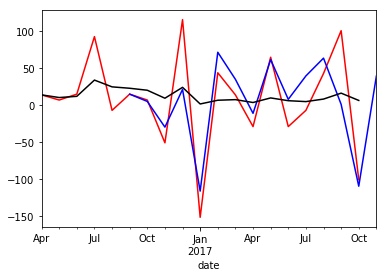

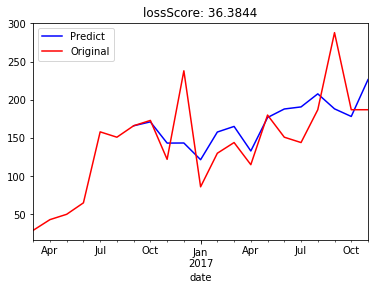

CLASS:  540712


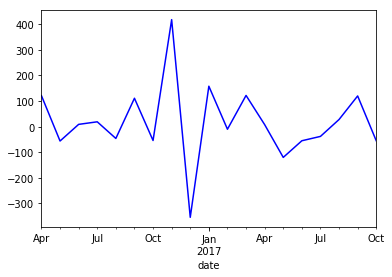

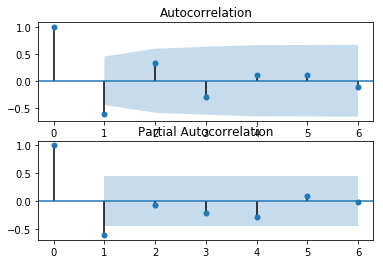

Test Statistic                 -0.000000
p-value                         0.958532
#Lags Used                      8.000000
Number of Observations Used    10.000000
Critical Value (5%)            -3.232950
Critical Value (1%)            -4.331573
Critical Value (10%)           -2.748700
dtype: float64
bic:191.6595666191791 and p:5 q:1


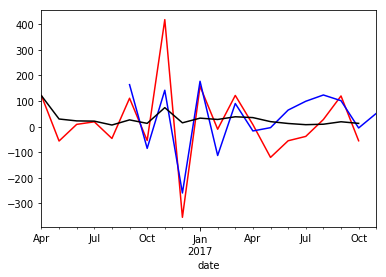

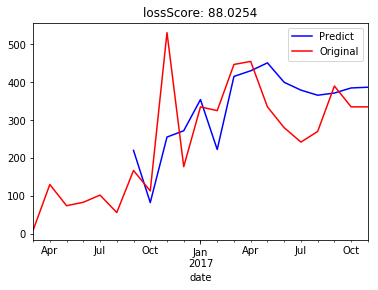

CLASS:  526401


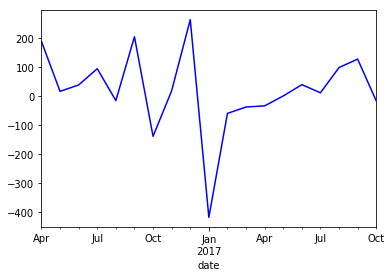

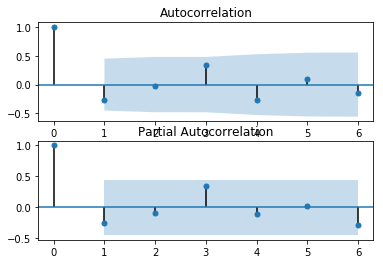

Test Statistic                 -0.000000
p-value                         0.958532
#Lags Used                      8.000000
Number of Observations Used    10.000000
Critical Value (5%)            -3.232950
Critical Value (1%)            -4.331573
Critical Value (10%)           -2.748700
dtype: float64
bic:193.971310412436 and p:5 q:1


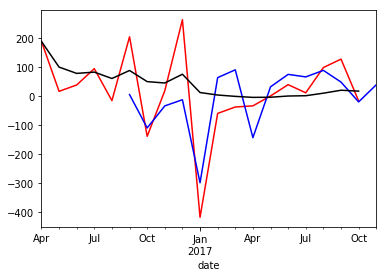

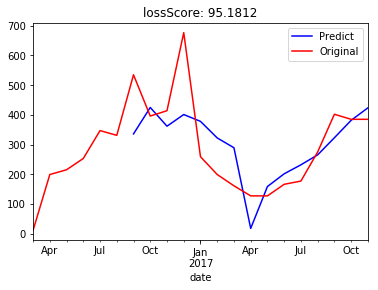

CLASS:  378356


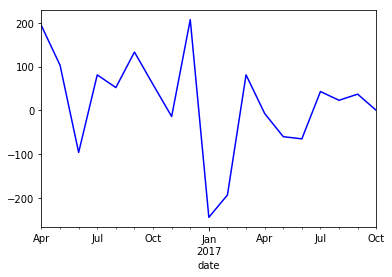

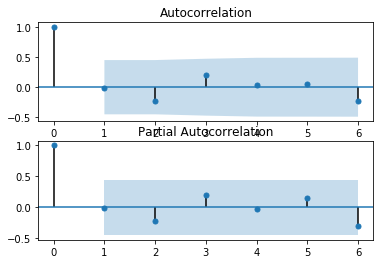

Test Statistic                 -0.000000
p-value                         0.958532
#Lags Used                      8.000000
Number of Observations Used    10.000000
Critical Value (5%)            -3.232950
Critical Value (1%)            -4.331573
Critical Value (10%)           -2.748700
dtype: float64
bic:182.91296060184962 and p:5 q:4


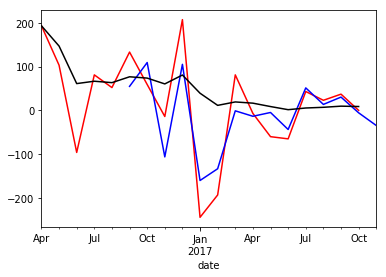

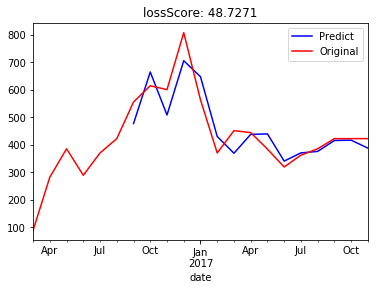

CLASS:  245609


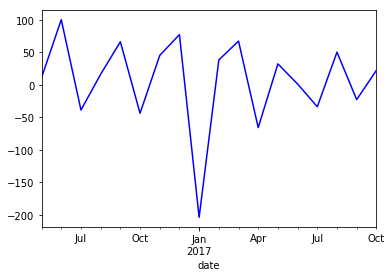

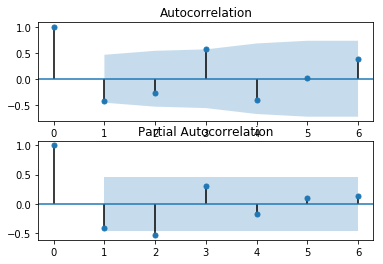

Test Statistic                -0.000000
p-value                        0.958532
#Lags Used                     8.000000
Number of Observations Used    9.000000
Critical Value (5%)           -3.289881
Critical Value (1%)           -4.473135
Critical Value (10%)          -2.772382
dtype: float64
bic:148.71682942085 and p:5 q:2


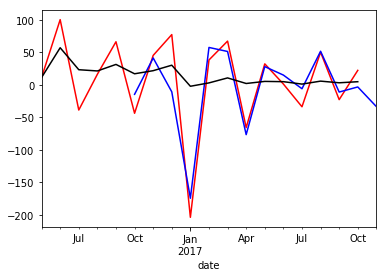

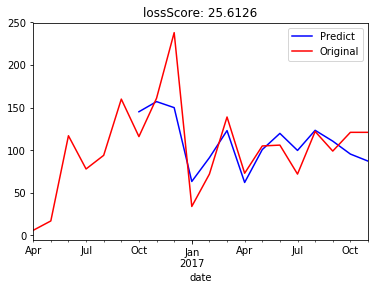

CLASS:  851857


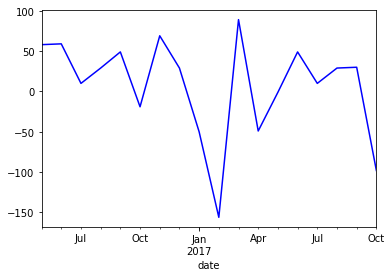

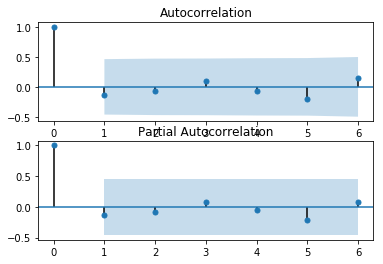

Test Statistic                 -1.388756
p-value                         0.587655
#Lags Used                      7.000000
Number of Observations Used    10.000000
Critical Value (5%)            -3.232950
Critical Value (1%)            -4.331573
Critical Value (10%)           -2.748700
dtype: float64
bic:156.0258095945937 and p:5 q:4


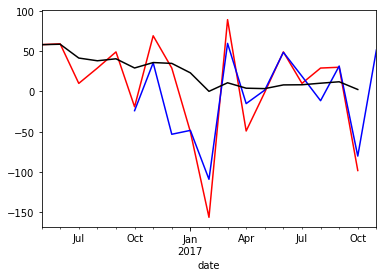

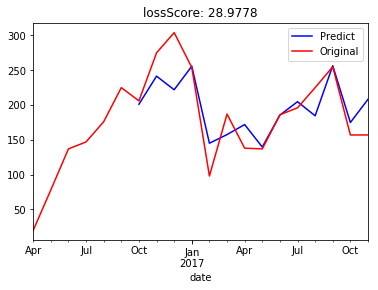

CLASS:  289403


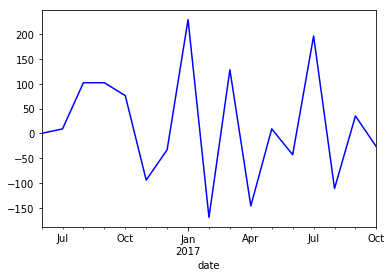

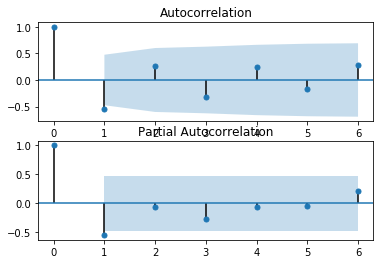

Test Statistic                -0.000000
p-value                        0.958532
#Lags Used                     8.000000
Number of Observations Used    8.000000
Critical Value (5%)           -3.367187
Critical Value (1%)           -4.665186
Critical Value (10%)          -2.802961
dtype: float64
bic:153.29186483365396 and p:5 q:1


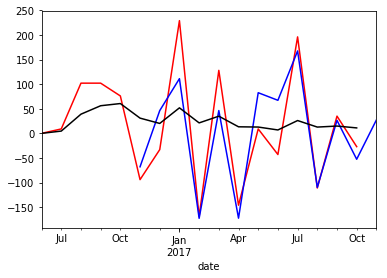

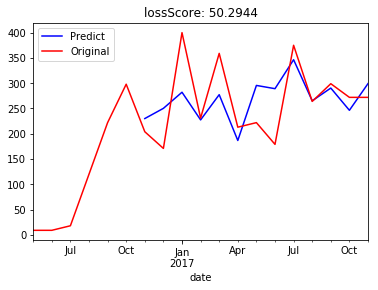

CLASS:  412240


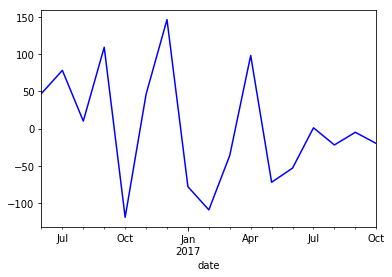

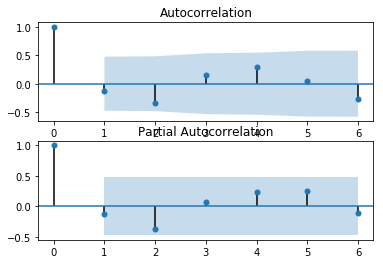

Test Statistic                -0.000000
p-value                        0.958532
#Lags Used                     7.000000
Number of Observations Used    9.000000
Critical Value (5%)           -3.289881
Critical Value (1%)           -4.473135
Critical Value (10%)          -2.772382
dtype: float64
bic:142.95087039840763 and p:5 q:0


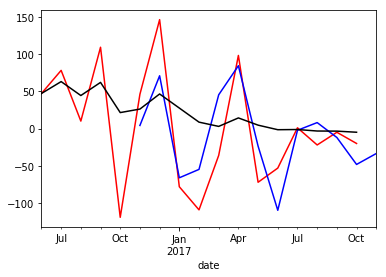

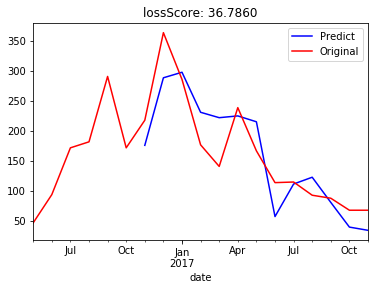

CLASS:  481950


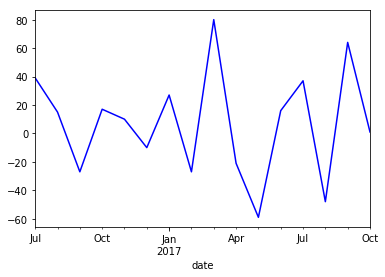

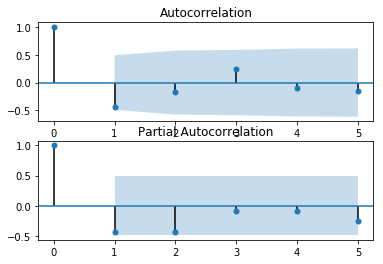

Test Statistic                -0.000000
p-value                        0.958532
#Lags Used                     8.000000
Number of Observations Used    7.000000
Critical Value (5%)           -3.477583
Critical Value (1%)           -4.938690
Critical Value (10%)          -2.843868
dtype: float64
bic:124.78599820096228 and p:4 q:2


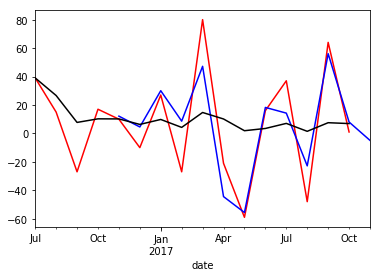

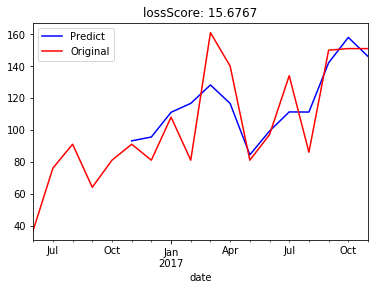

CLASS:  619401


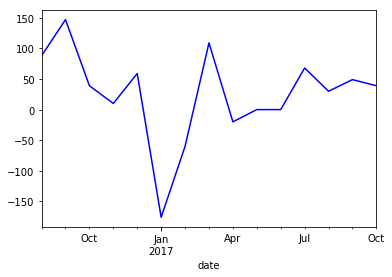

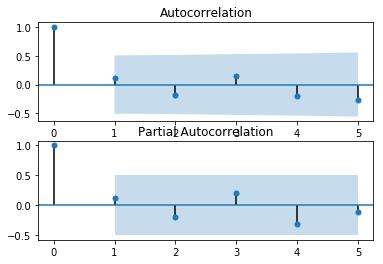

Test Statistic                -0.000000
p-value                        0.958532
#Lags Used                     8.000000
Number of Observations Used    6.000000
Critical Value (5%)           -3.646238
Critical Value (1%)           -5.354256
Critical Value (10%)          -2.901198
dtype: float64
bic:134.03972803259512 and p:4 q:1


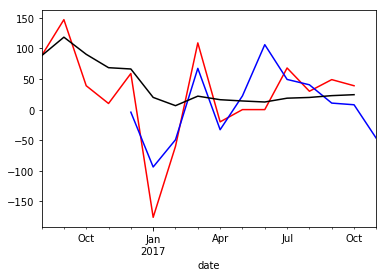

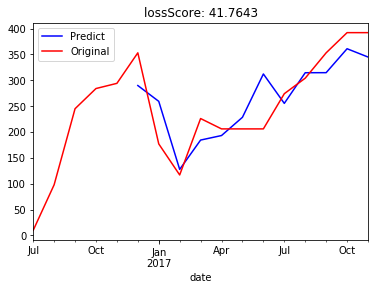

CLASS:  950264


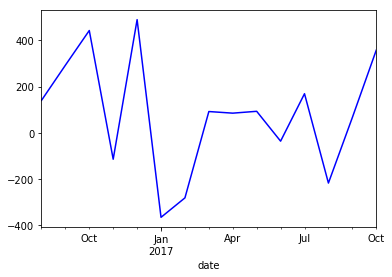

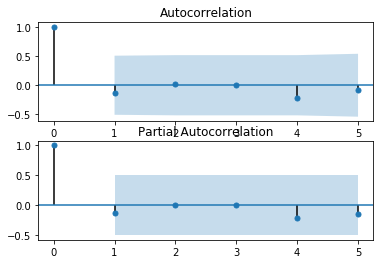

Test Statistic                 0.000000
p-value                        0.958532
#Lags Used                     7.000000
Number of Observations Used    7.000000
Critical Value (5%)           -3.477583
Critical Value (1%)           -4.938690
Critical Value (10%)          -2.843868
dtype: float64
bic:159.33421686627938 and p:4 q:3


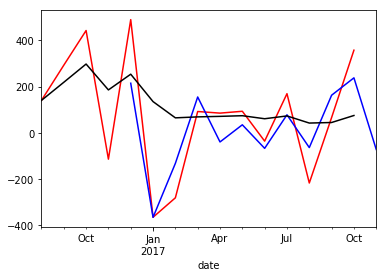

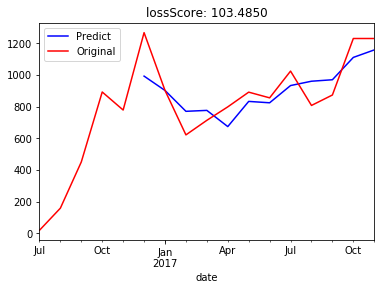

CLASS:  392593


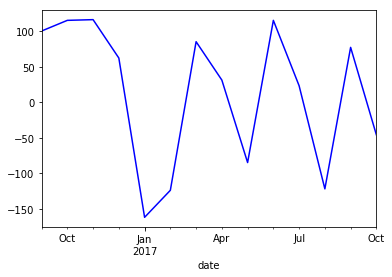

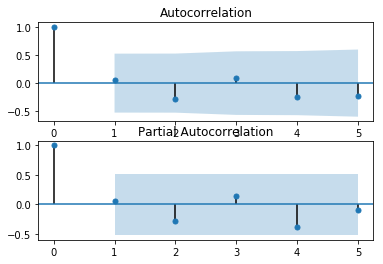

Test Statistic                -1.612021
p-value                        0.476915
#Lags Used                     5.000000
Number of Observations Used    8.000000
Critical Value (5%)           -3.367187
Critical Value (1%)           -4.665186
Critical Value (10%)          -2.802961
dtype: float64
bic:114.6412703029431 and p:4 q:0


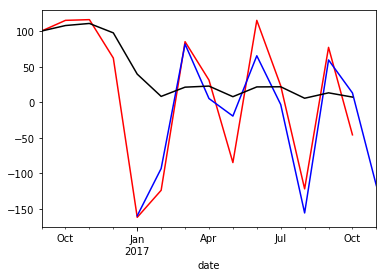

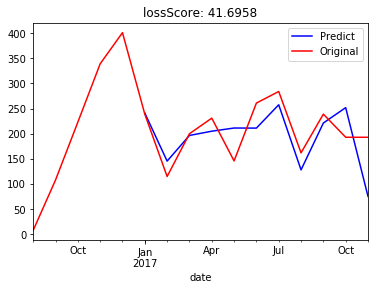

CLASS:  683364


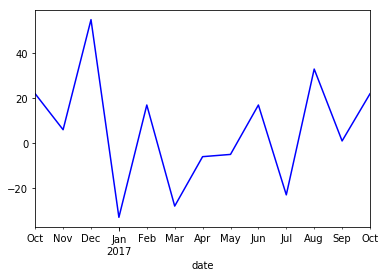

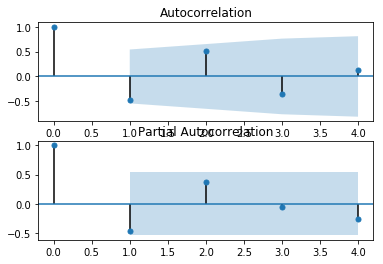

Test Statistic                -1.457183
p-value                        0.554576
#Lags Used                     4.000000
Number of Observations Used    8.000000
Critical Value (5%)           -3.367187
Critical Value (1%)           -4.665186
Critical Value (10%)          -2.802961
dtype: float64
bic:93.72547942757743 and p:3 q:0


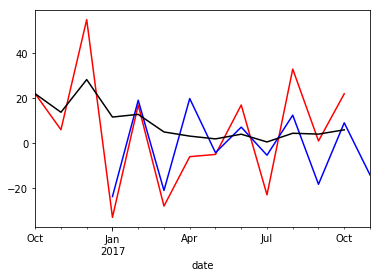

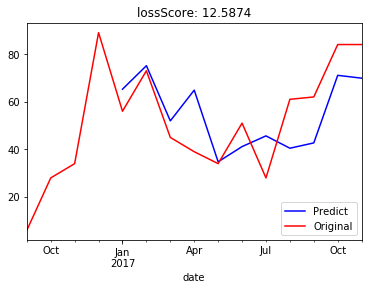

CLASS:  693436


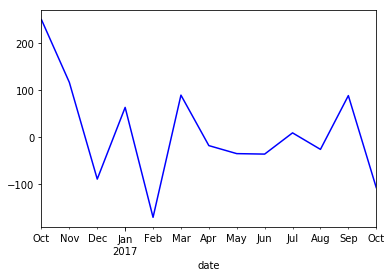

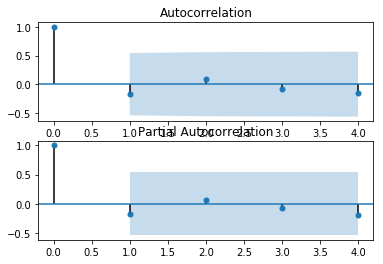

Test Statistic                -0.000000
p-value                        0.958532
#Lags Used                     6.000000
Number of Observations Used    6.000000
Critical Value (5%)           -3.646238
Critical Value (1%)           -5.354256
Critical Value (10%)          -2.901198
dtype: float64
bic:118.52478449064981 and p:3 q:0


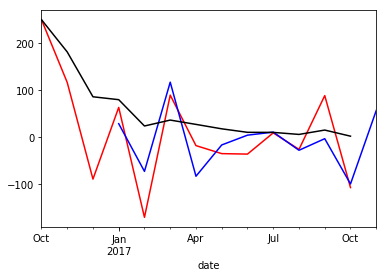

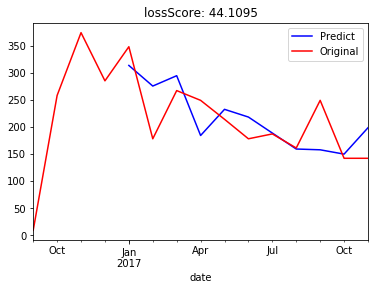

CLASS:  743957


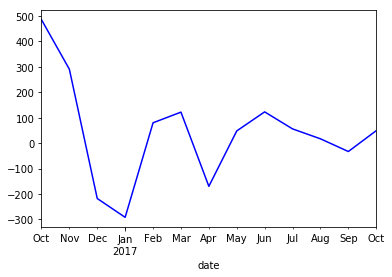

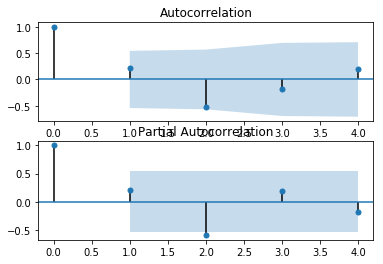

Test Statistic                -0.000000
p-value                        0.958532
#Lags Used                     7.000000
Number of Observations Used    5.000000
Critical Value (5%)           -3.929280
Critical Value (1%)           -6.045114
Critical Value (10%)          -2.986810
dtype: float64
bic:124.72898175951542 and p:3 q:2


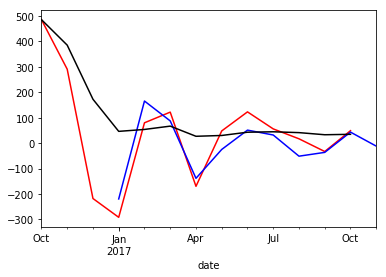

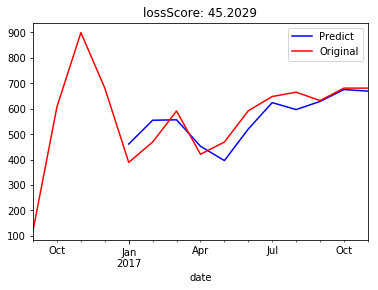

CLASS:  379265


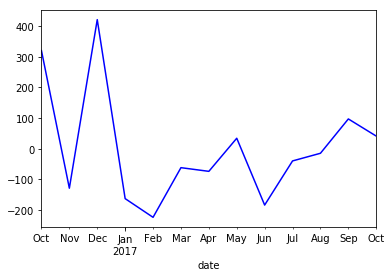

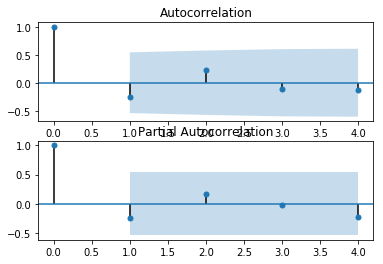

Test Statistic                 -4.417178
p-value                         0.000277
#Lags Used                      2.000000
Number of Observations Used    10.000000
Critical Value (5%)            -3.232950
Critical Value (1%)            -4.331573
Critical Value (10%)           -2.748700
dtype: float64
bic:123.17194693849113 and p:3 q:2


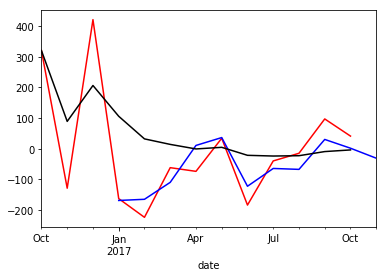

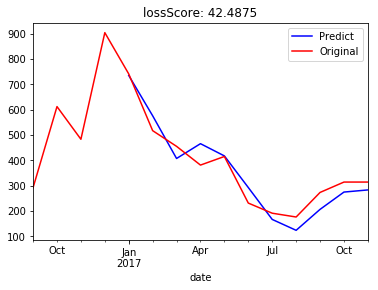

CLASS:  948936


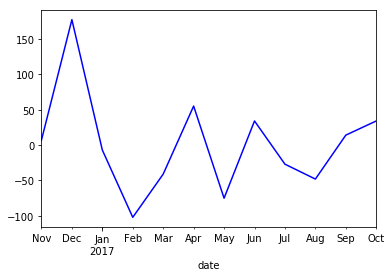

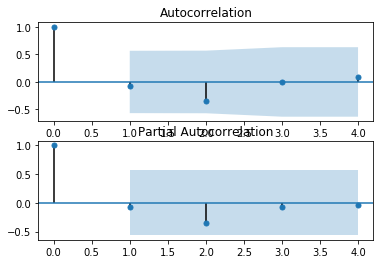

Test Statistic                -0.000000
p-value                        0.958532
#Lags Used                     7.000000
Number of Observations Used    4.000000
Critical Value (5%)           -4.474365
Critical Value (1%)           -7.355441
Critical Value (10%)          -3.126933
dtype: float64
bic:92.46296136110256 and p:3 q:2


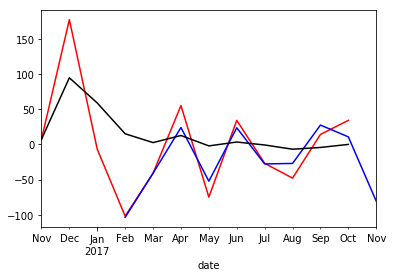

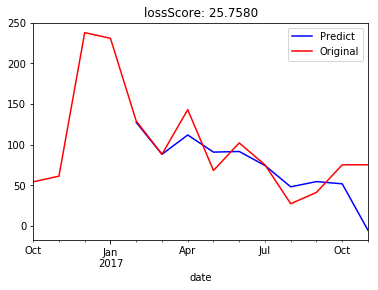

CLASS:  973106


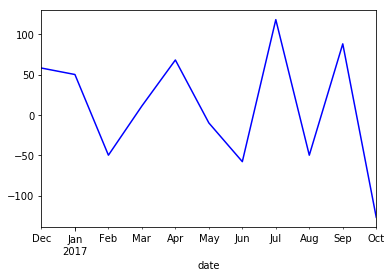

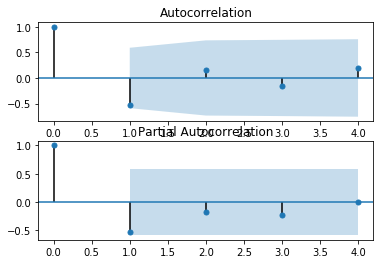

Test Statistic                 -0.000000
p-value                         0.958532
#Lags Used                      7.000000
Number of Observations Used     3.000000
Critical Value (5%)            -5.778381
Critical Value (1%)           -10.417191
Critical Value (10%)           -3.391681
dtype: float64
bic:86.23937059104341 and p:3 q:0


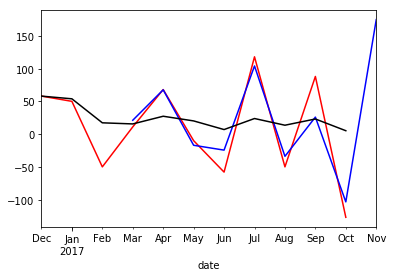

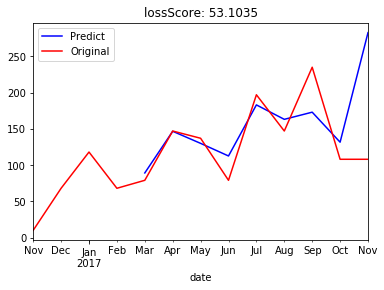

CLASS:  501564


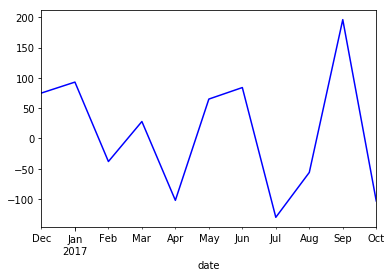

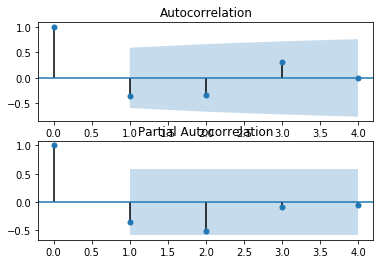

Test Statistic                 -0.000000
p-value                         0.958532
#Lags Used                      7.000000
Number of Observations Used     3.000000
Critical Value (5%)            -5.778381
Critical Value (1%)           -10.417191
Critical Value (10%)           -3.391681
dtype: float64
bic:98.53688514753719 and p:3 q:0


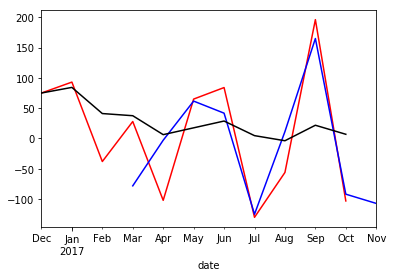

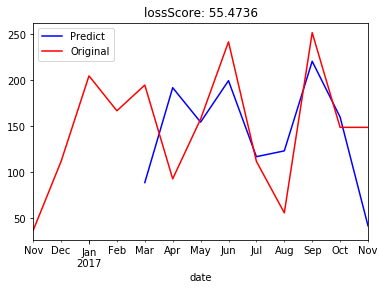

CLASS:  249875


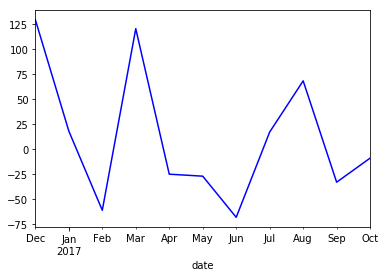

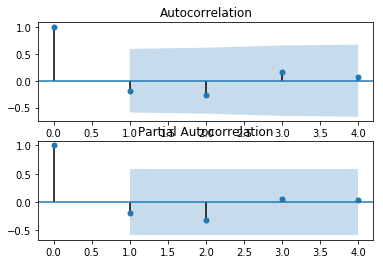

Test Statistic                 -0.000000
p-value                         0.958532
#Lags Used                      7.000000
Number of Observations Used     3.000000
Critical Value (5%)            -5.778381
Critical Value (1%)           -10.417191
Critical Value (10%)           -3.391681
dtype: float64
bic:89.82923128501568 and p:3 q:3


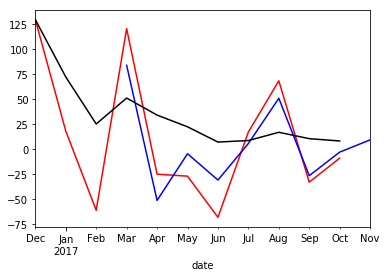

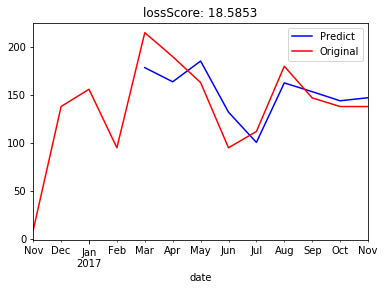

CLASS:  378536


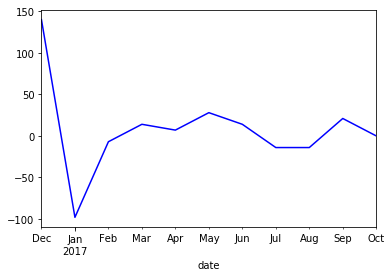

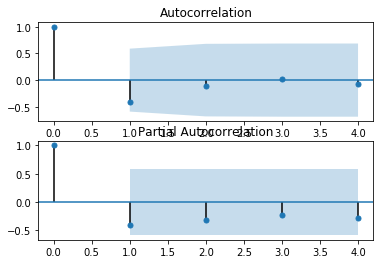

Test Statistic                -0.000000
p-value                        0.958532
#Lags Used                     4.000000
Number of Observations Used    6.000000
Critical Value (5%)           -3.646238
Critical Value (1%)           -5.354256
Critical Value (10%)          -2.901198
dtype: float64
bic:73.04272537324476 and p:3 q:3


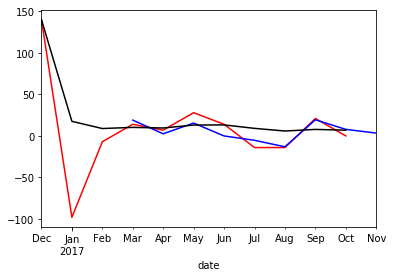

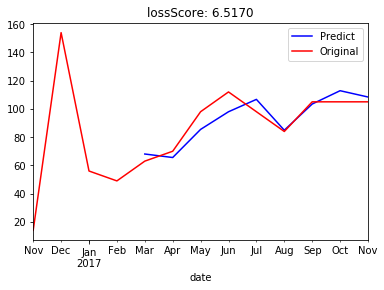

CLASS:  475895


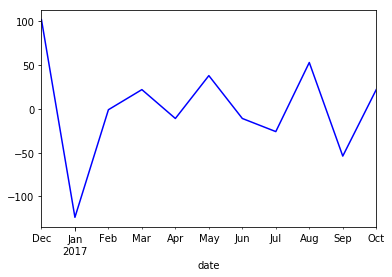

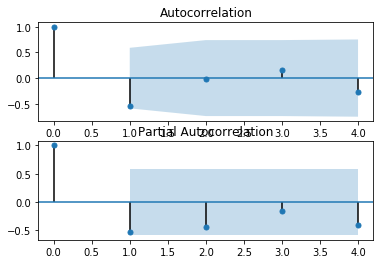

Test Statistic                 -0.000000
p-value                         0.958532
#Lags Used                      7.000000
Number of Observations Used     3.000000
Critical Value (5%)            -5.778381
Critical Value (1%)           -10.417191
Critical Value (10%)           -3.391681
dtype: float64
bic:81.39987774701288 and p:3 q:0


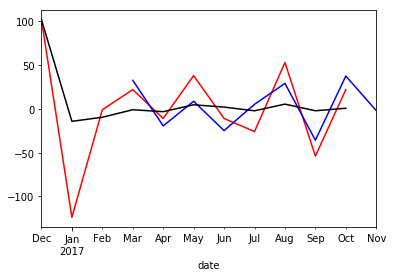

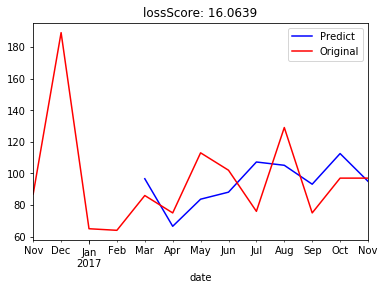

CLASS:  302513


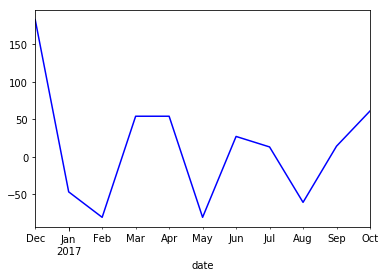

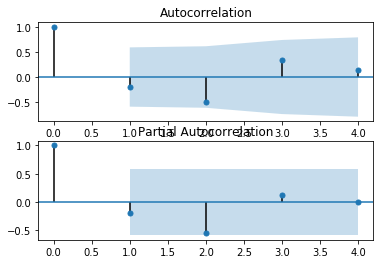

Test Statistic                -0.000000
p-value                        0.958532
#Lags Used                     6.000000
Number of Observations Used    4.000000
Critical Value (5%)           -4.474365
Critical Value (1%)           -7.355441
Critical Value (10%)          -3.126933
dtype: float64
bic:82.50222438919062 and p:3 q:0


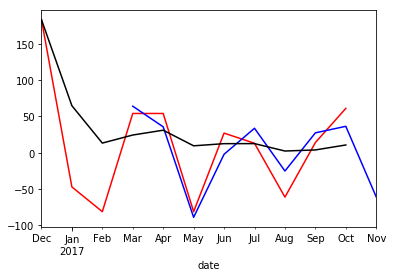

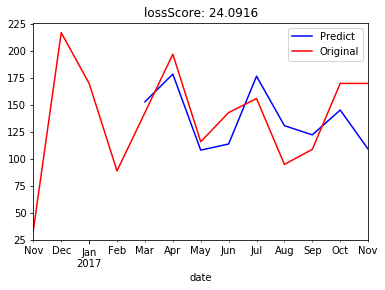

CLASS:  569154


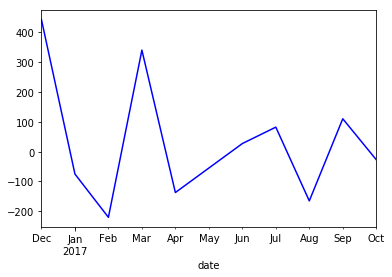

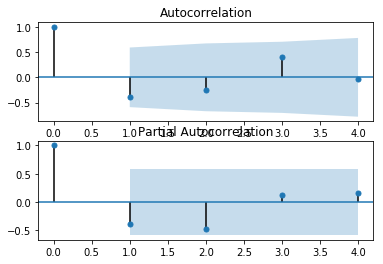

Test Statistic                -9.657250e+00
p-value                        1.383546e-16
#Lags Used                     1.000000e+00
Number of Observations Used    9.000000e+00
Critical Value (5%)           -3.289881e+00
Critical Value (1%)           -4.473135e+00
Critical Value (10%)          -2.772382e+00
dtype: float64
bic:98.08985323068572 and p:3 q:0


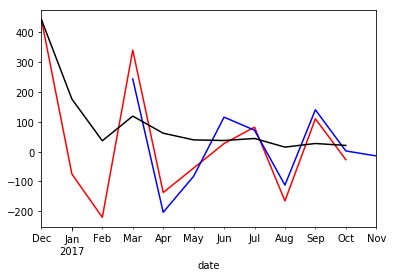

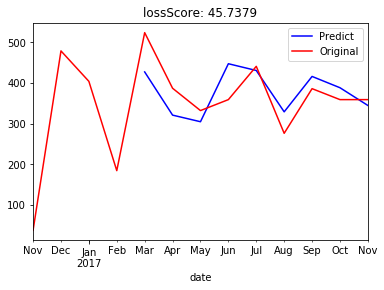

CLASS:  527765


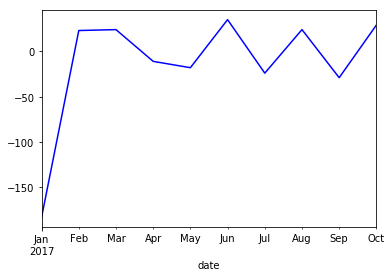

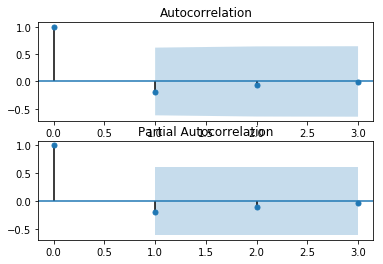

Test Statistic                -5.298127
p-value                        0.000006
#Lags Used                     2.000000
Number of Observations Used    7.000000
Critical Value (5%)           -3.477583
Critical Value (1%)           -4.938690
Critical Value (10%)          -2.843868
dtype: float64
bic:71.36931159490176 and p:1 q:2


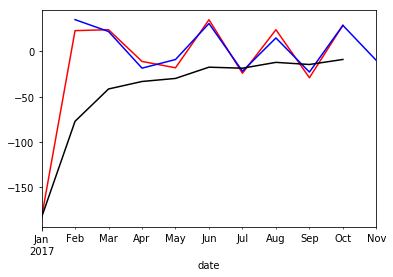

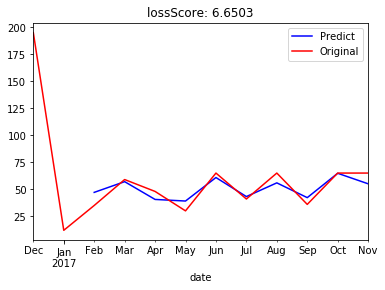

CLASS:  760412


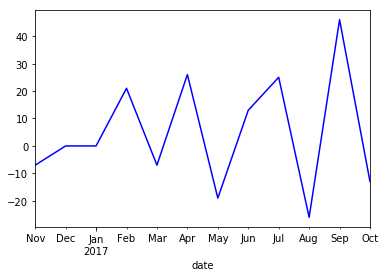

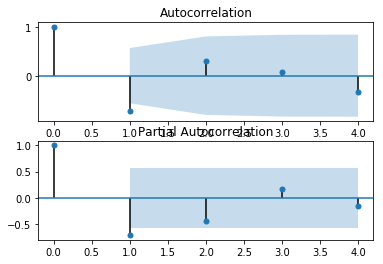

Test Statistic                 -4.378796
p-value                         0.000324
#Lags Used                      1.000000
Number of Observations Used    10.000000
Critical Value (5%)            -3.232950
Critical Value (1%)            -4.331573
Critical Value (10%)           -2.748700
dtype: float64
bic:73.56093900545362 and p:3 q:0


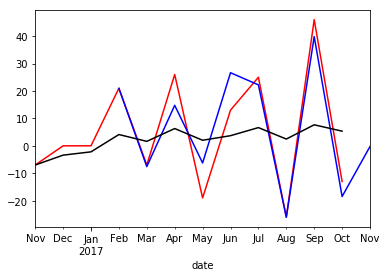

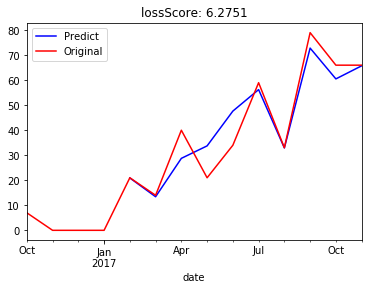

CLASS:  815230


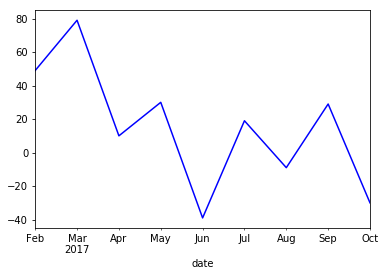

CLASS:  890189


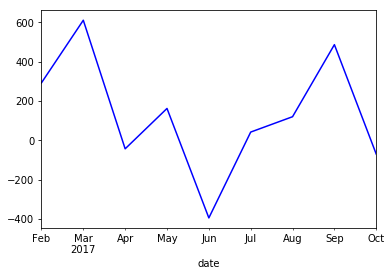

CLASS:  789290


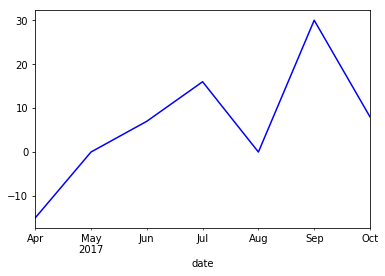

CLASS:  437063


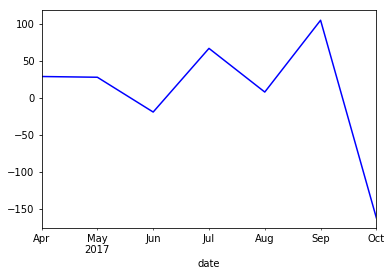

CLASS:  854548


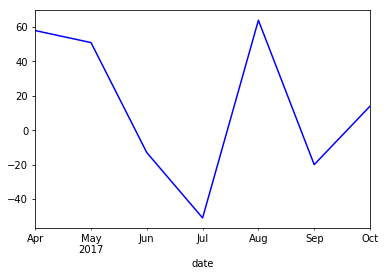

CLASS:  861459


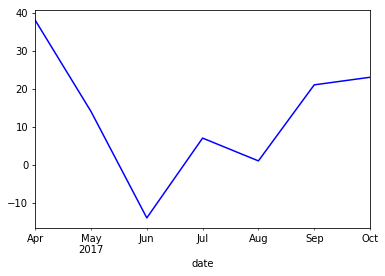

CLASS:  714150


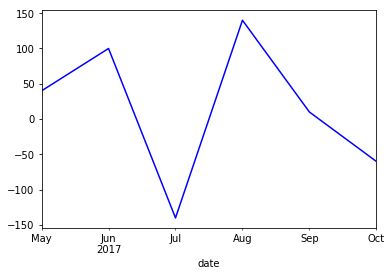

CLASS:  169673


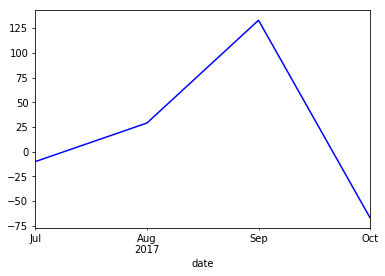

CLASS:  842246


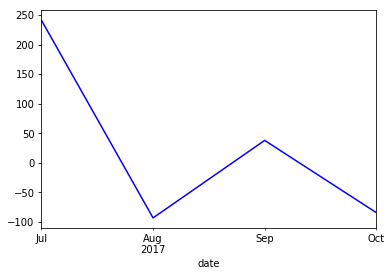

CLASS:  687270


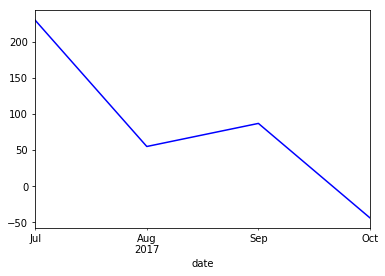

CLASS:  417803


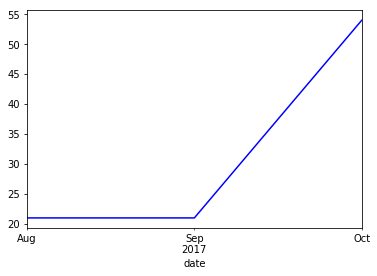

CLASS:  612523


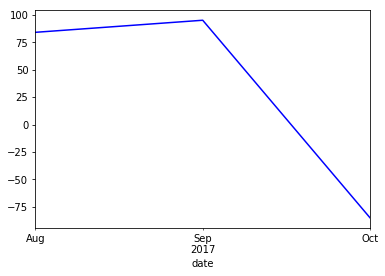

CLASS:  905061


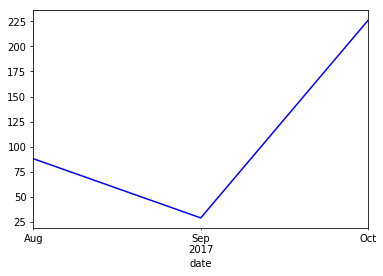

CLASS:  340175


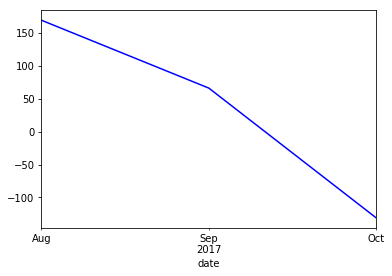

CLASS:  872180


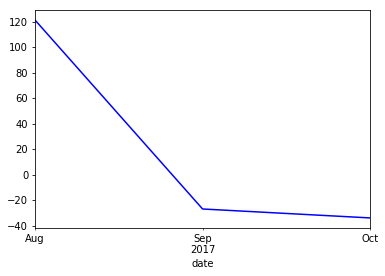

CLASS:  725137


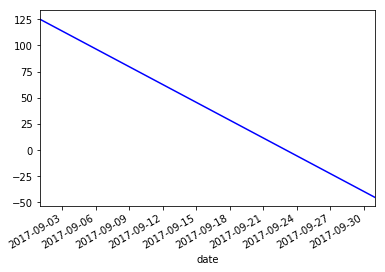

CLASS:  359378


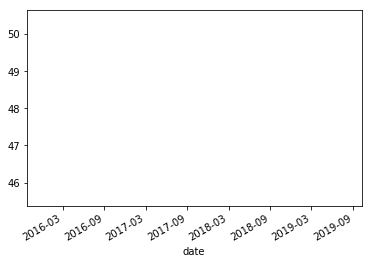

CLASS:  376193


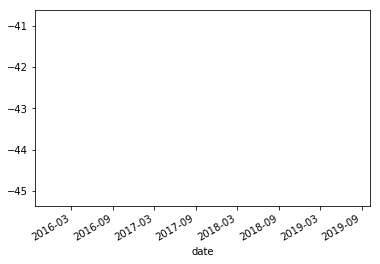

CLASS:  653436


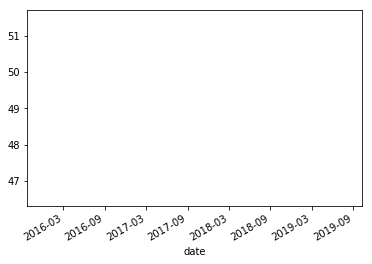

CLASS:  194201


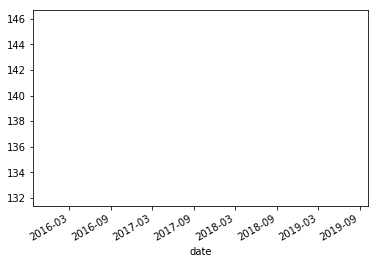

class: [409854, 0.00034867008540800834, 322.66615982687335] and p-value: [194450, 0.63398266092900379, 50.492910308518837] and lossScore: [527809, 0.11948429444249764, 34.141707578758783]
class: [409854, 0.00034867008540800834, 322.66615982687335] and p-value: [194450, 0.63398266092900379, 50.492910308518837] and lossScore: [527809, 0.11948429444249764, 34.141707578758783]
class: [409854, 0.00034867008540800834, 322.66615982687335] and p-value: [194450, 0.63398266092900379, 50.492910308518837] and lossScore: [527809, 0.11948429444249764, 34.141707578758783]
class: [409854, 0.00034867008540800834, 322.66615982687335] and p-value: [194450, 0.63398266092900379, 50.492910308518837] and lossScore: [527809, 0.11948429444249764, 34.141707578758783]
class: [409854, 0.00034867008540800834, 322.66615982687335] and p-value: [194450, 0.63398266092900379, 50.492910308518837] and lossScore: [527809, 0.11948429444249764, 34.141707578758783]
class: [409854, 0.00034867008540800834, 322.66615982687335] 

In [78]:
for value in sorted_result[62:]:
    print('CLASS: ', value[0])
    tempDf = pd.DataFrame(value[1], columns = ['date', 'sale_quantity'])
    tempDf['date'] = tempDf['date'].apply(strToDate)
    tempDf = tempDf.set_index('date')
    tempDf = tempDf['sale_quantity']
    tempDf.sort_index(inplace=True)

    # 差分
    ts_diff_1 = tempDf.diff(1)
    ts_diff_1.dropna(inplace=True)
    draw_ts(ts_diff_1)
    
    dataSize = len(ts_diff_1)
    lags = 15
    if dataSize<45:
        lags = round(dataSize/3)
    if dataSize < 10:
        continue
        
    draw_acf_pacf(ts_diff_1, lags=lags)
    stationarityResult = testStationarity(ts_diff_1)
    print(stationarityResult)

    # model
    bic, p, q, result_arma = proper_model(ts_diff_1, lags)
    print('bic:{} and p:{} q:{}'.format(bic, p, q))
    predict_ts = result_arma.predict(end=datetime(2017, 11, 1))
    
    #draw 残差
    f = plt.figure(facecolor='white')
    ts_diff_1.plot(color='red', label= 'Original')
    predict_ts.plot(color='blue', label = 'Predict')
    expweighted_avg = pd.ewma(ts_diff_1, halflife=12)
    expweighted_avg.plot(color='black', label='AVG')
    plt.show()
    
    # 一阶差分还原
    tempDf[datetime(2017, 11, 1)] = tempDf[datetime(2017, 10, 1)]
    shift_ts = tempDf.shift(1)
    diff_recover_1 = predict_ts.add(shift_ts)
    tempSeries = tempDf[diff_recover_1.index]
    plt.figure(facecolor='white')
    ax = plt.gca()
    ax.xaxis.set_major_locator(years)
    ax.xaxis.set_major_formatter(yearsFmt)
    ax.xaxis.set_minor_locator(months)
    diff_recover_1.plot(color='blue', label='Predict')
    tempDf.plot(color='red', label='Original')
    plt.legend(loc='best')
    lossScore = np.sqrt(sum(((diff_recover_1-tempSeries).dropna())**2)/tempSeries.size)
    plt.title('lossScore: %.4f'% lossScore)
    plt.show()
    
    if stationarityResult['p-value']>0.1 or lossScore > 100:
        failedList.append([value[0], stationarityResult['p-value'], lossScore])
    finalResult[value[0]] = diff_recover_1[datetime(2017, 11, 1)]

for value in failedList:
    print('class: {} and p-value: {} and lossScore: {}'.format(failedList[0], failedList[1], failedList[2]))

In [73]:
len(sorted_result[62][1])

42

In [ ]:
lessCountClass = {789290:92, 437063:92, 854548:120, 861459: 422, 714150:289, 169673: 179, 842246: 322,
                687270: 776, 417803: 0, 612523: 97, 905061: 372, 340175: 145, 872180: 444, 725137: 198,
                359378: 21, 376193: 148, 653436: 244, 194201: 535}

lessCountDf = pd.Series(lessCountClass)
lessCountDf.index.name = 'class_id'
lessCountDf = lessCountDf.reset_index()
df = pd.Series(finalResult)
df.index.name = 'class_id'
df = df.reset_index()

resultDf = pd.concat([df, lessCountDf], ignore_index=True)
testDf = pd.read_csv('../RawData/yancheng_testA_20171225.csv')
resultDf = pd.merge(testDf, resultDf, on='class_id')
resultDf['predict_quantity'] = resultDf[0]
resultDf = resultDf.drop([0], axis=1)
# resultDf['predict_quantity'] = round(resultDf['predict_quantity'])

In [ ]:
resultDf.to_csv('../Predict/predict_result/20180130/yancheng_testA_20171225.csv', index=False)

In [59]:
# # 自相关和偏相关图，默认阶数为31阶
# def draw_acf_pacf(ts, lags=31):
#     f = plt.figure(facecolor='white')
#     ax1 = f.add_subplot(211)
#     plot_acf(ts, lags=lags, ax=ax1)
#     ax2 = f.add_subplot(212)
#     plot_pacf(ts, lags=lags, ax=ax2)
#     plt.show()
# for value in sorted_result[80:]:
#     print('CLASS: ', value[0])
#     tempDf = pd.DataFrame(value[1], columns = ['date', 'sale_quantity'])
#     tempDf['date'] = tempDf['date'].apply(strToDate)
#     tempDf = tempDf.set_index('date')
#     tempDf = tempDf['sale_quantity']
#     tempDf.sort_index(inplace=True)
#     tempDf[datetime(2017, 11, 1)] = tempDf[datetime(2017, 10, 1)]

#     # 差分
#     ts_diff_1 = tempDf.diff(1)
#     ts_diff_1.dropna(inplace=True)
#     sizeData = len(ts_diff_1)
#     draw_ts(ts_diff_1)
    
#     draw_acf_pacf(ts=ts_diff_1, lags=sizeData/2-1)
#     pValue = (adfuller(ts_diff_1))[1]
#     print('pvalue: ', pValue)

#     # model
#     _, _, _, result_arma = proper_model(ts_diff_1, 10)
#     predict_ts = result_arma.predict(end=datetime(2017, 11, 1))
#     # 一阶差分还原
#     shift_ts = tempDf.shift(1)
#     diff_recover_1 = predict_ts.add(shift_ts)
#     tempSeries = tempDf[diff_recover_1.index]
#     plt.figure(facecolor='white')
#     diff_recover_1.plot(color='blue', label='Predict')
#     tempDf.plot(color='red', label='Original')
#     plt.legend(loc='best')
#     plt.title('RMSE: %.4f'% np.sqrt(sum(((diff_recover_1-tempSeries).dropna())**2)/tempSeries.size))
#     plt.show()

#     finalResult[value[0]] = diff_recover_1[datetime(2017, 11, 1)]


In [41]:
[len(x[1]) for x in sorted_result]

[70,
 70,
 70,
 70,
 70,
 70,
 70,
 70,
 70,
 70,
 70,
 70,
 70,
 70,
 70,
 70,
 70,
 70,
 70,
 70,
 70,
 70,
 70,
 70,
 70,
 70,
 70,
 70,
 70,
 70,
 70,
 70,
 70,
 70,
 70,
 70,
 70,
 70,
 70,
 70,
 70,
 70,
 69,
 68,
 67,
 66,
 62,
 61,
 62,
 60,
 59,
 56,
 55,
 54,
 54,
 52,
 52,
 51,
 50,
 49,
 48,
 46,
 42,
 42,
 41,
 41,
 40,
 39,
 39,
 39,
 38,
 38,
 37,
 37,
 36,
 34,
 34,
 34,
 33,
 32,
 30,
 30,
 29,
 28,
 28,
 28,
 27,
 27,
 26,
 24,
 23,
 22,
 21,
 21,
 20,
 20,
 20,
 20,
 19,
 19,
 18,
 18,
 17,
 16,
 16,
 15,
 14,
 14,
 14,
 14,
 13,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 11,
 13,
 10,
 10,
 8,
 8,
 8,
 8,
 7,
 5,
 5,
 5,
 4,
 4,
 4,
 4,
 4,
 3,
 2,
 2,
 2,
 2]

In [ ]:
# # 差分操作
# def diff_ts(ts, d):
#     global shift_ts_list
#     #  动态预测第二日的值时所需要的差分序列
#     global last_data_shift_list
#     shift_ts_list = []
#     last_data_shift_list = []
#     tmp_ts = ts
#     for i in d:
#         last_data_shift_list.append(tmp_ts[-i])
#         print last_data_shift_list
#         shift_ts = tmp_ts.shift(i)
#         shift_ts_list.append(shift_ts)
#         tmp_ts = tmp_ts - shift_ts
#     tmp_ts.dropna(inplace=True)
#     return tmp_ts

# # 还原操作
# def predict_diff_recover(predict_value, d):
#     if isinstance(predict_value, float):
#         tmp_data = predict_value
#         for i in range(len(d)):
#             tmp_data = tmp_data + last_data_shift_list[-i-1]
#     elif isinstance(predict_value, np.ndarray):
#         tmp_data = predict_value[0]
#         for i in range(len(d)):
#             tmp_data = tmp_data + last_data_shift_list[-i-1]
#     else:
#         tmp_data = predict_value
#         for i in range(len(d)):
#             try:
#                 tmp_data = tmp_data.add(shift_ts_list[-i-1])
#             except:
#                 raise ValueError('What you input is not pd.Series type!')
#         tmp_data.dropna(inplace=True)
#     return tmp_data